In [42]:
import numpy as np
import pandas as pd
import gc
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow.keras.backend as K


In [2]:
print("Using Tensorflow {}".format(tf.__version__))
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("{} GPUs found".format(len(physical_devices)))
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print("Using {}".format(physical_devices[0]))


Using Tensorflow 2.1.0
1 GPUs found
Using PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [3]:
tf.random.set_seed(1234)

TESTING = False


In [4]:

# Network hyperparameters from arXiv:1903.02433

# Training
BATCH_SIZE = 128 # 128 in paper
EPOCHS = 30 # 500000 in paper, but on much smaller dataset
PRETRAIN_EPOCHS = 20

# Adam hyperparameters
LEARNING_RATE = 1e-5 # TODO: Learning rate scheduler
BETA_1 = 0.5
BETA_2 = 0.9

# SGD hyperparameters
SGD_LEARNING_RATE = 0.01

# Architecture
NOISE_DIM = 128 # 64 in Gitlab

# Plotting
PREFIX = "img/{:.0f}D-{}batchsize-".format(NOISE_DIM, BATCH_SIZE)
DRAW_INTERVAL = 10
BINS = 25
if TESTING:
    SAMPLE_SIZE = 2000
else:
    SAMPLE_SIZE = 20000

In [5]:


filenames = {
    "herwig": "events_anomalydetection_DelphesHerwig_qcd_features.h5",
    "pythiabg": "events_anomalydetection_DelphesPythia8_v2_qcd_features.h5",
    "pythiasig": "events_anomalydetection_DelphesPythia8_v2_Wprime_features.h5"
}

datatypes = ["herwig", "pythiabg", "pythiasig"]

train_features = ["ptj1", "etaj1", "mj1", "ptj2", "etaj2", "phij2", "mj2", "tau21j1", "tau21j2"]
condition_features = ["mjj"]

features = train_features + condition_features
GEN_DIM = NOISE_DIM + len(condition_features)
DISC_DIM = len(features)

In [6]:

def load_data(datatype, stop = None, rotate = True, flip_eta = True):
    input_frame = pd.read_hdf(filenames[datatype], stop = stop)
    output_frame = pd.DataFrame(dtype = "float32")

    for jet in ["j1", "j2"]:
        output_frame["pt" + jet] = np.sqrt(input_frame["px" + jet]**2 + input_frame["py" + jet]**2)
        output_frame["eta" + jet] = np.arcsinh(input_frame["pz" + jet] / output_frame["pt" + jet])
        output_frame["phi" + jet] = np.arctan2(input_frame["py" + jet], input_frame["px" + jet])
        output_frame["m" + jet] = input_frame["m" + jet]
        output_frame["p" + jet] = np.sqrt(input_frame["pz" + jet]**2 + output_frame["pt" + jet]**2)
        output_frame["e" + jet] = np.sqrt(output_frame["m" + jet]**2 + output_frame["p" + jet]**2)
        output_frame["tau21" + jet] = input_frame["tau2" + jet] / input_frame["tau1" + jet]
        output_frame["tau32" + jet] = input_frame["tau3" + jet] / input_frame["tau2" + jet]
    
    del input_frame
    gc.collect()

    # Not exact rotation, since negative angles for phi2 are flipped across the x-axis. Should be OK due to symmetry.
    if rotate:
        output_frame["phij2"] = np.abs(output_frame["phij2"] - output_frame["phij1"])
        output_frame["phij1"] = 0
    
    if flip_eta:
        flipped_frame = output_frame.copy()
        flipped_frame["etaj1"] *= -1
        flipped_frame["etaj2"] *= -1
        output_frame = output_frame.append(flipped_frame)
        del flipped_frame
        gc.collect()
    
    for jet in ["j1", "j2"]:
        output_frame["px" + jet] = output_frame["pt" + jet] * np.cos(output_frame["phi" + jet])
        output_frame["py" + jet] = output_frame["pt" + jet] * np.sin(output_frame["phi" + jet])
        output_frame["pz" + jet] = output_frame["pt" + jet] * np.sinh(output_frame["eta" + jet])
    
    # Dijet properties
    output_frame["pxjj"] = output_frame["pxj1"] + output_frame["pxj2"]
    output_frame["pyjj"] = output_frame["pyj1"] + output_frame["pyj2"]
    output_frame["pzjj"] = output_frame["pzj1"] + output_frame["pzj2"]
    output_frame["ejj"] = output_frame["ej1"] + output_frame["ej2"]
    output_frame["pjj"] = np.sqrt(output_frame["pxjj"]**2 + output_frame["pyjj"]**2 + output_frame["pzjj"]**2)
    output_frame["mjj"] = np.sqrt(output_frame["ejj"]**2 - output_frame["pjj"]**2)

    # NaNs may arise from overly sparse jets with tau1 = 0, tau2 = 0, etc.
    output_frame.dropna(inplace = True)
    output_frame.reset_index(drop = True, inplace = True)
    
    return output_frame.astype('float32')

In [7]:

if TESTING:
    df_bg = load_data("pythiabg", stop = 10000)
    df_sig = load_data("pythiasig", stop = 1000)
else:
    df_bg = load_data("pythiabg")
    df_sig = load_data("pythiasig")

df_bg_SB = df_bg[((df_bg["mjj"] > 3100) & (df_bg["mjj"] < 3300)) | ((df_bg["mjj"] > 3700) & (df_bg["mjj"] < 3900))]
df_bg_SR = df_bg[(df_bg["mjj"] >= 3300) & (df_bg["mjj"] <= 3700)]

df_sig_SB = df_sig[((df_sig["mjj"] > 3100) & (df_sig["mjj"] < 3300)) | ((df_sig["mjj"] > 3700) & (df_sig["mjj"] < 3900))] # This should pretty much be empty
df_sig_SR = df_sig[(df_sig["mjj"] >= 3300) & (df_sig["mjj"] <= 3700)]

df_bg_SB.reset_index(drop = True, inplace = True)
df_bg_SR.reset_index(drop = True, inplace = True)
df_sig_SB.reset_index(drop = True, inplace = True)
df_sig_SR.reset_index(drop = True, inplace = True)

print("df_bg shape {}".format(df_bg.shape))
print("df_sig shape {}".format(df_sig.shape))
print("df_bg_SB shape {}".format(df_bg_SB.shape))
print("df_bg_SR shape {}".format(df_bg_SR.shape))
print("df_sig_SB shape {}".format(df_sig_SB.shape))
print("df_sig_SR shape {}".format(df_sig_SR.shape))
print()


df_bg shape (1999760, 28)
df_sig shape (199930, 28)
df_bg_SB shape (260148, 28)
df_bg_SR shape (242678, 28)
df_sig_SB shape (31520, 28)
df_sig_SR shape (150596, 28)



In [8]:

def cut_data(uncut_data, pTmin = 1200, etamax = 2.5):
    # Column 0: ptj1
    # Column 1: etaj1
    # Column 3: ptj2
    # Column 4: etaj2
    return uncut_data[((uncut_data[:,0] > pTmin) & (np.abs(uncut_data[:,1]) < etamax)) | ((uncut_data[:,3] > pTmin) & (np.abs(uncut_data[:,4]) < etamax))]


In [9]:
np_bg_SB = cut_data(np.array(df_bg_SB[features]))
np_bg_SR = cut_data(np.array(df_bg_SR[features]))
np_sig_SR = cut_data(np.array(df_sig_SR[features]))
np_combined_SR = np.concatenate((np_bg_SR, np_sig_SR), axis = 0)
del df_bg_SB
del df_bg_SR
del df_sig_SB
del df_sig_SR
gc.collect()

# Ensures all training batches have same size
np_bg_SB_trimmed = np.delete(np_bg_SB, [i for i in range(np_bg_SB.shape[0] % (BATCH_SIZE * 4))], axis = 0)

# Normalize inputs between -1 and 1, mjj between 0 and 1
scaler = MinMaxScaler((-1,1)).fit(np_bg_SB_trimmed[:,:-1])
scaler_mjj = MinMaxScaler((0,1)).fit(np_bg_SB_trimmed[:,-1].reshape(-1,1))
np_bg_SB_scaled = np.concatenate((scaler.transform(np_bg_SB_trimmed[:,:-1]), scaler_mjj.transform(np_bg_SB_trimmed[:,-1].reshape(-1,1))), axis = 1)

X_train, X_test = train_test_split(np_bg_SB_scaled, test_size = 0.25, random_state = 1234)
len_dataset = int(X_train.shape[0] / BATCH_SIZE)
len_testset = int(X_test.shape[0] / BATCH_SIZE)
print("Dataset consists of {} batches of {} samples each, total {} samples".format(len_dataset, BATCH_SIZE, len_dataset * BATCH_SIZE))
print("Testset consists of {} batches of {} samples each, total {} samples".format(len_testset, BATCH_SIZE, len_testset * BATCH_SIZE))

train_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_train)).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_test)).batch(BATCH_SIZE)

Dataset consists of 1524 batches of 128 samples each, total 195072 samples
Testset consists of 508 batches of 128 samples each, total 65024 samples


In [47]:

def make_generator_model():

    model = tf.keras.Sequential()
    # explicit input dimensions
    model.add(tf.keras.Input(shape = (GEN_DIM,)))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(128))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(56))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(units=len(train_features),name="Gen_LR5"))

    

    return model

In [10]:
def make_generator_model():
    model = tf.keras.Sequential()

    model.add(tf.keras.Input(shape = (GEN_DIM,)))
    model.add(layers.Dense(128, kernel_initializer = 'glorot_uniform'))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization())
    
    model.add(layers.Reshape((8, 8, 2)))

    model.add(layers.Conv2DTranspose(32, kernel_size = 2, strides = 1, padding = "same"))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2DTranspose(16, kernel_size = 3, strides = 1, padding = "same"))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())
    model.add(layers.Dense(len(train_features), activation = 'tanh'))

    return model


In [51]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.Input(shape = (DISC_DIM,)))
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.1))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.1))
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.1))
    model.add(layers.Dense(128))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.1))
    model.add(layers.Dense(1, activation = 'sigmoid'))

    return model

In [11]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    model.add(tf.keras.Input(shape = (DISC_DIM,)))
    model.add(layers.Dense(128))    
    model.add(layers.Reshape((8, 8, 2)))

    model.add(layers.Conv2D(64, kernel_size = 3, strides = 1, padding = "same"))
    model.add(layers.LeakyReLU(alpha = 0.2))

    model.add(layers.Conv2D(32, kernel_size = 3, strides = 1, padding = "same"))
    model.add(layers.LeakyReLU(alpha = 0.2))

    model.add(layers.Conv2D(16, kernel_size = 3, strides = 1, padding = "same"))
    model.add(layers.LeakyReLU(alpha = 0.2))

    model.add(layers.Flatten())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.2))
    model.add(layers.Dense(1, activation = 'sigmoid'))

    return model


In [48]:
generator = make_generator_model()
generator.summary()
print()


Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 512)               66560     
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 512)               2048      
_________________________________________________________________
batch_normalization_8 (Batch (None, 512)               2048      
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 256)              

In [52]:
discriminator = make_discriminator_model()
discriminator.summary()
print()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 1024)              11264     
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 1024)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 256)              

In [53]:
mse = tf.keras.losses.MeanSquaredError()
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)

In [54]:
@tf.function
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [55]:
@tf.function
def generator_loss(fake_output):
    return mse(tf.ones_like(fake_output), fake_output)

In [56]:
# Paper optimizer:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1, beta_2=BETA_2)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1, beta_2=BETA_2)

#generator_optimizer = tf.keras.optimizers.Adam(SGD_LEARNING_RATE)
#discriminator_optimizer = tf.keras.optimizers.Adam(SGD_LEARNING_RATE)


In [57]:
# Convert tensor to float for loss function plotting
# (Random code from StackOverflow) - don't really know what does, but it works
def K_eval(x):
    try:
        return K.get_value(K.to_dense(x))
    except:
        eval_fn = K.function([], [x])
        return eval_fn([])[0]


In [58]:
@tf.function
def train_step_generator(labels):
  labels_rescaled = labels * 2 - 1

  gen_input = tf.concat([tf.random.uniform([BATCH_SIZE, NOISE_DIM]), labels], 1)

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_vector = generator(gen_input, training=True)
    fake_output = discriminator(tf.concat([generated_vector, labels_rescaled], 1), training=True)
    gen_loss = generator_loss(fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  
  return gen_loss


In [59]:
@tf.function
def train_step_discriminator(vectors, labels):
  labels_rescaled = labels * 2 - 1
  gen_input = tf.concat([tf.random.uniform([BATCH_SIZE, NOISE_DIM]), labels], 1)

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_vector = generator(gen_input, training=True)

    real_output = discriminator(tf.concat([vectors, labels_rescaled], 1), training=True)
    fake_output = discriminator(tf.concat([generated_vector, labels_rescaled], 1), training=True)
    
    disc_loss = discriminator_loss(real_output, fake_output)

  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  
  return disc_loss

In [60]:
@tf.function
def evaluate_generator(labels):
  labels_rescaled = labels * 2 - 1
  gen_input = tf.concat([tf.random.uniform([BATCH_SIZE, NOISE_DIM]), labels], 1)

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_vector = generator(gen_input, training=False)
    fake_output = discriminator(tf.concat([generated_vector, labels_rescaled], 1), training=False)
    gen_loss = generator_loss(fake_output)
  
  return gen_loss


In [61]:
@tf.function
def evaluate_discriminator(vectors, labels):
  labels_rescaled = labels * 2 - 1
  gen_input = tf.concat([tf.random.uniform([BATCH_SIZE, NOISE_DIM]), labels], 1)

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_vector = generator(gen_input, training=False)

    real_output = discriminator(tf.concat([vectors, labels_rescaled], 1), training=False)
    fake_output = discriminator(tf.concat([generated_vector, labels_rescaled], 1), training=False)
    
    disc_loss = discriminator_loss(real_output, fake_output)
  
  return disc_loss

In [62]:
def sample_labels(refdata = np_bg_SB, size = BATCH_SIZE):
    rand_idx = np.random.choice(refdata.shape[0], size = size)
    return refdata[rand_idx, -1].reshape((-1,1))

In [63]:
def graph_gan(generator, epoch, mode = "bg_SB"):
    plt.close()

    if mode == "bg_SB":
        realdata = np_bg_SB
        label = "Background Sideband"
        ganlabel = "GAN"
        title = "Background SB Generation (Normalized to Unity)"
    elif mode == "bg_SR":
        realdata = np_bg_SR
        label = "Background Signal Region"
        ganlabel = "GAN Interpolation"
        title = "Background SR Interpolation (Normalized to Unity)"
    elif mode == "sig_SR":
        realdata = np_sig_SR
        label = "BSM Signal"
        ganlabel = "GAN Interpolation"
        title = "BSM Signal Interpolation (Normalized to Unity)"
    elif mode == "combined_SR":
        realdata = np_combined_SR
        label = "Mixed Signal Region"
        ganlabel = "GAN Interpolation"
        title = "Mixed Data SR Interpolation (Normalized to Unity)"
    else:
        raise ValueError("Unexpected mode {} in graph_gan()".format(mode))

    labels = sample_labels(refdata = realdata, size = SAMPLE_SIZE) # Sample mjj from the existing distribution of mjj for comparison
    labels_scaled = scaler_mjj.transform(labels.reshape(-1,1))
    
    fakedata_uncut_unscaled = generator(tf.concat([tf.random.uniform((SAMPLE_SIZE, NOISE_DIM)), labels_scaled], 1), training=False)
    fakedata_uncut = np.concatenate((scaler.inverse_transform(fakedata_uncut_unscaled), labels.reshape(-1,1)), axis = 1)

    # At least one jet has pT > 1200 and |eta| < 2.5
    fakedata = cut_data(fakedata_uncut)
    
    f, a = plt.subplots(3, 3, constrained_layout=True)

    f.suptitle(title)

    a[0, 0].set_title("Leading jet pT")
    a[0, 0].set_xlabel("$pT_{J_1}$")
    a[0, 0].hist(realdata[:,0], bins = BINS, range = (1200, 2000), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[0, 0].hist(fakedata[:,0], bins = BINS, range = (1200, 2000), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[0, 1].set_title("Leading jet eta")
    a[0, 1].set_xlabel("$\\eta_{J_1}$")
    a[0, 1].hist(realdata[:,1], bins = BINS, range = (0, 2.5), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[0, 1].hist(fakedata[:,1], bins = BINS, range = (0, 2.5), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[0, 2].set_title("Leading jet mass")
    a[0, 2].set_xlabel("$m_{J_1}$")
    a[0, 2].hist(realdata[:,2], bins = BINS, range = (0, 750), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[0, 2].hist(fakedata[:,2], bins = BINS, range = (0, 750), color = "tab:blue", histtype = "step", label = ganlabel, density = True)
    
    a[1, 0].set_title("Subleading jet pT")
    a[1, 0].set_xlabel("$pT_{J_2}$")
    a[1, 0].hist(realdata[:,3], bins = BINS, range = (500, 2000), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[1, 0].hist(fakedata[:,3], bins = BINS, range = (500, 2000), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[1, 1].set_title("Subleading jet eta")
    a[1, 1].set_xlabel("$\\eta_{J_2}$")
    a[1, 1].hist(realdata[:,4], bins = BINS, range = (0, 2.5), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[1, 1].hist(fakedata[:,4], bins = BINS, range = (0, 2.5), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[1, 2].set_title("Subleading jet mass")
    a[1, 2].set_xlabel("$m_{21J_2}$")
    a[1, 2].hist(realdata[:,6], bins = BINS, range = (0, 750), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[1, 2].hist(fakedata[:,6], bins = BINS, range = (0, 750), color = "tab:blue", histtype = "step", label = ganlabel, density = True)
    
    a[2, 0].set_title("Leading jet tau21")
    a[2, 0].set_xlabel("$\\tau_{21J_1}$")
    a[2, 0].hist(realdata[:,7], bins = BINS, range = (0, 1), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[2, 0].hist(fakedata[:,7], bins = BINS, range = (0, 1), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[2, 1].set_title("Subleading jet tau21")
    a[2, 1].set_xlabel("$\\tau_{21J_2}$")
    a[2, 1].hist(realdata[:,8], bins = BINS, range = (0, 1), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[2, 1].hist(fakedata[:,8], bins = BINS, range = (0, 1), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[2, 2].set_title("Dijet mass")
    a[2, 2].set_xlabel("$m_{JJ}$")
    a[2, 2].hist(realdata[:,9], bins = BINS, range = (1500, 5500), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[2, 2].hist(fakedata[:,9], bins = BINS, range = (1500, 5500), color = "tab:blue", histtype = "step", label = ganlabel, density = True)
    # a[2, 2].legend(loc="right") # Too cramped
    
    if TESTING:
        plt.show()
    else:
        plt.show()


In [64]:
train_gen_losses = []
train_disc_losses = []
test_gen_losses = []
test_disc_losses = []


In [65]:
def graph_losses(epoch):
    plt.close()

    f, (ax1, ax2) = plt.subplots(2, 1, constrained_layout=True)

    f.suptitle("Loss Functions")

    ax1.set_title("Generator Loss")
    ax1.set_ylabel("Mean-Square Error")
    ax1.plot(train_gen_losses, 'b', label = "Training loss")
    ax1.plot(test_gen_losses, 'r', label = "Validation loss")
    ax1.legend(loc="upper right")

    ax2.set_title("Discriminator Loss")
    ax2.set_ylabel("Binary Cross-Entropy")
    ax2.set_xlabel("Epoch")
    ax2.plot(train_disc_losses, 'b', label = "Training loss")
    ax2.plot(test_disc_losses, 'r', label = "Validation loss")

    if TESTING:
        plt.show()
    else:
        plt.show()

# TODO: Pre-train discriminator

In [66]:
def train(dataset, testset, epochs, pretrain = False):
    for epoch in tqdm(range(epochs)):
        print_losses = False #((epoch + 1) % 10 == 0)

        if pretrain:
            draw_outputs = False
        else:
            draw_outputs = ((epoch + 1) % DRAW_INTERVAL == 0)

        train_gen_loss = 0
        train_disc_loss = 0

        test_gen_loss = 0
        test_disc_loss = 0

        # Training

        for batchnum, image_batch in enumerate(dataset):
            vectors = image_batch[:,:-1]
            labels = tf.reshape(image_batch[:,-1], (BATCH_SIZE,1))
            if pretrain:
                train_step_discriminator(vectors, labels)
            else:
                train_disc_loss += K_eval(train_step_discriminator(vectors, labels)) / len_dataset
                train_gen_loss += K_eval(train_step_generator(tf.constant(scaler_mjj.transform(sample_labels()), dtype = tf.float32))) / len_dataset

        if not pretrain:
            train_gen_losses.append(train_gen_loss)
            train_disc_losses.append(train_disc_loss)

        # Evaluation
        if not pretrain:
            for batchnum, test_batch in enumerate(testset):
                vectors = test_batch[:,:-1]
                labels = tf.reshape(test_batch[:,-1], (BATCH_SIZE,1))
                test_gen_loss += K_eval(evaluate_generator(tf.constant(scaler_mjj.transform(sample_labels()), dtype = tf.float32))) / len_testset
                test_disc_loss += K_eval(evaluate_discriminator(vectors, labels)) / len_testset

        if not pretrain:
            test_gen_losses.append(test_gen_loss)
            test_disc_losses.append(test_disc_loss)

        # Logging

        if print_losses:
            print()
            print("Epoch " + str(epoch + 1) + ":")
            print()
            print("Generator training loss: " + str(train_gen_losses[-1]))
            print("Discriminator training loss: " + str(train_disc_losses[-1]))
            print()
            print("Generator validation loss: " + str(test_gen_losses[-1]))
            print("Discriminator validation loss: " + str(test_disc_losses[-1]))

        if draw_outputs:
            print()
            print("Epoch " + str(epoch + 1) + ":")
            graph_gan(generator, epoch + 1, mode = "bg_SB")
            graph_gan(generator, epoch + 1, mode = "bg_SR")
            graph_gan(generator, epoch + 1, mode = "sig_SR")
            graph_gan(generator, epoch + 1, mode = "combined_SR")
            graph_losses(epoch + 1)

In [67]:
print("Now pre-training discriminator for {} epochs".format(PRETRAIN_EPOCHS))
train(train_dataset, test_dataset, PRETRAIN_EPOCHS, pretrain = True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Now pre-training discriminator for 20 epochs
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Bad argument number for Name: 3, expecting 4
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Bad argument number for Name: 3, expecting 4
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Bad argument number for Name: 3, expecting 4
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Bad argument number for Name: 3, expecting 4


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:14<00:00,  3.74s/it]


  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

Now training model for 30 epochs


  1%|▋                                                                              | 9/1000 [01:19<2:26:30,  8.87s/it]


Epoch 10:


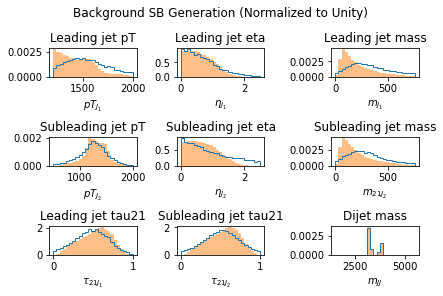

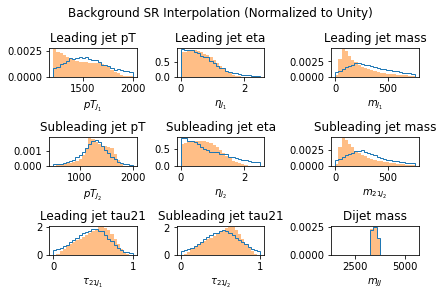

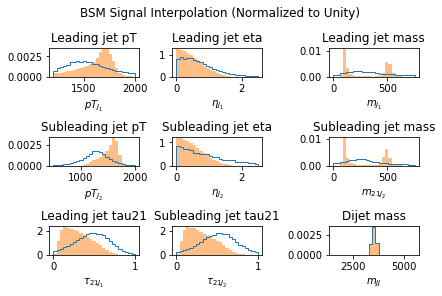

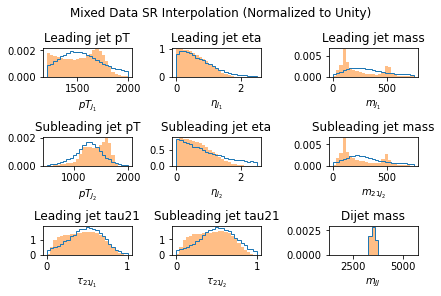

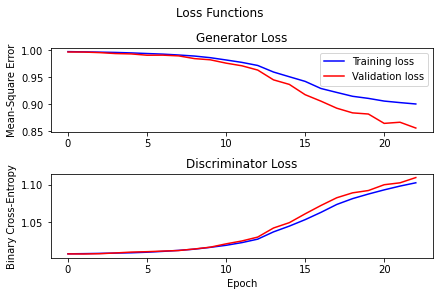

  2%|█▍                                                                            | 19/1000 [02:52<2:23:41,  8.79s/it]


Epoch 20:


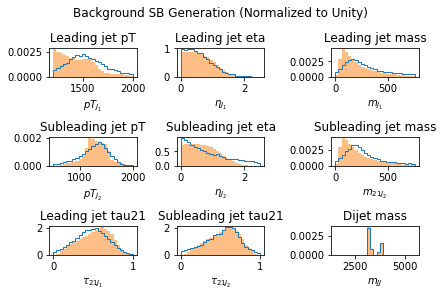

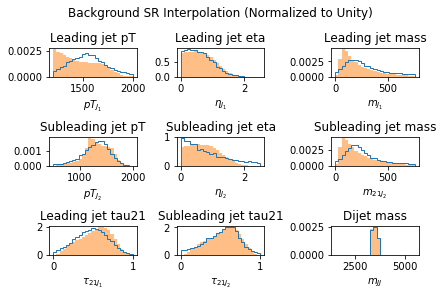

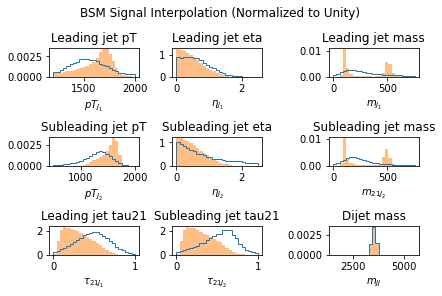

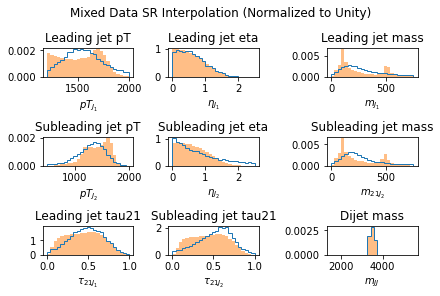

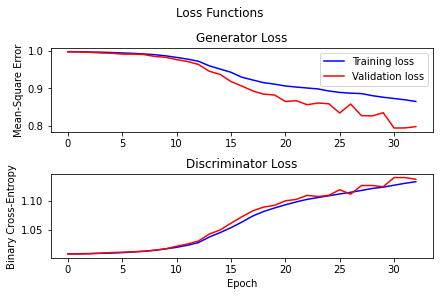

  3%|██▎                                                                           | 29/1000 [04:26<2:23:18,  8.86s/it]


Epoch 30:


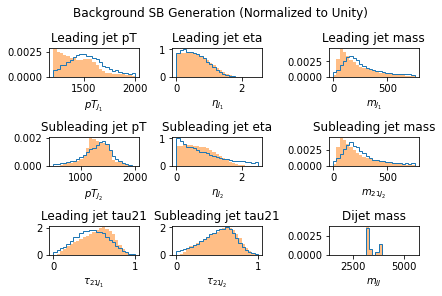

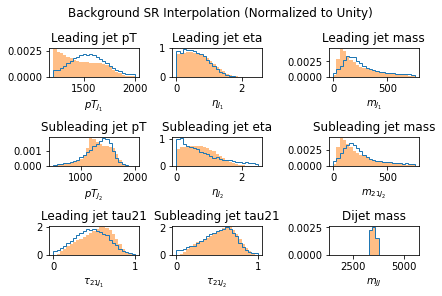

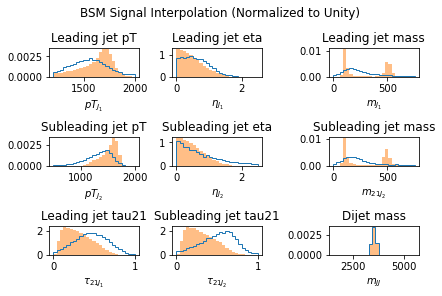

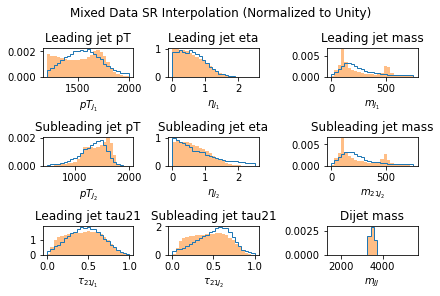

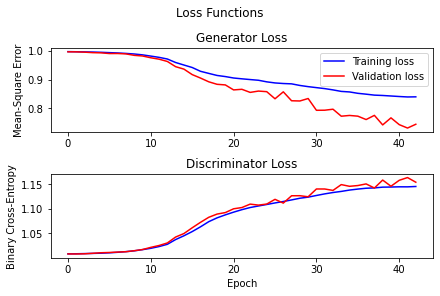

  4%|███                                                                           | 39/1000 [06:00<2:20:59,  8.80s/it]


Epoch 40:


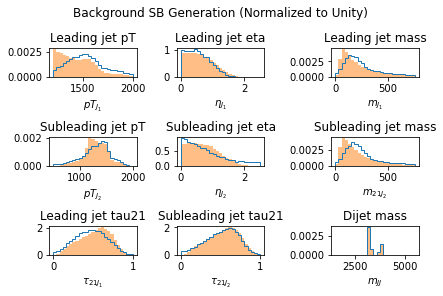

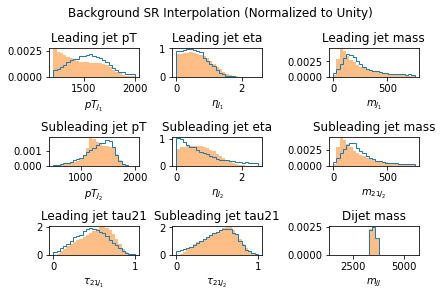

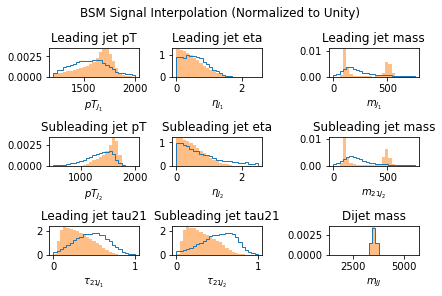

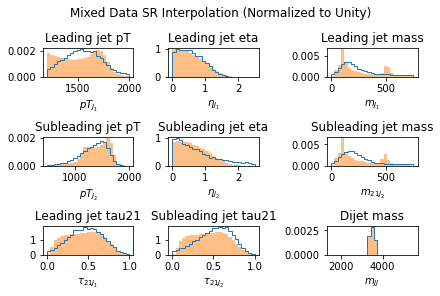

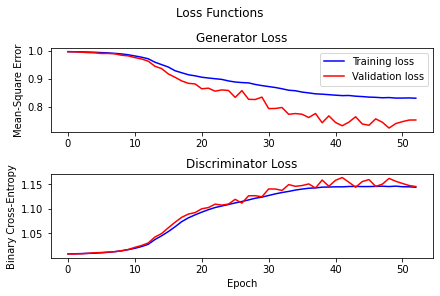

  5%|███▊                                                                          | 49/1000 [07:31<2:12:56,  8.39s/it]


Epoch 50:


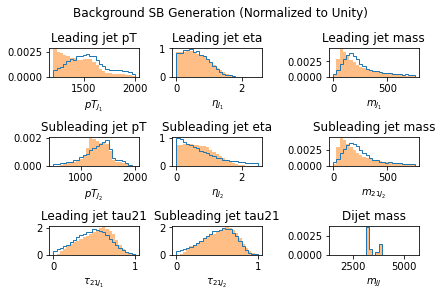

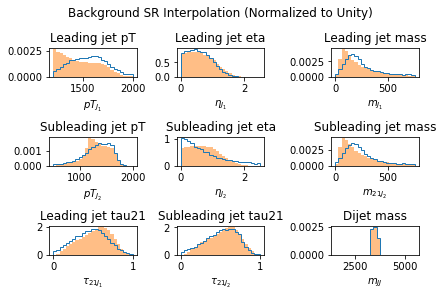

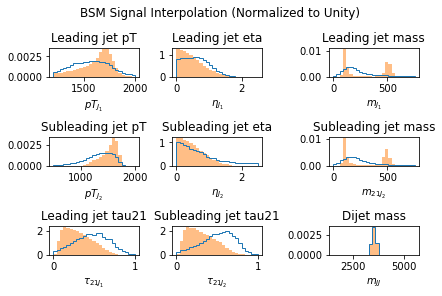

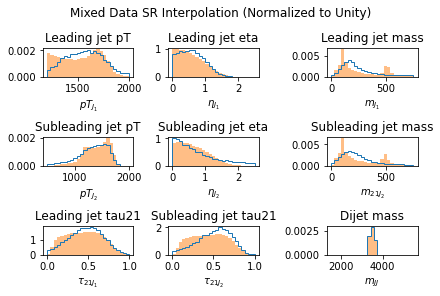

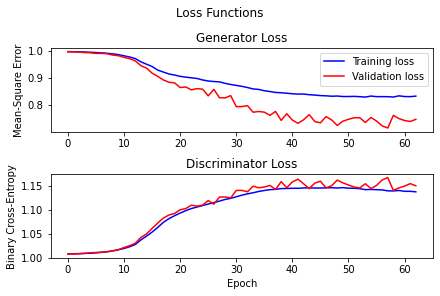

  6%|████▌                                                                         | 59/1000 [09:00<2:15:26,  8.64s/it]


Epoch 60:


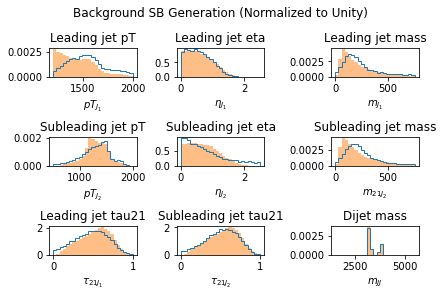

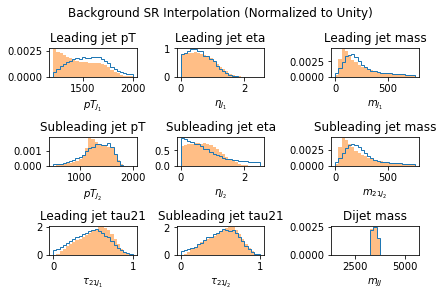

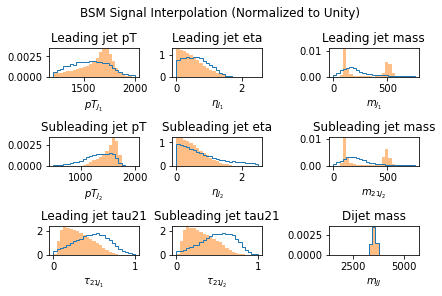

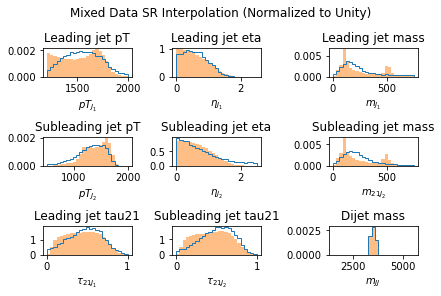

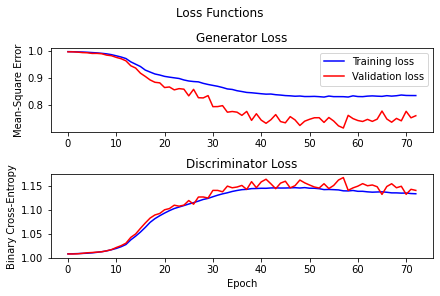

  7%|█████▍                                                                        | 69/1000 [10:33<2:20:10,  9.03s/it]


Epoch 70:


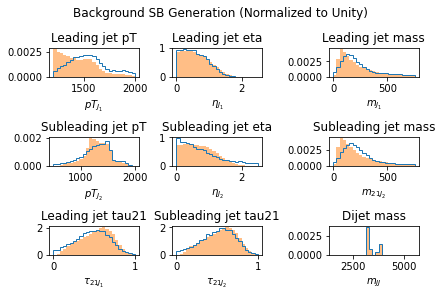

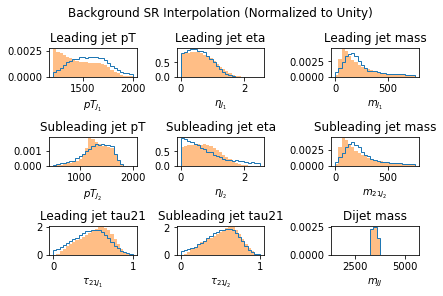

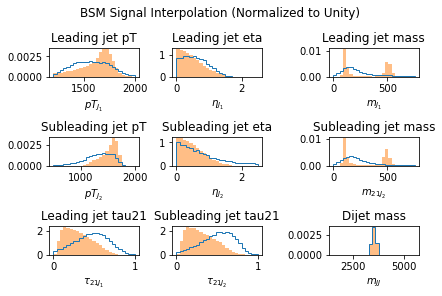

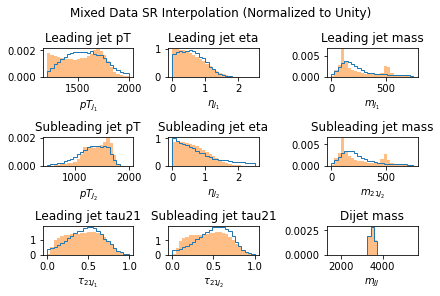

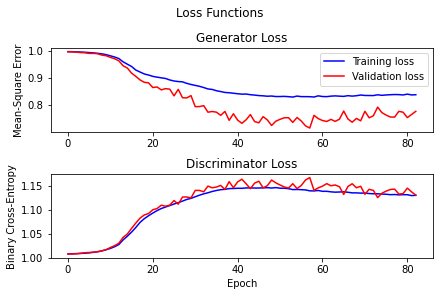

  8%|██████▏                                                                       | 79/1000 [12:04<2:15:37,  8.84s/it]


Epoch 80:


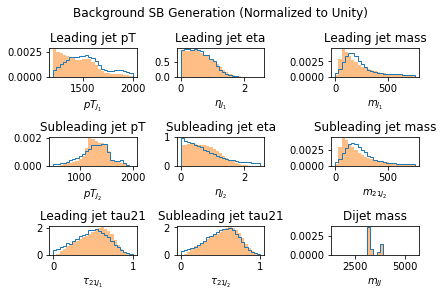

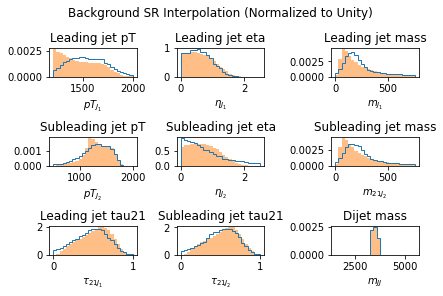

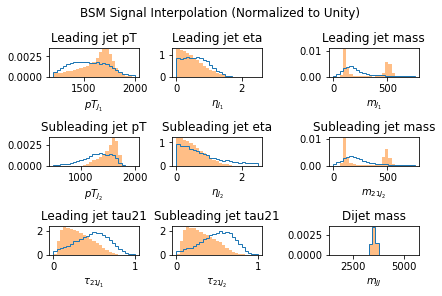

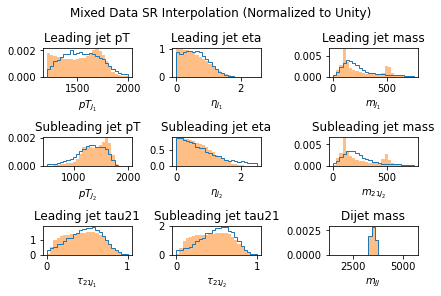

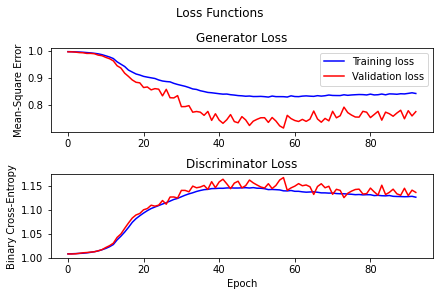

  9%|██████▉                                                                       | 89/1000 [13:34<2:07:19,  8.39s/it]


Epoch 90:


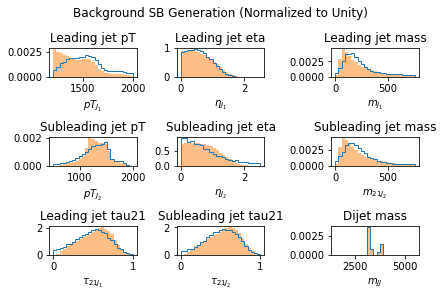

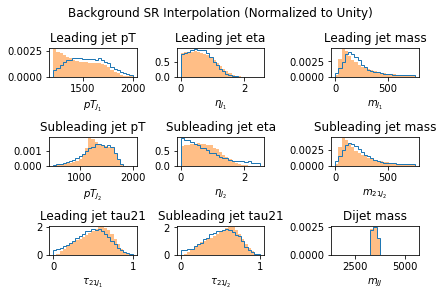

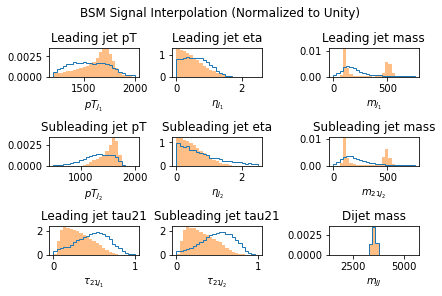

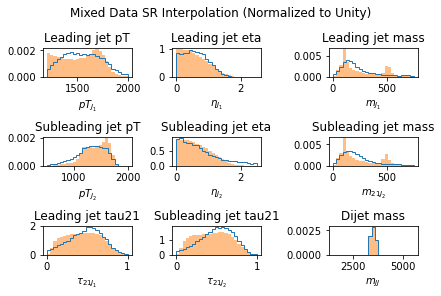

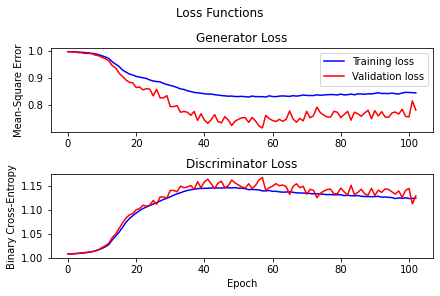

 10%|███████▋                                                                      | 99/1000 [15:07<2:14:15,  8.94s/it]


Epoch 100:


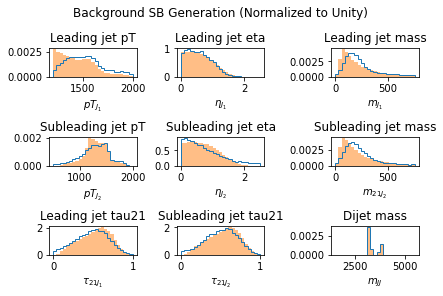

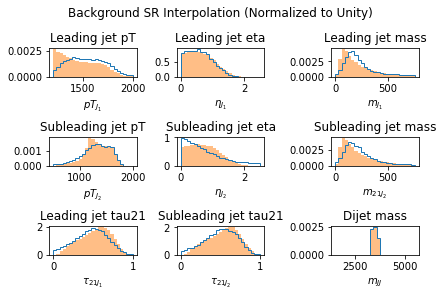

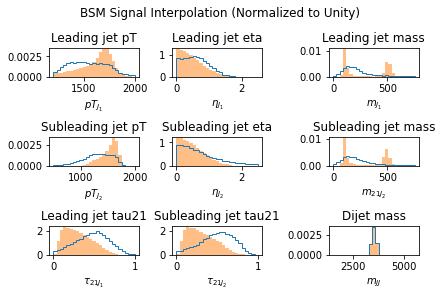

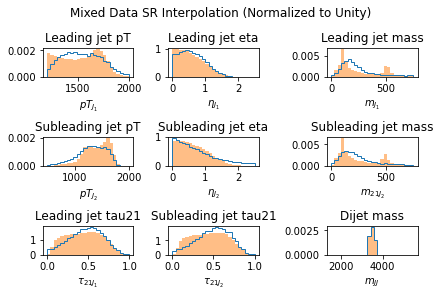

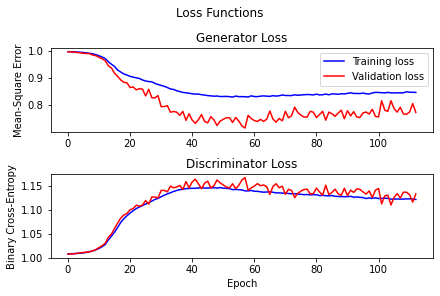

 11%|████████▍                                                                    | 109/1000 [16:42<2:12:35,  8.93s/it]


Epoch 110:


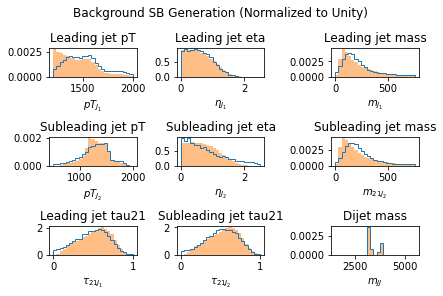

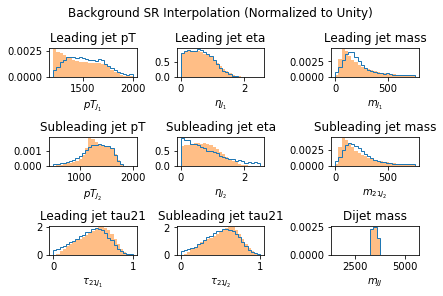

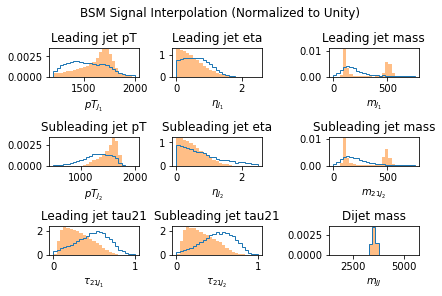

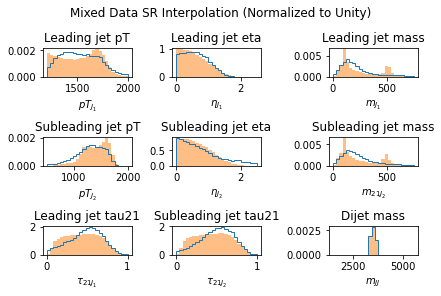

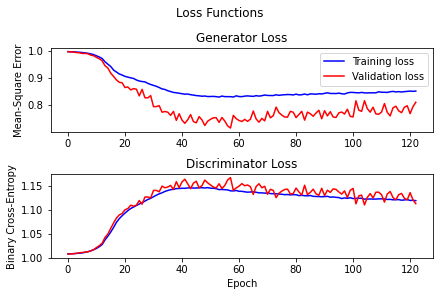

 12%|█████████▏                                                                   | 119/1000 [18:17<2:15:47,  9.25s/it]


Epoch 120:


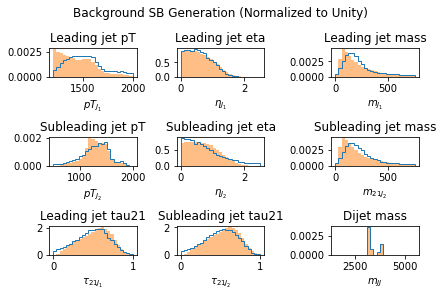

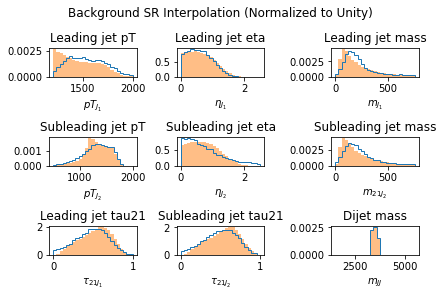

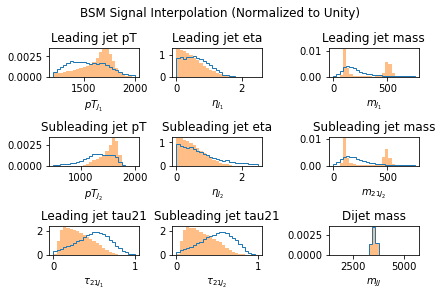

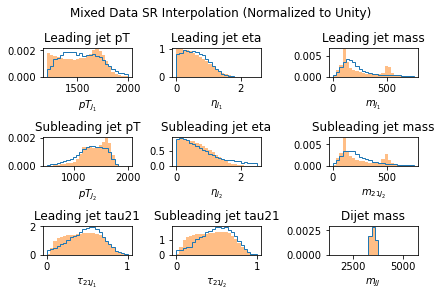

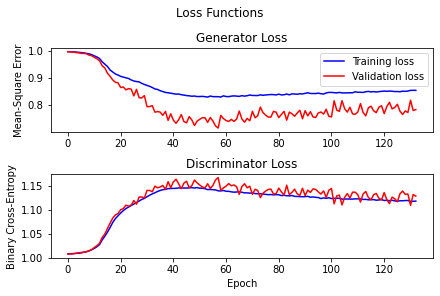

 13%|█████████▉                                                                   | 129/1000 [19:53<2:12:02,  9.10s/it]


Epoch 130:


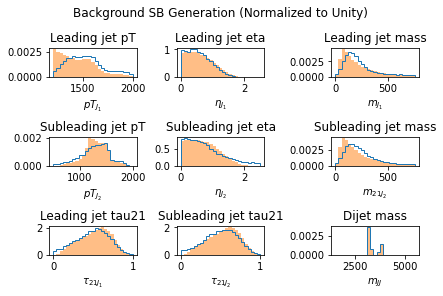

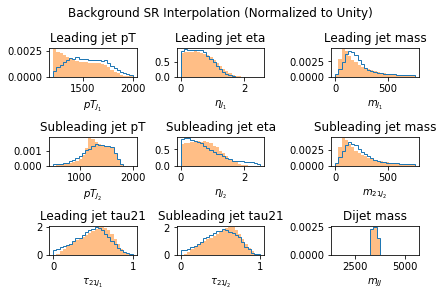

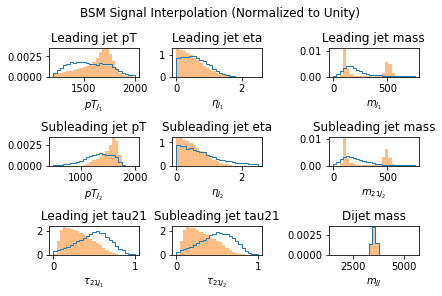

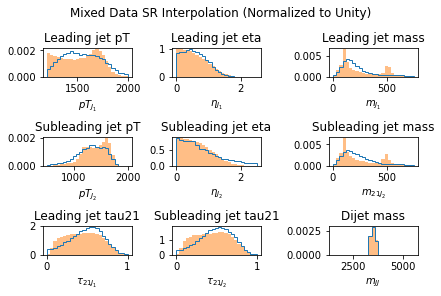

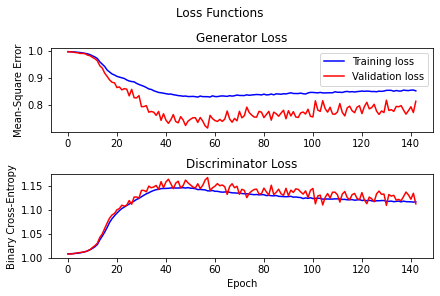

 14%|██████████▋                                                                  | 139/1000 [21:25<2:05:43,  8.76s/it]


Epoch 140:


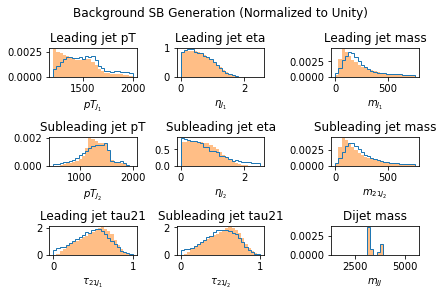

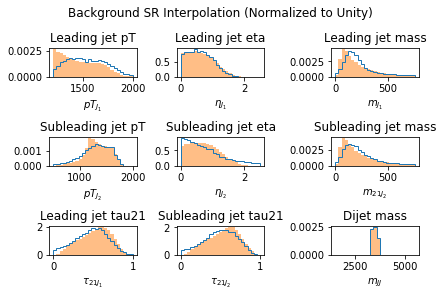

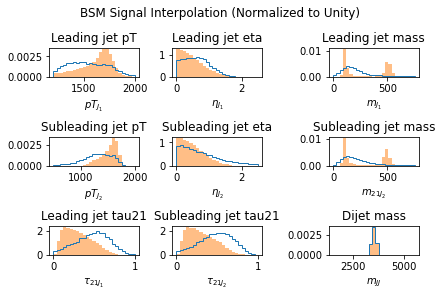

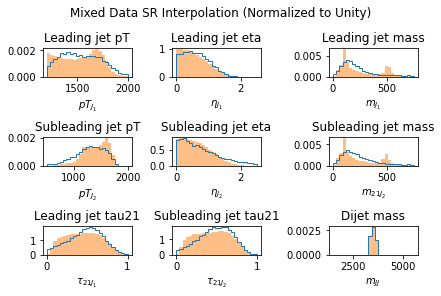

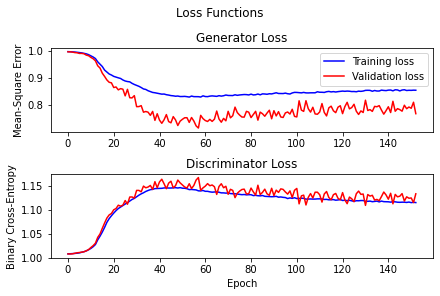

 15%|███████████▍                                                                 | 149/1000 [22:58<2:04:09,  8.75s/it]


Epoch 150:


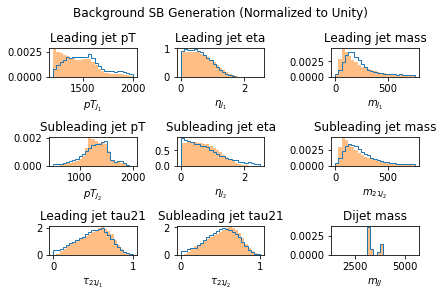

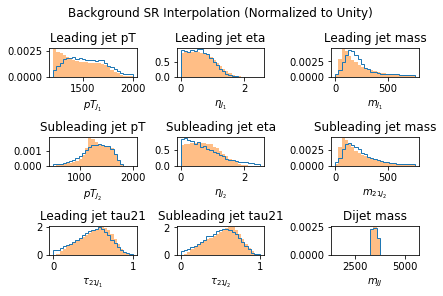

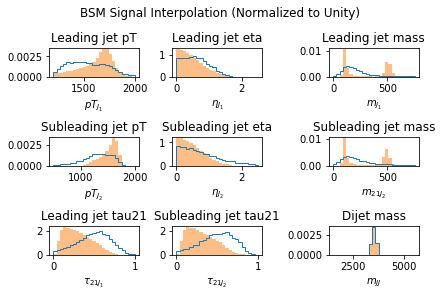

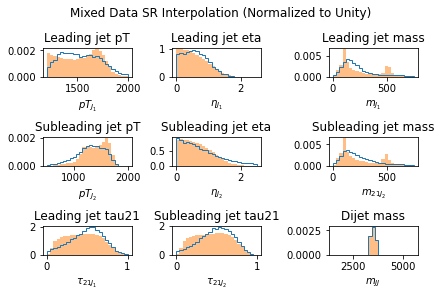

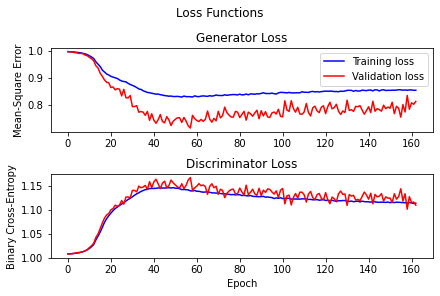

 16%|████████████▏                                                                | 159/1000 [24:30<2:00:39,  8.61s/it]


Epoch 160:


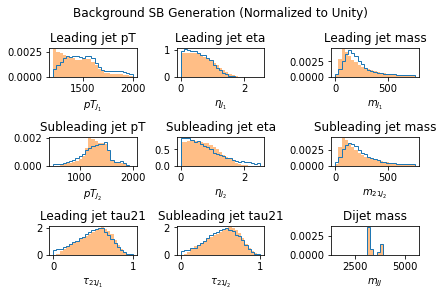

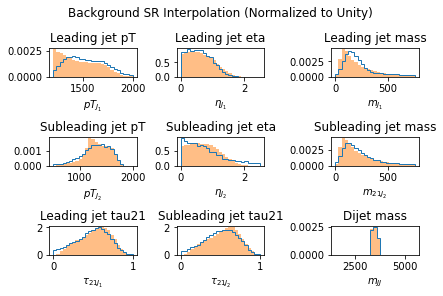

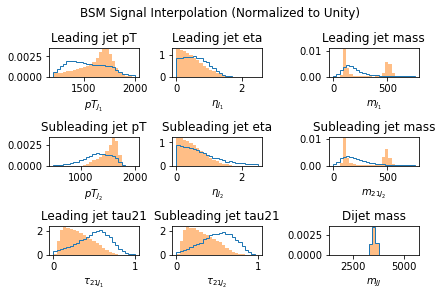

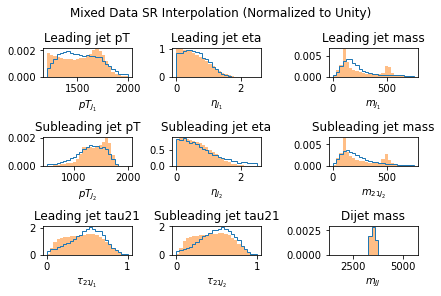

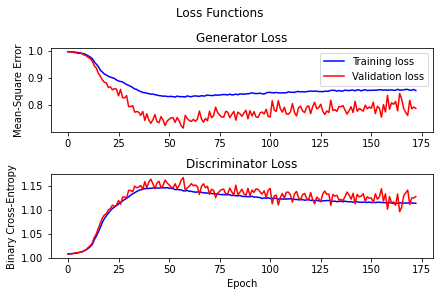

 17%|█████████████                                                                | 169/1000 [25:59<1:56:48,  8.43s/it]


Epoch 170:


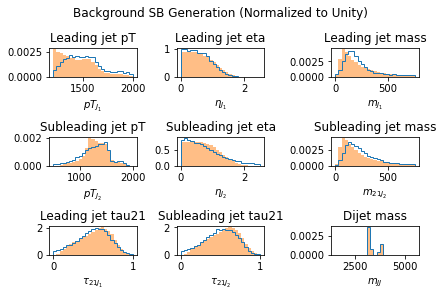

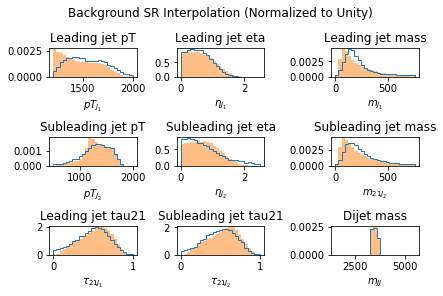

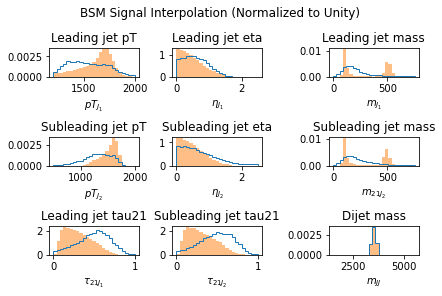

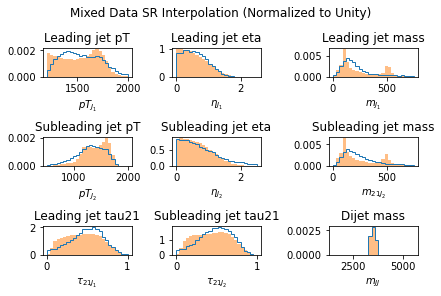

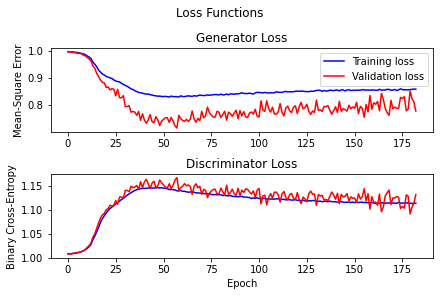

 18%|█████████████▊                                                               | 179/1000 [27:28<1:55:38,  8.45s/it]


Epoch 180:


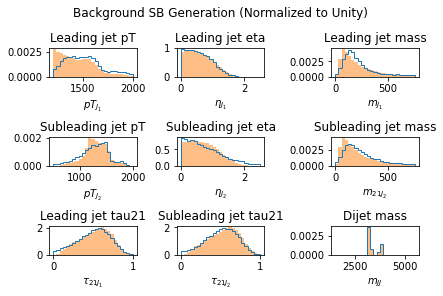

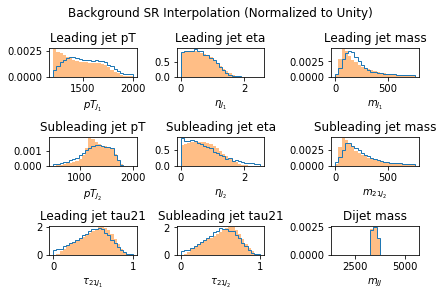

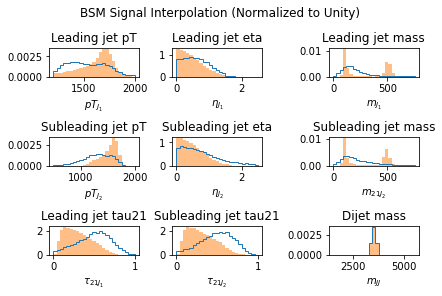

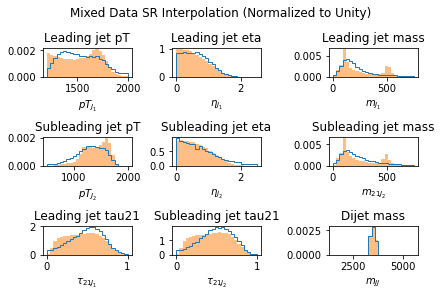

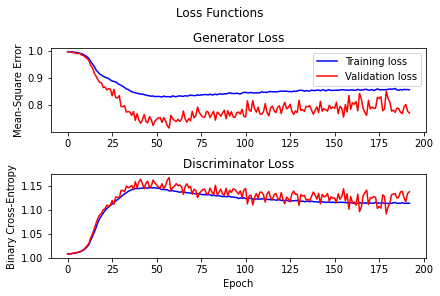

 19%|██████████████▌                                                              | 189/1000 [29:00<1:59:11,  8.82s/it]


Epoch 190:


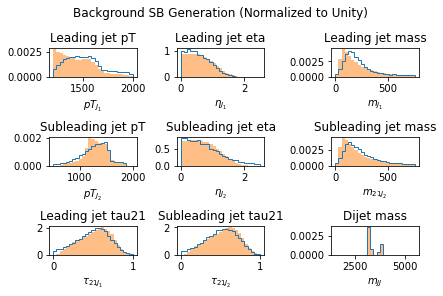

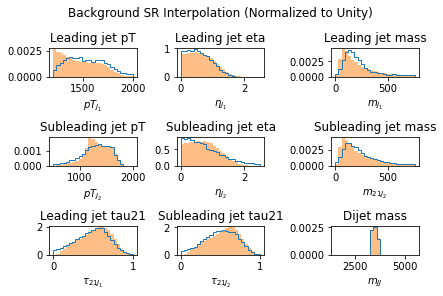

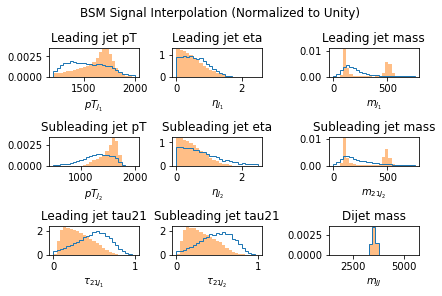

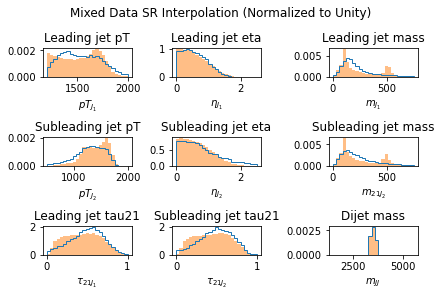

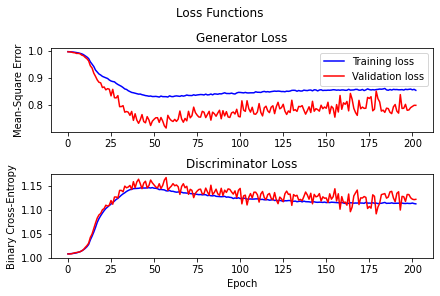

 20%|███████████████▎                                                             | 199/1000 [30:40<2:06:04,  9.44s/it]


Epoch 200:


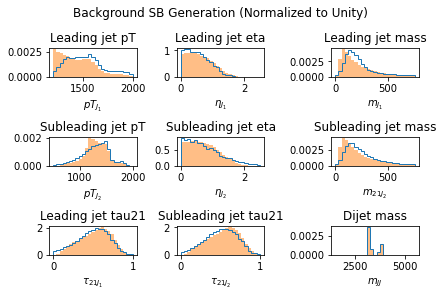

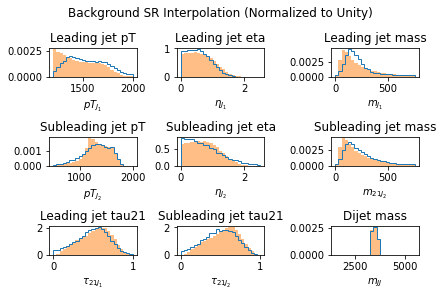

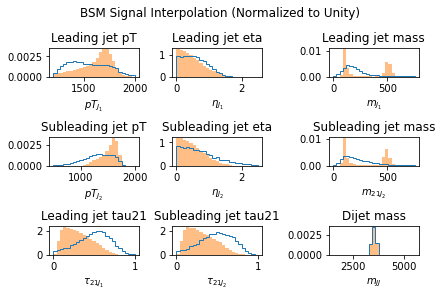

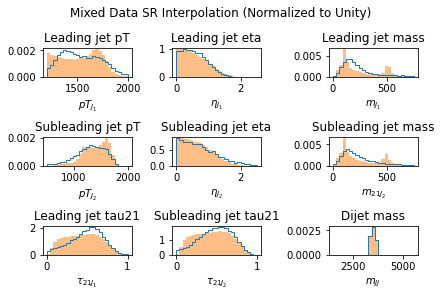

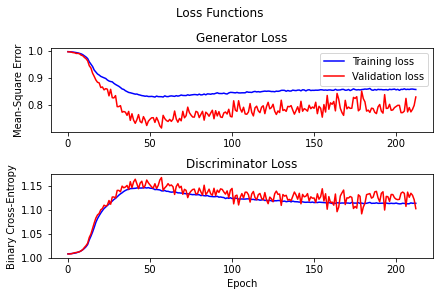

 21%|████████████████                                                             | 209/1000 [32:14<1:52:55,  8.57s/it]


Epoch 210:


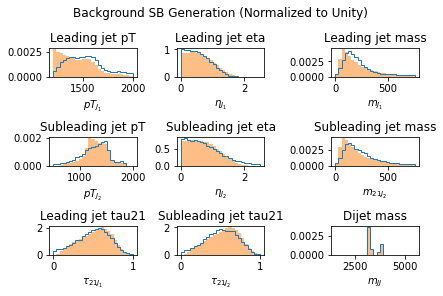

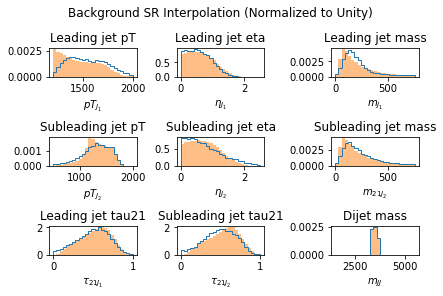

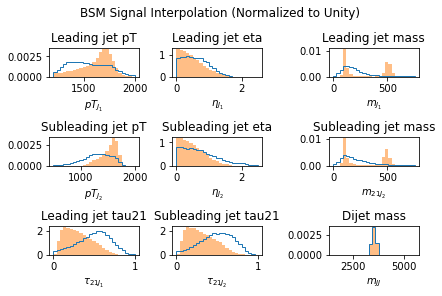

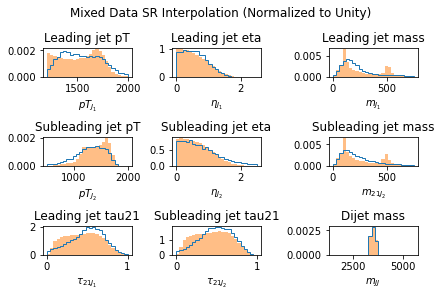

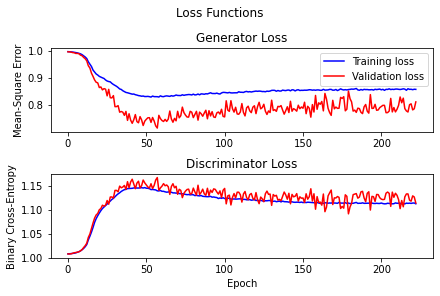

 22%|████████████████▊                                                            | 219/1000 [33:37<1:42:48,  7.90s/it]


Epoch 220:


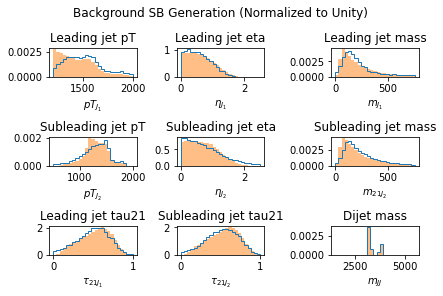

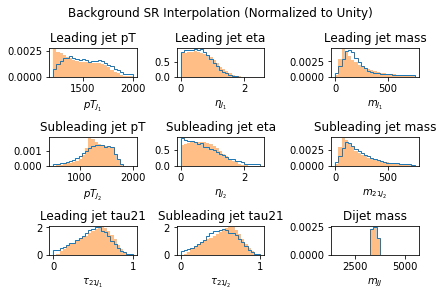

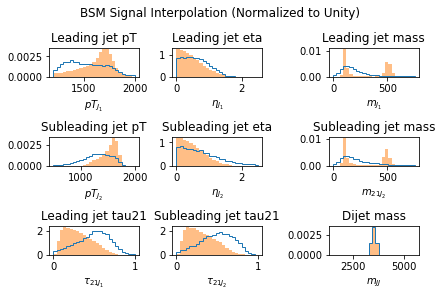

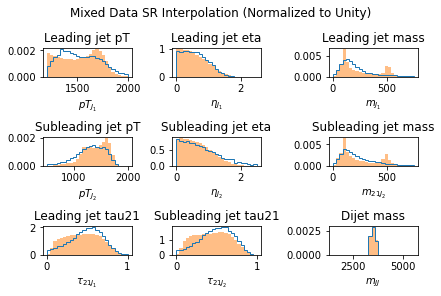

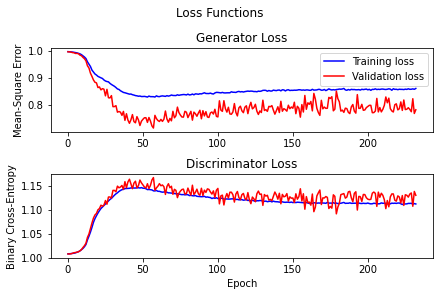

 23%|█████████████████▋                                                           | 229/1000 [35:01<1:40:59,  7.86s/it]


Epoch 230:


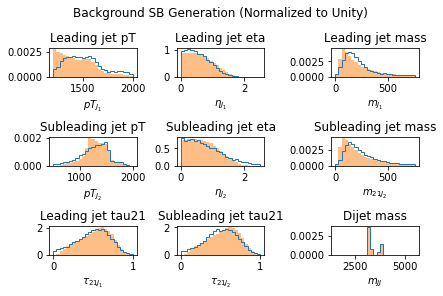

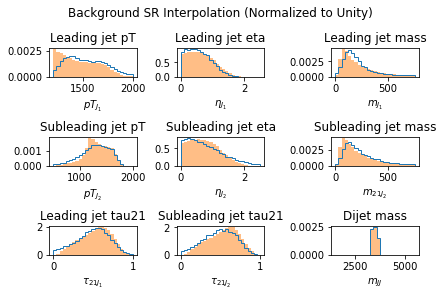

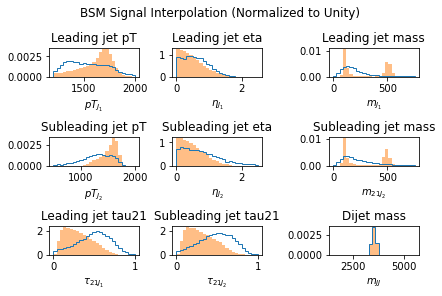

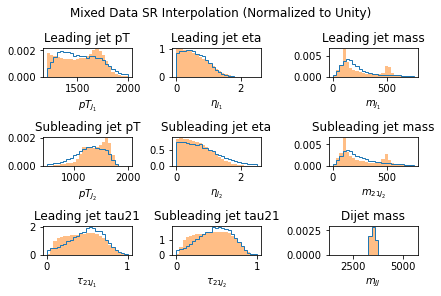

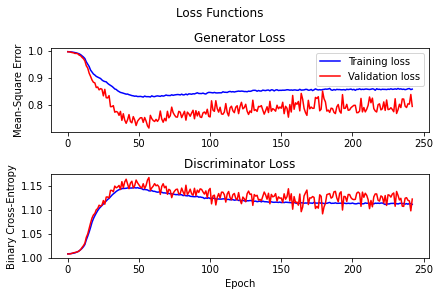

 24%|██████████████████▍                                                          | 239/1000 [36:26<1:43:39,  8.17s/it]


Epoch 240:


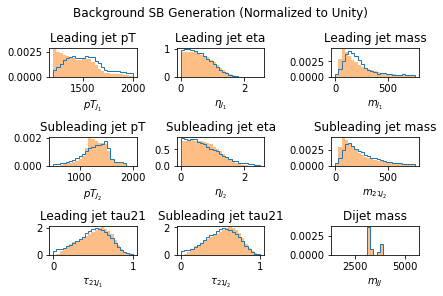

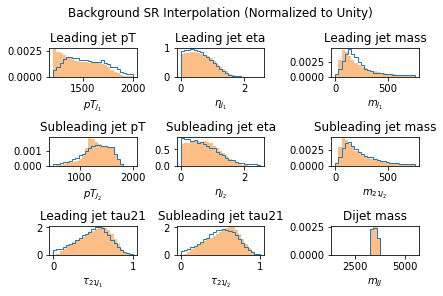

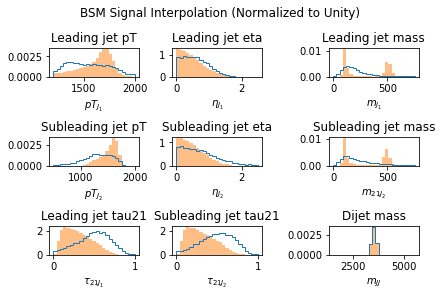

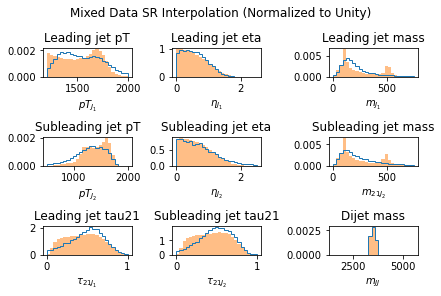

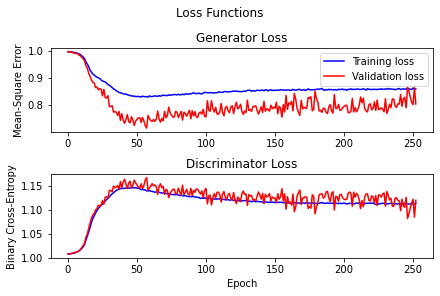

 25%|███████████████████▏                                                         | 249/1000 [37:50<1:39:07,  7.92s/it]


Epoch 250:


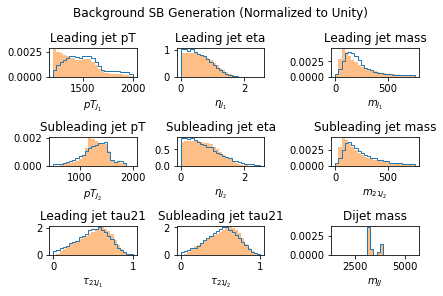

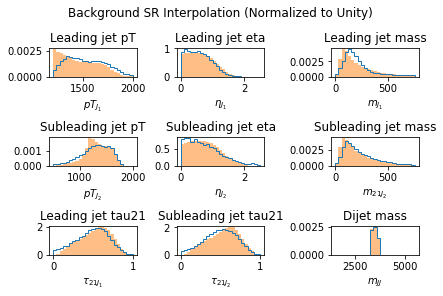

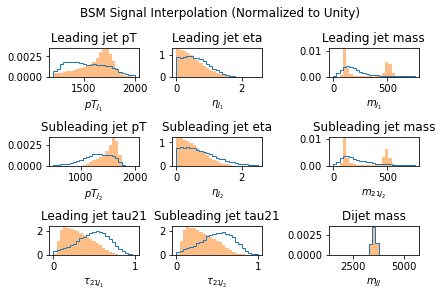

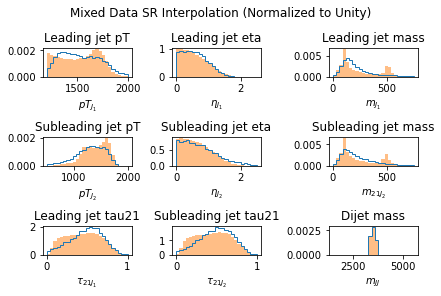

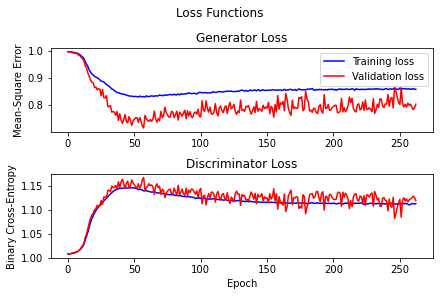

 26%|███████████████████▉                                                         | 259/1000 [39:14<1:37:33,  7.90s/it]


Epoch 260:


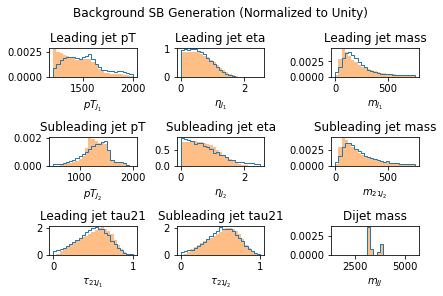

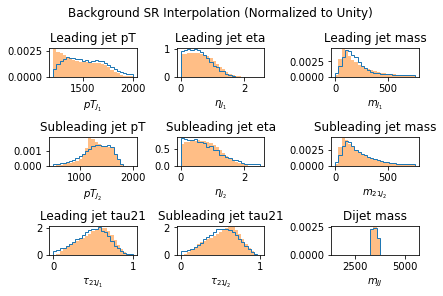

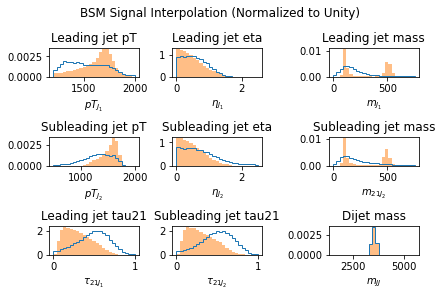

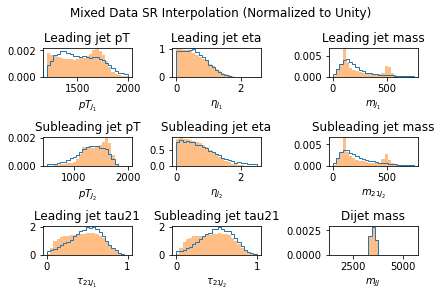

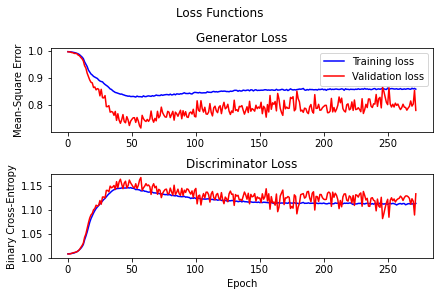

 27%|████████████████████▋                                                        | 269/1000 [40:37<1:35:39,  7.85s/it]


Epoch 270:


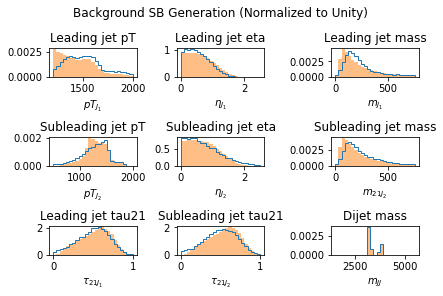

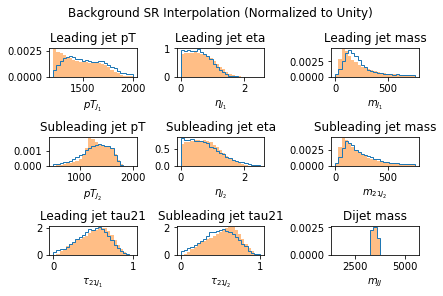

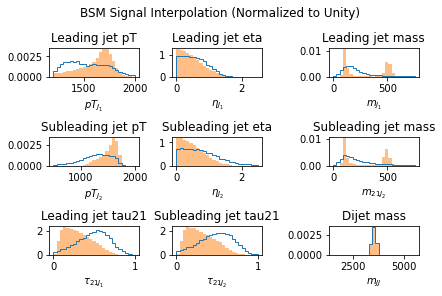

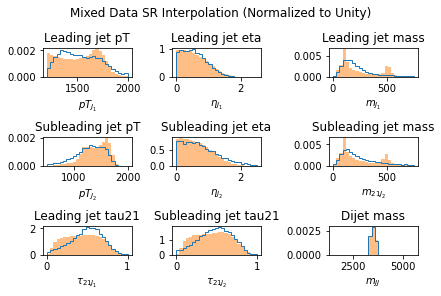

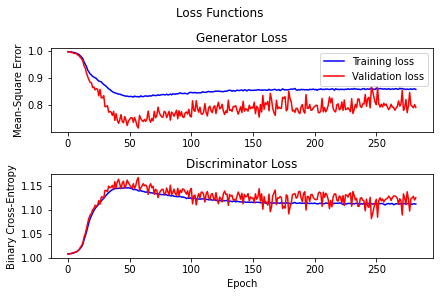

 28%|█████████████████████▍                                                       | 279/1000 [42:01<1:34:49,  7.89s/it]


Epoch 280:


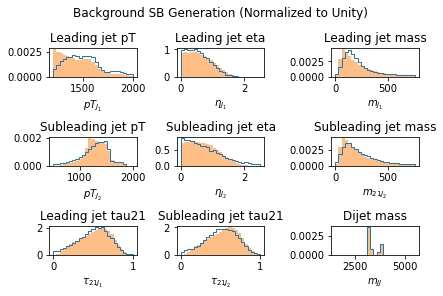

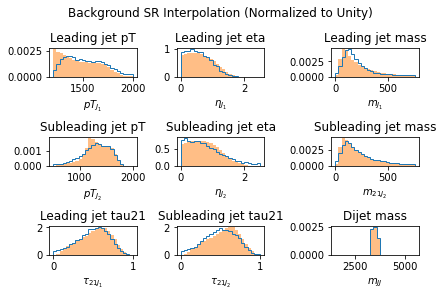

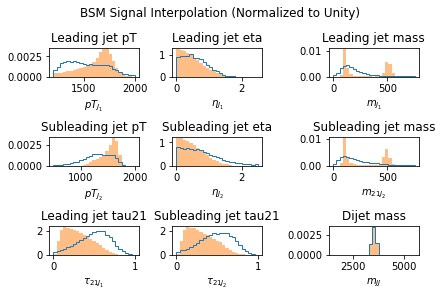

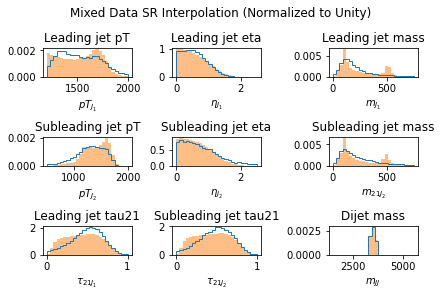

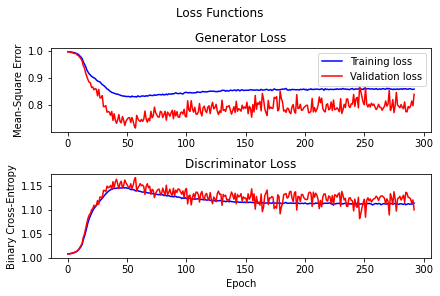

 29%|██████████████████████▎                                                      | 289/1000 [43:24<1:33:17,  7.87s/it]


Epoch 290:


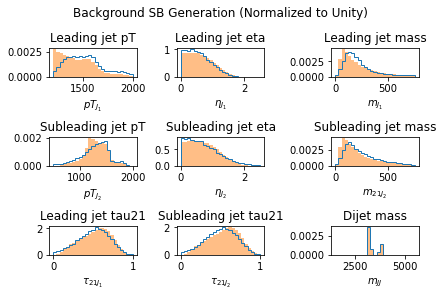

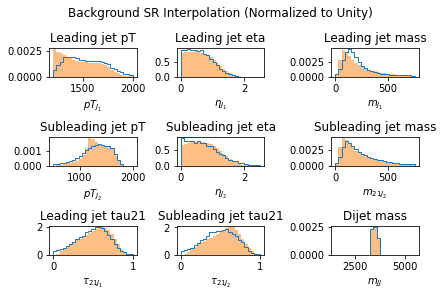

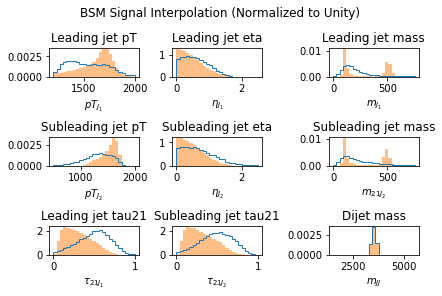

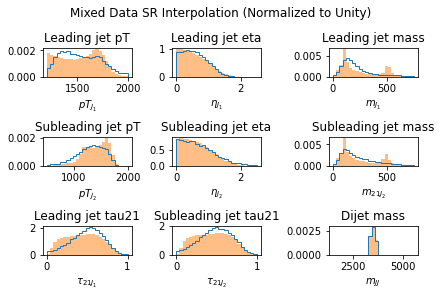

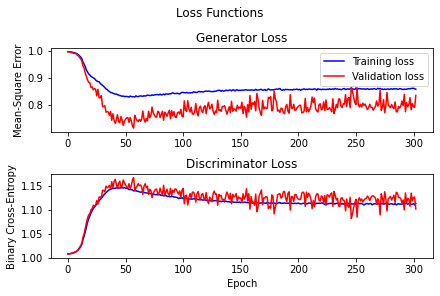

 30%|███████████████████████                                                      | 299/1000 [44:48<1:32:15,  7.90s/it]


Epoch 300:


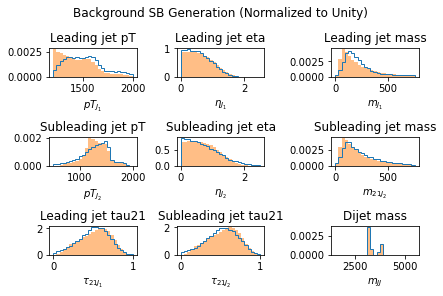

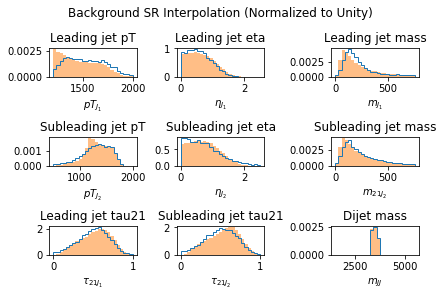

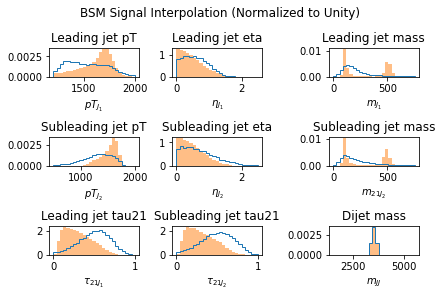

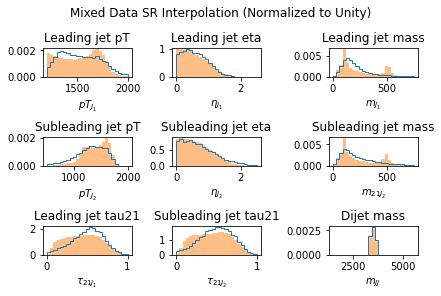

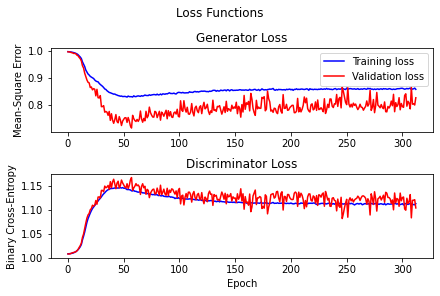

 31%|███████████████████████▊                                                     | 309/1000 [46:11<1:30:23,  7.85s/it]


Epoch 310:


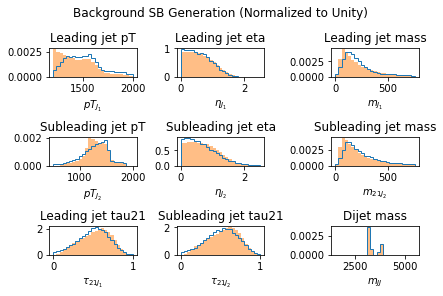

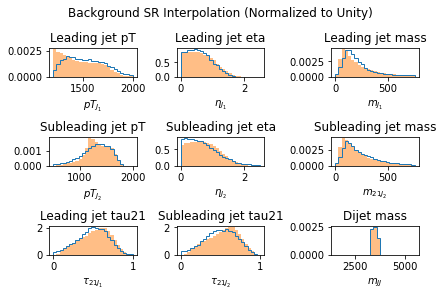

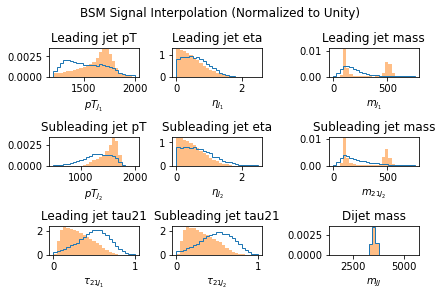

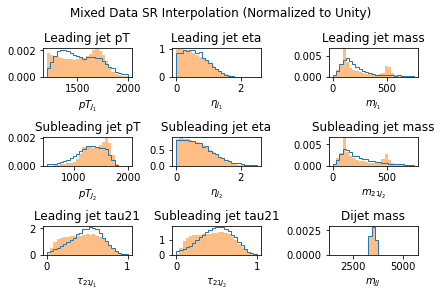

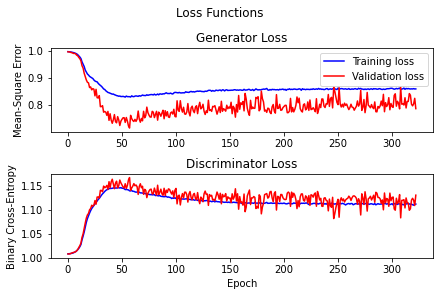

 32%|████████████████████████▌                                                    | 319/1000 [47:34<1:29:24,  7.88s/it]


Epoch 320:


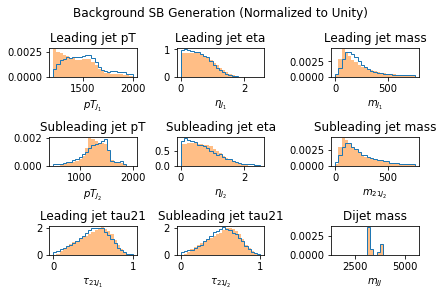

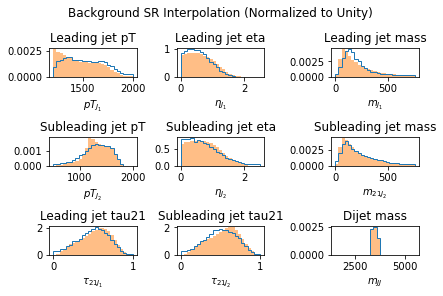

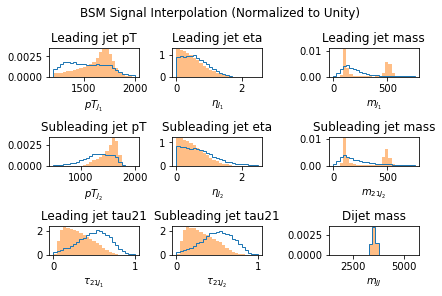

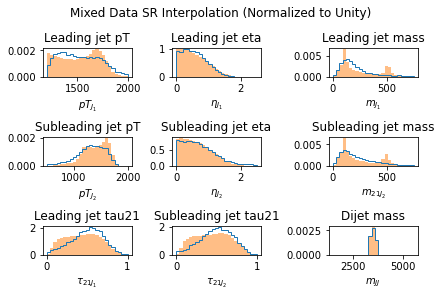

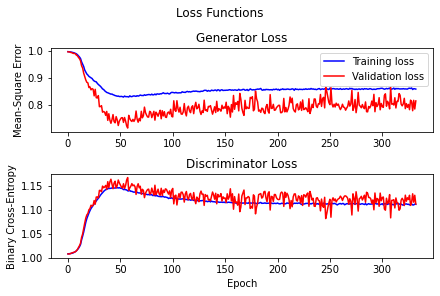

 33%|█████████████████████████▎                                                   | 329/1000 [48:57<1:27:58,  7.87s/it]


Epoch 330:


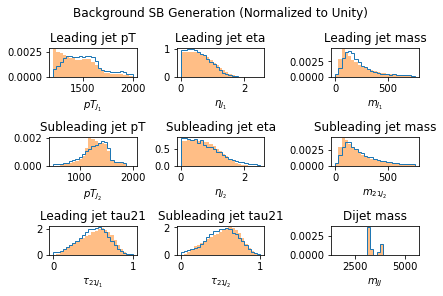

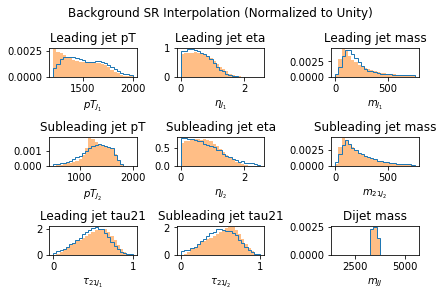

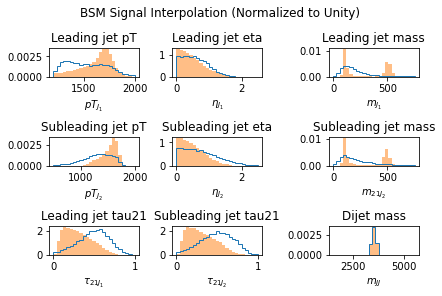

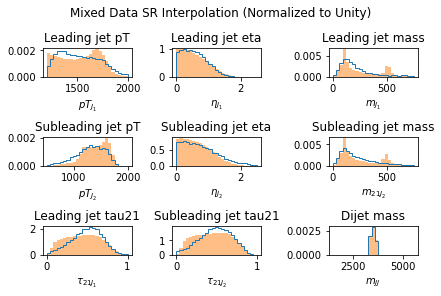

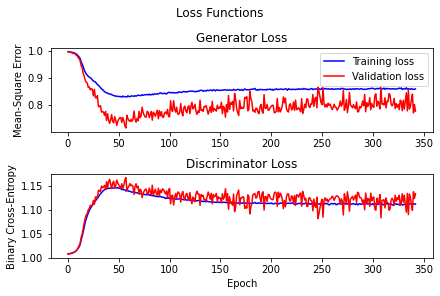

 34%|██████████████████████████                                                   | 339/1000 [50:21<1:26:55,  7.89s/it]


Epoch 340:


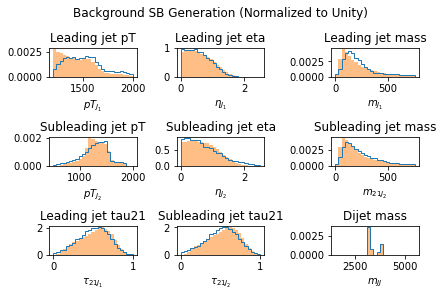

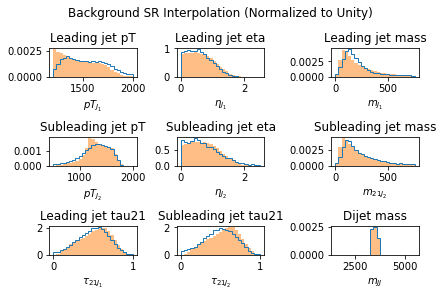

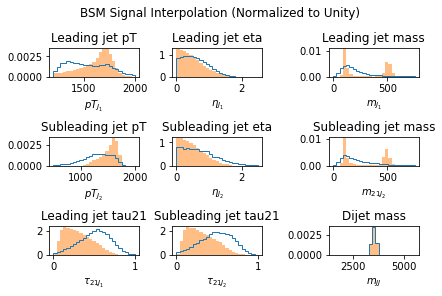

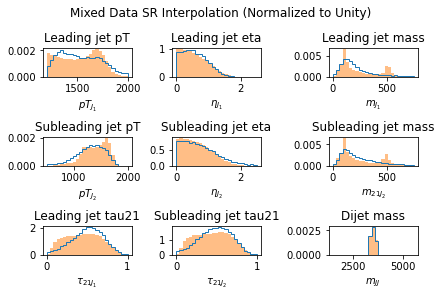

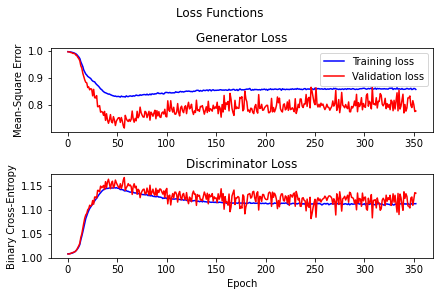

 35%|██████████████████████████▊                                                  | 349/1000 [51:44<1:25:42,  7.90s/it]


Epoch 350:


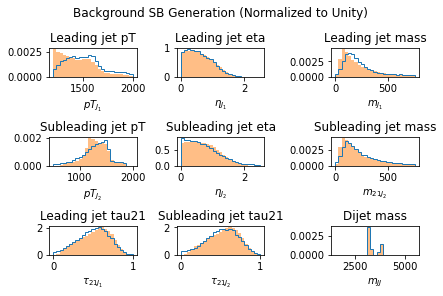

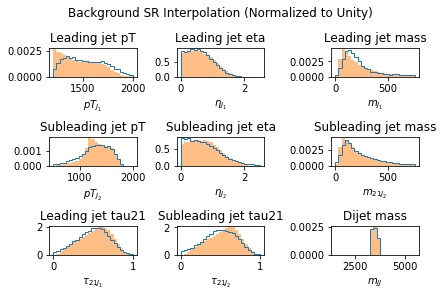

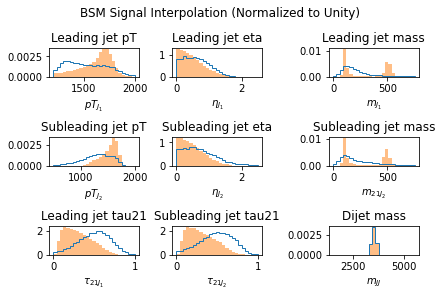

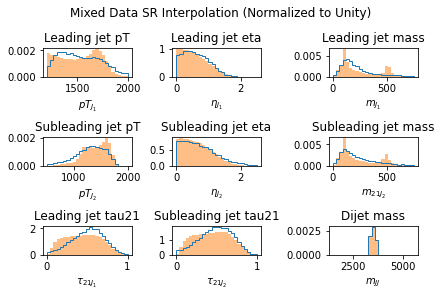

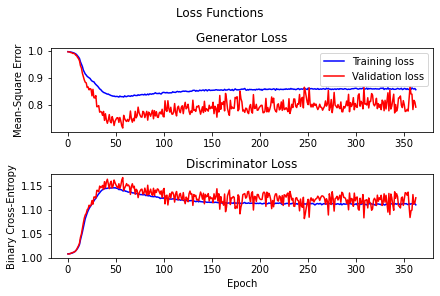

 36%|███████████████████████████▋                                                 | 359/1000 [53:08<1:23:51,  7.85s/it]


Epoch 360:


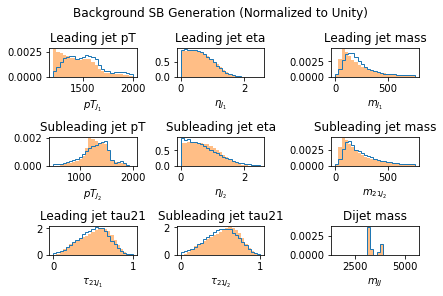

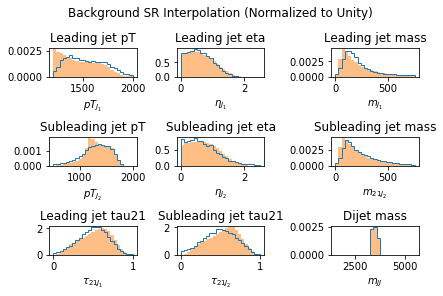

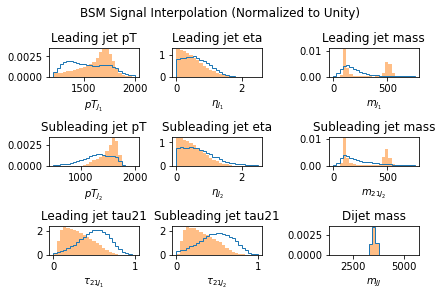

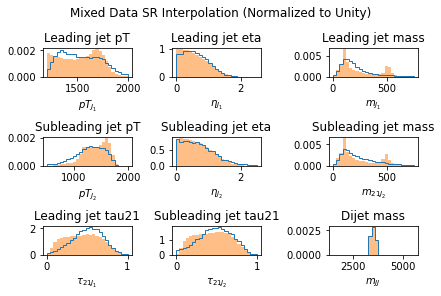

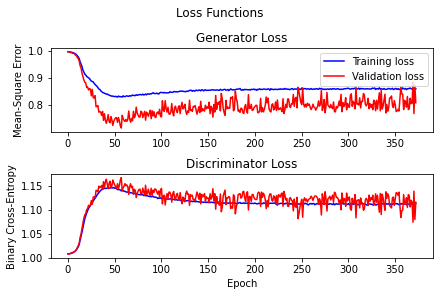

 37%|████████████████████████████▍                                                | 369/1000 [54:31<1:22:35,  7.85s/it]


Epoch 370:


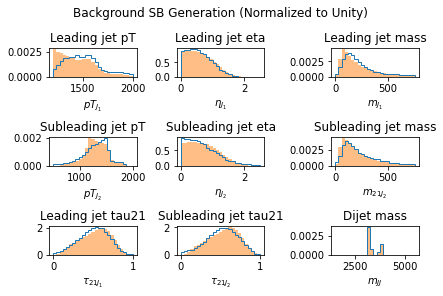

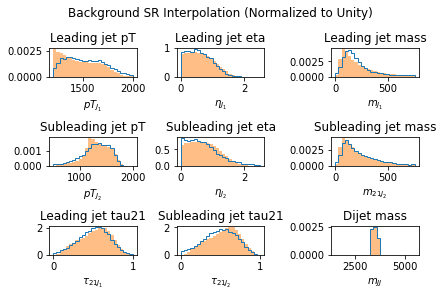

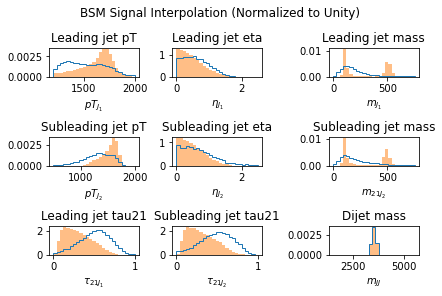

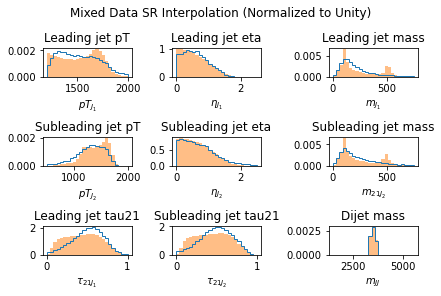

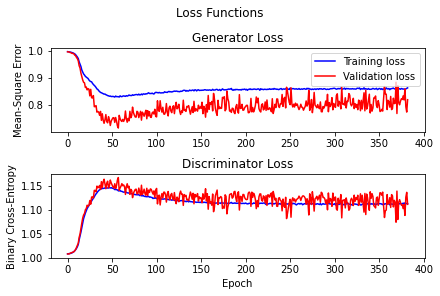

 38%|█████████████████████████████▏                                               | 379/1000 [55:54<1:21:28,  7.87s/it]


Epoch 380:


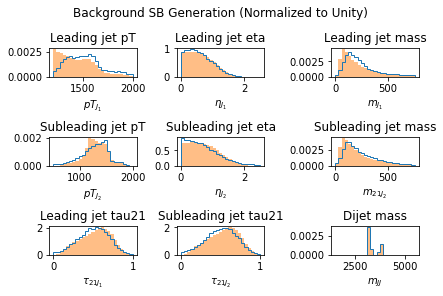

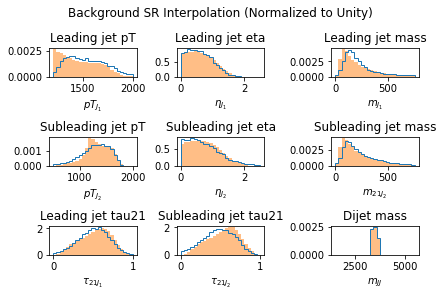

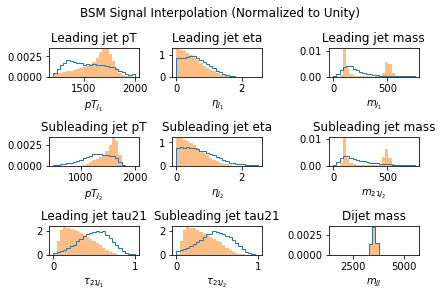

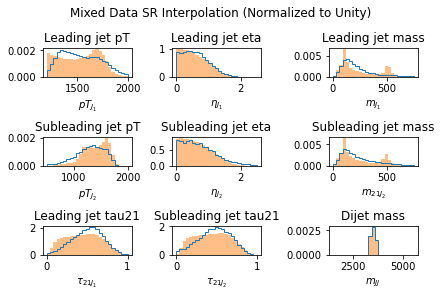

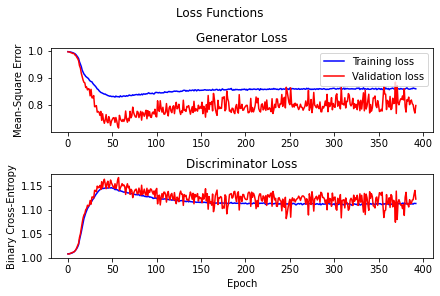

 39%|█████████████████████████████▉                                               | 389/1000 [57:19<1:22:23,  8.09s/it]


Epoch 390:


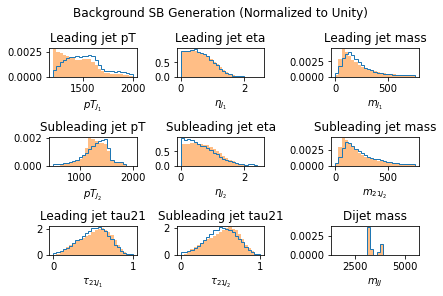

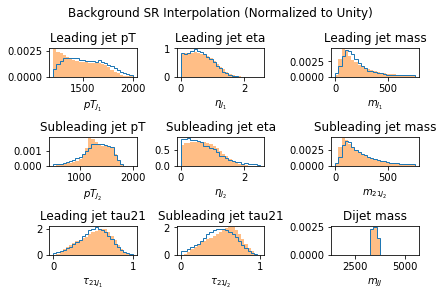

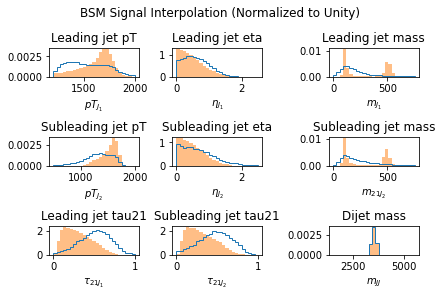

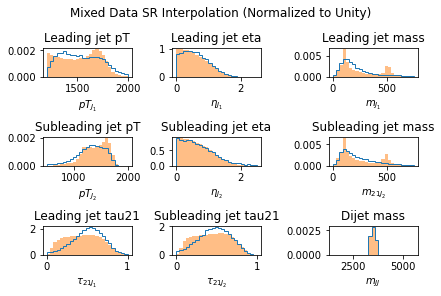

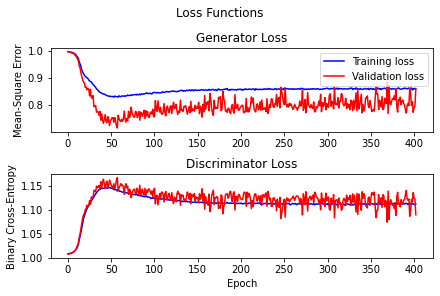

 40%|██████████████████████████████▋                                              | 399/1000 [58:45<1:21:03,  8.09s/it]


Epoch 400:


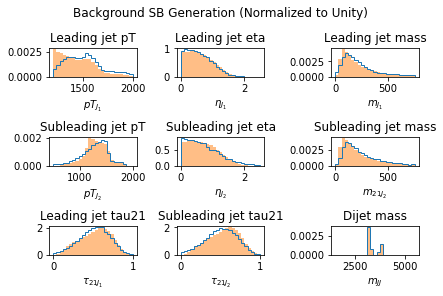

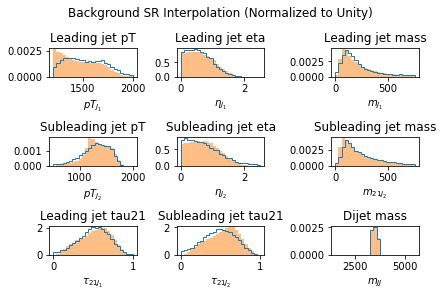

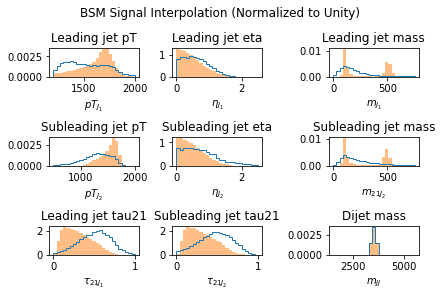

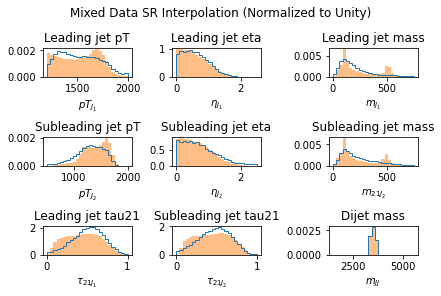

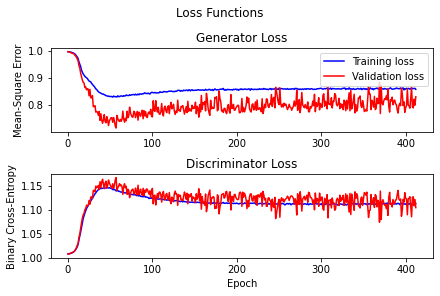

 41%|██████████████████████████████▋                                            | 409/1000 [1:00:10<1:19:49,  8.10s/it]


Epoch 410:


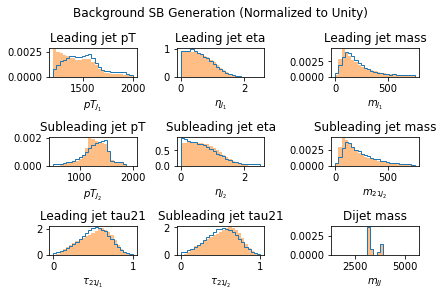

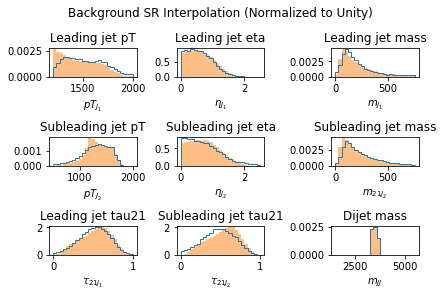

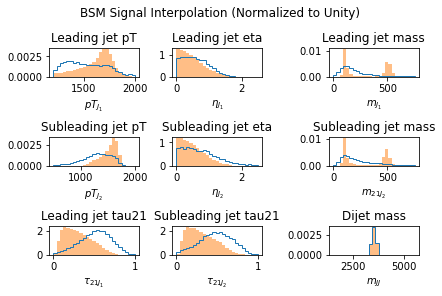

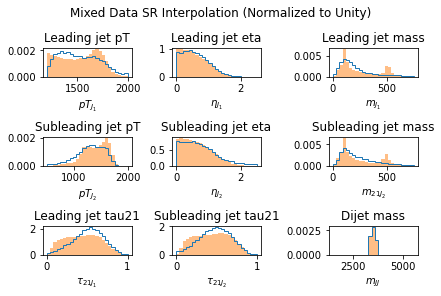

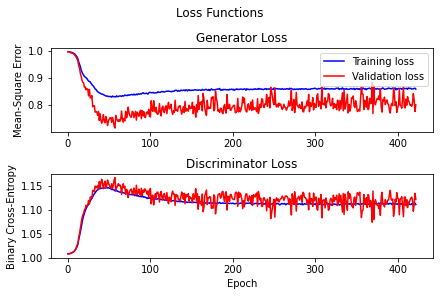

 42%|███████████████████████████████▍                                           | 419/1000 [1:01:36<1:18:03,  8.06s/it]


Epoch 420:


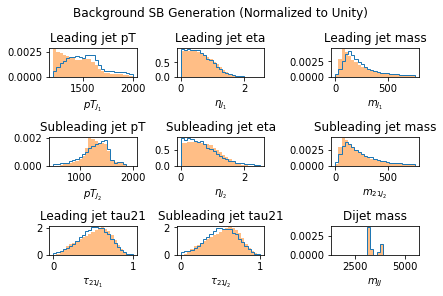

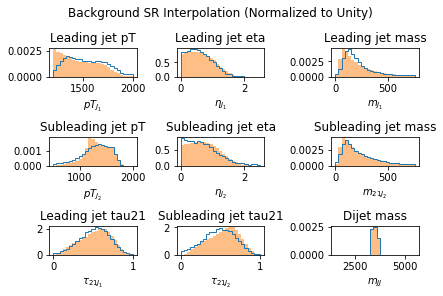

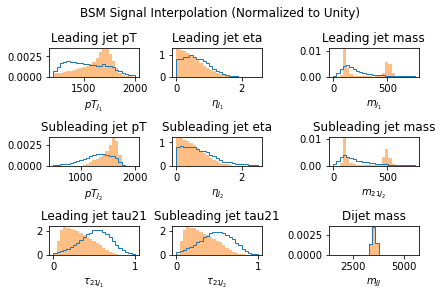

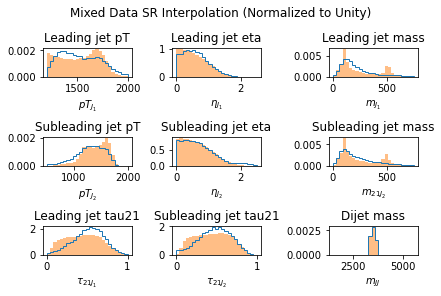

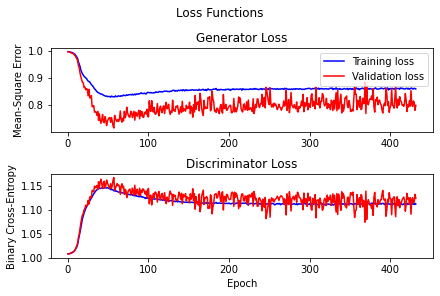

 43%|████████████████████████████████▏                                          | 429/1000 [1:03:01<1:16:49,  8.07s/it]


Epoch 430:


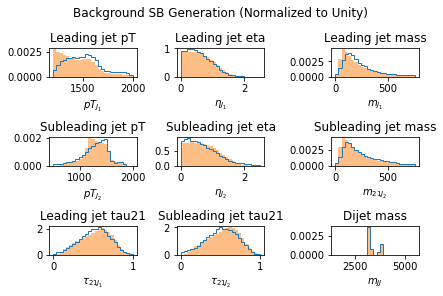

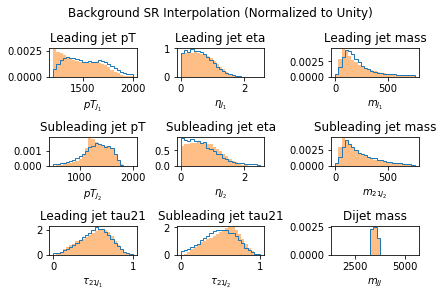

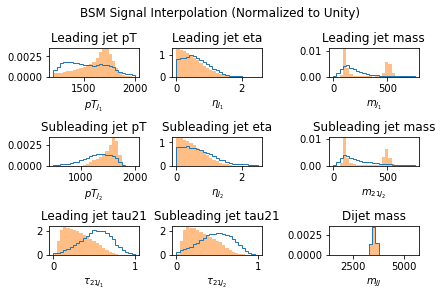

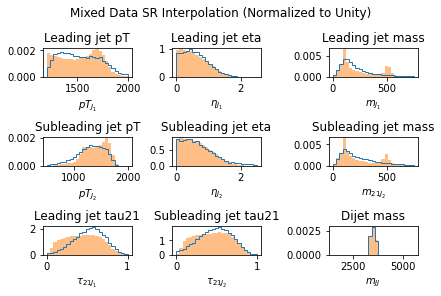

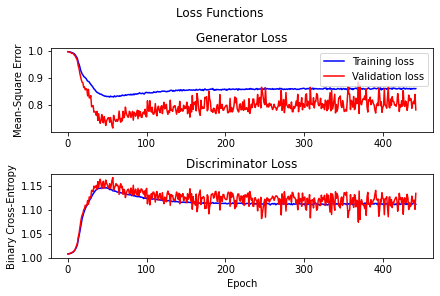

 44%|████████████████████████████████▉                                          | 439/1000 [1:04:27<1:15:49,  8.11s/it]


Epoch 440:


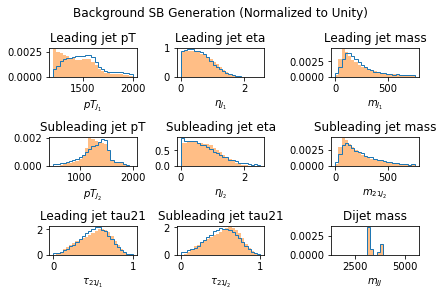

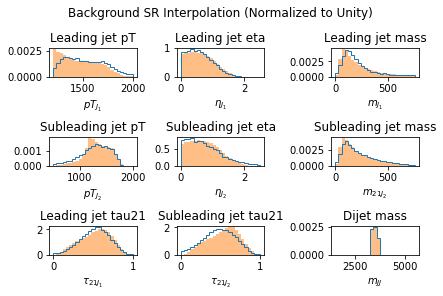

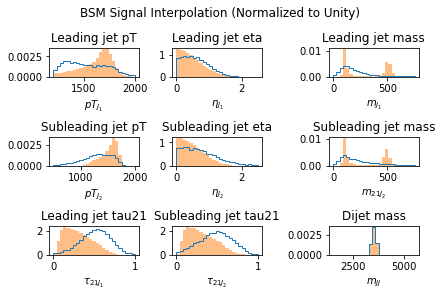

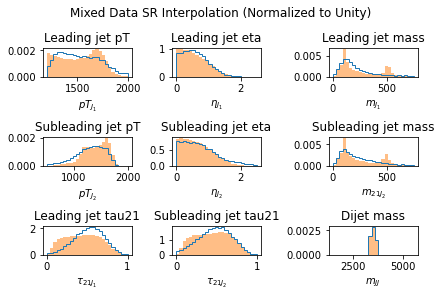

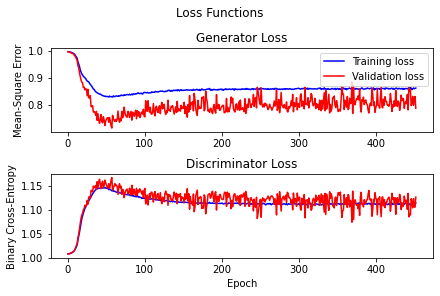

 45%|█████████████████████████████████▋                                         | 449/1000 [1:05:53<1:14:42,  8.13s/it]


Epoch 450:


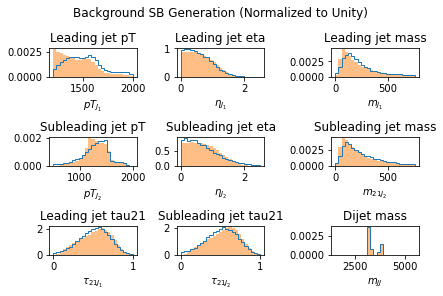

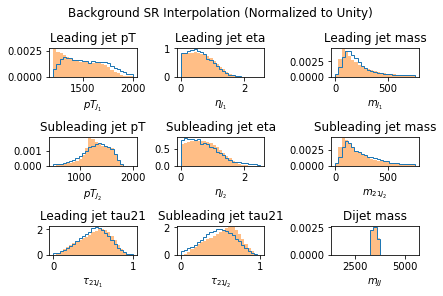

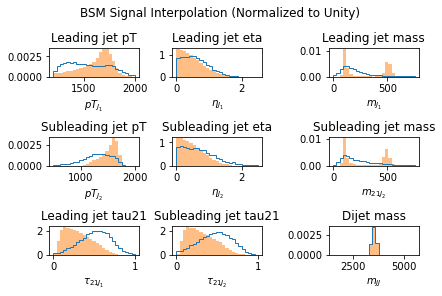

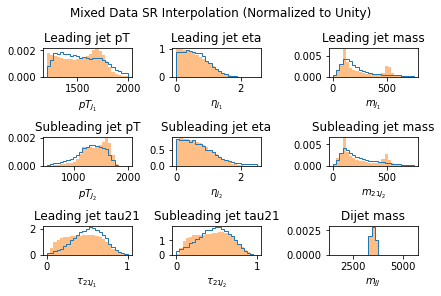

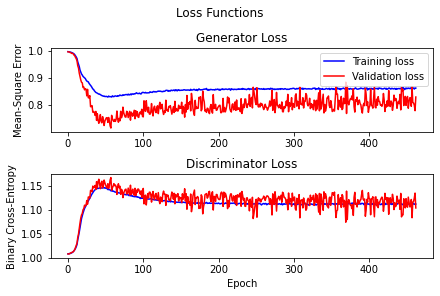

 46%|██████████████████████████████████▍                                        | 459/1000 [1:07:18<1:12:55,  8.09s/it]


Epoch 460:


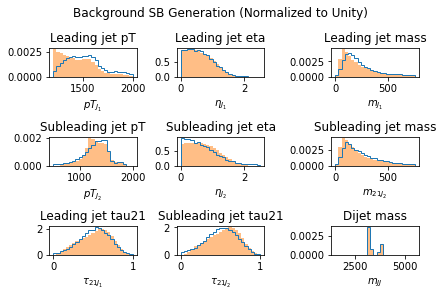

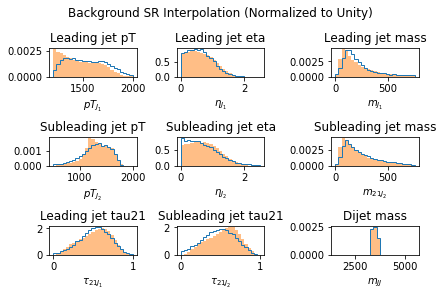

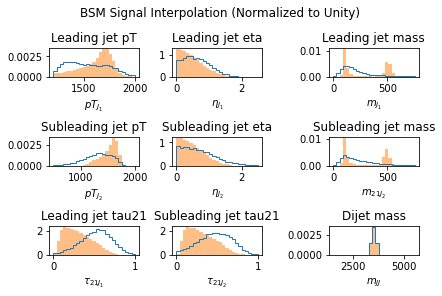

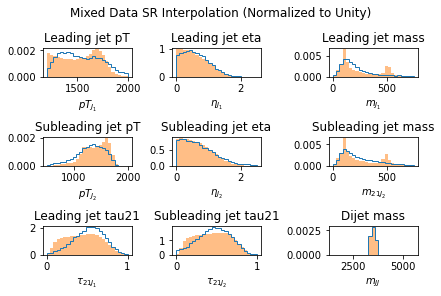

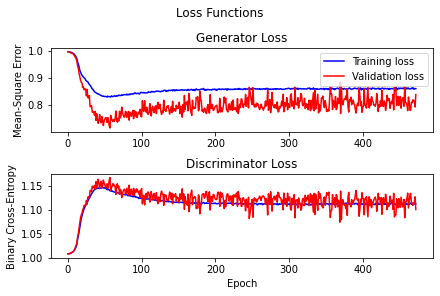

 47%|███████████████████████████████████▏                                       | 469/1000 [1:08:42<1:09:54,  7.90s/it]


Epoch 470:


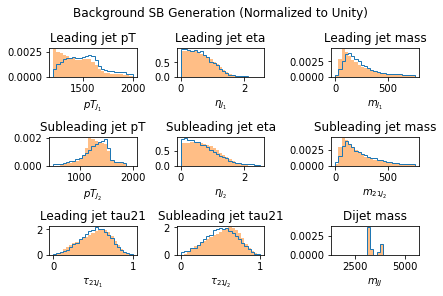

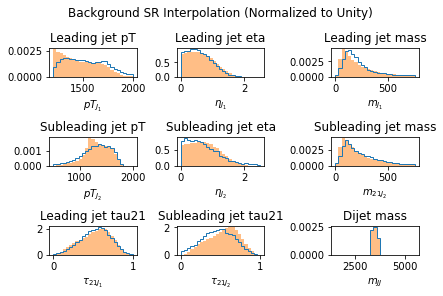

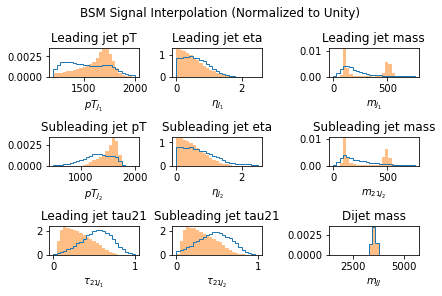

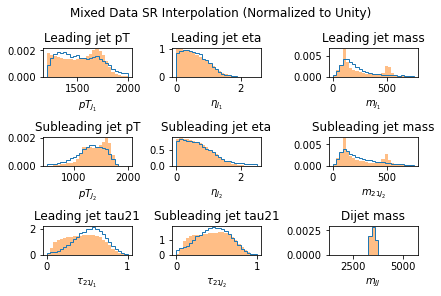

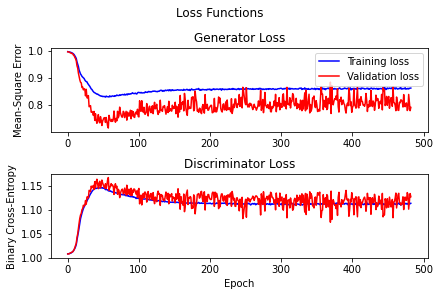

 48%|███████████████████████████████████▉                                       | 479/1000 [1:10:06<1:08:28,  7.89s/it]


Epoch 480:


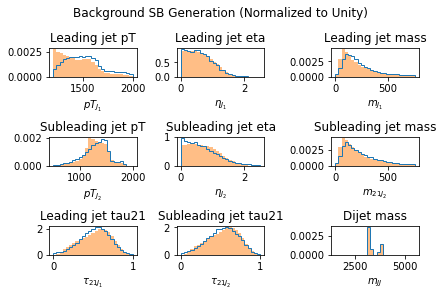

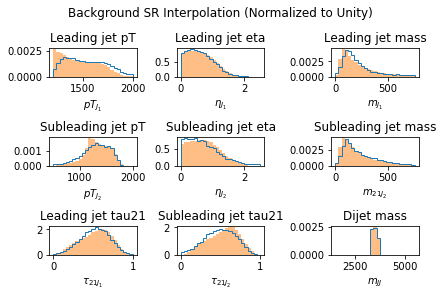

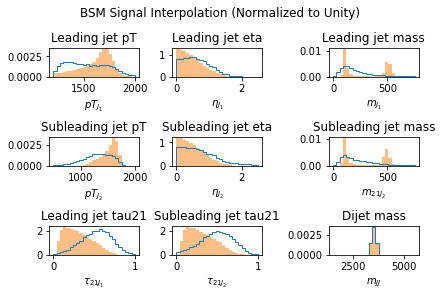

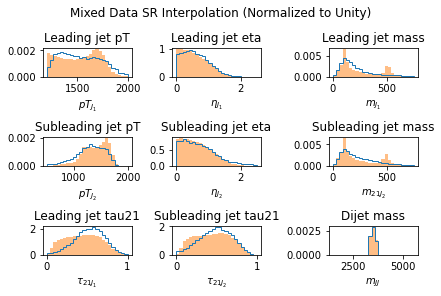

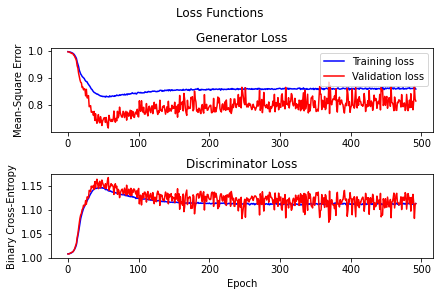

 49%|████████████████████████████████████▋                                      | 489/1000 [1:11:29<1:07:08,  7.88s/it]


Epoch 490:


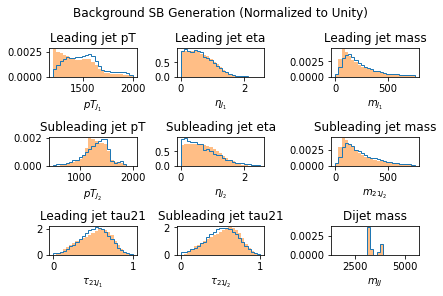

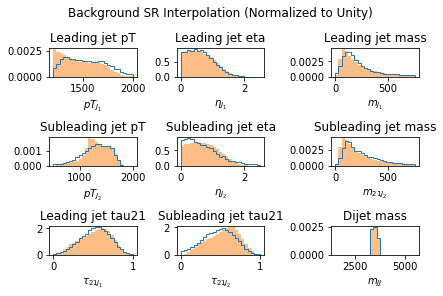

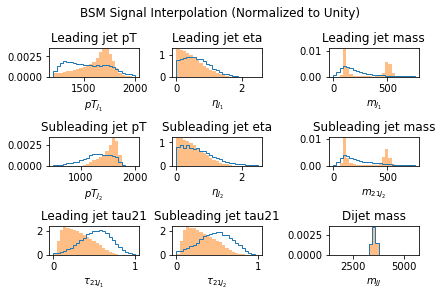

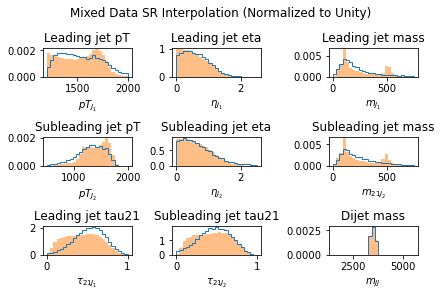

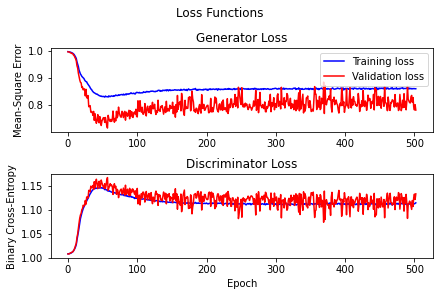

 50%|█████████████████████████████████████▍                                     | 499/1000 [1:12:52<1:05:37,  7.86s/it]


Epoch 500:


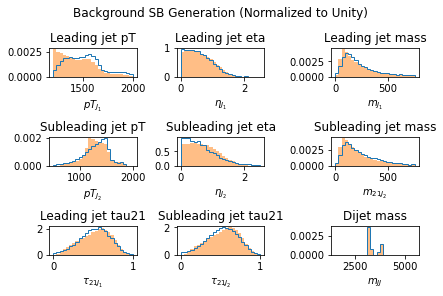

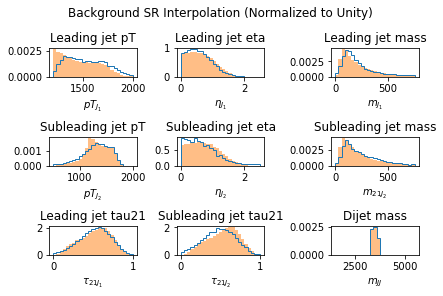

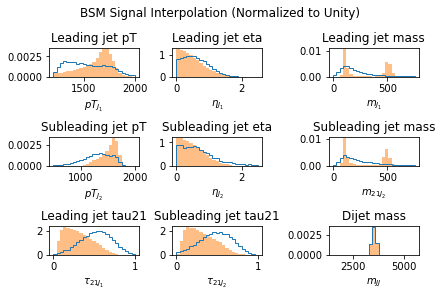

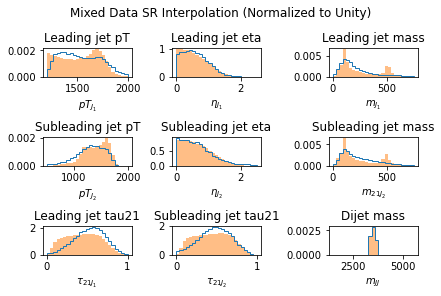

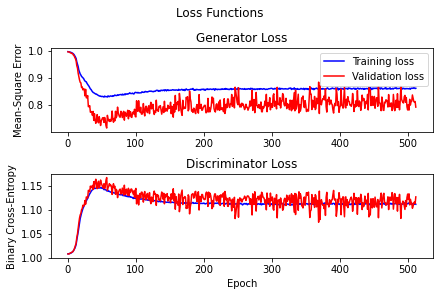

 51%|██████████████████████████████████████▏                                    | 509/1000 [1:14:16<1:04:15,  7.85s/it]


Epoch 510:


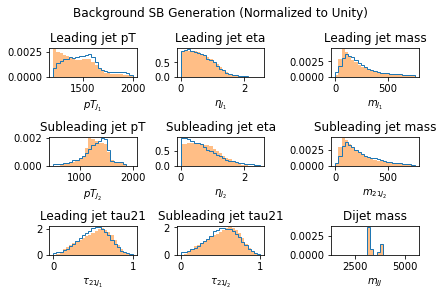

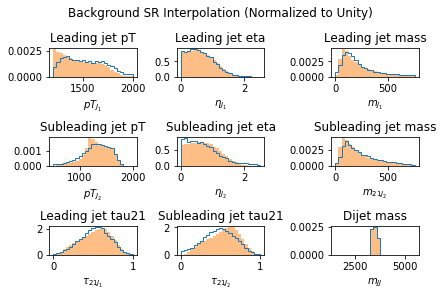

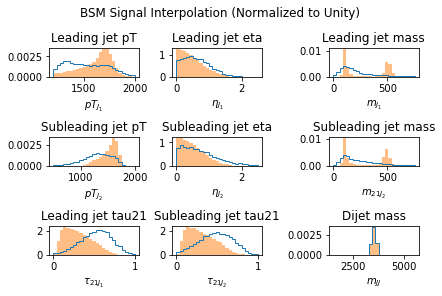

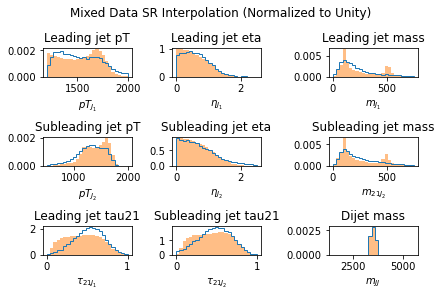

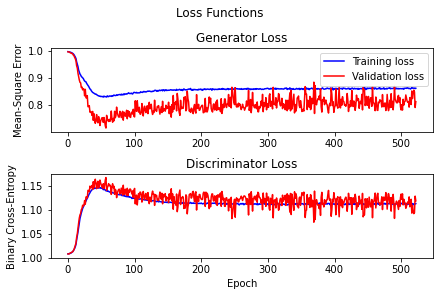

 52%|██████████████████████████████████████▉                                    | 519/1000 [1:15:39<1:03:09,  7.88s/it]


Epoch 520:


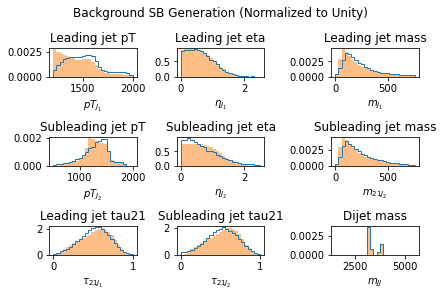

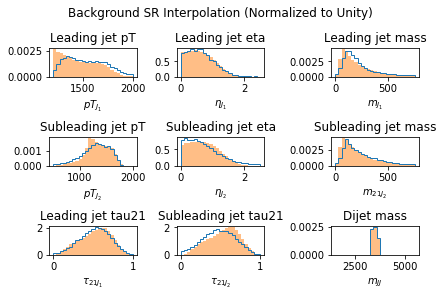

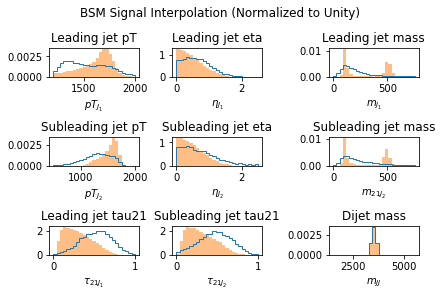

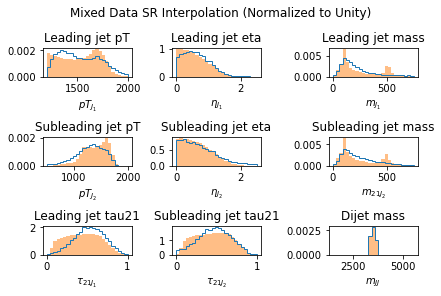

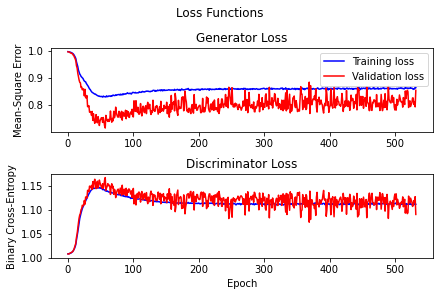

 53%|███████████████████████████████████████▋                                   | 529/1000 [1:17:02<1:02:02,  7.90s/it]


Epoch 530:


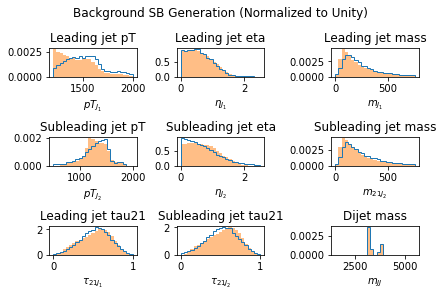

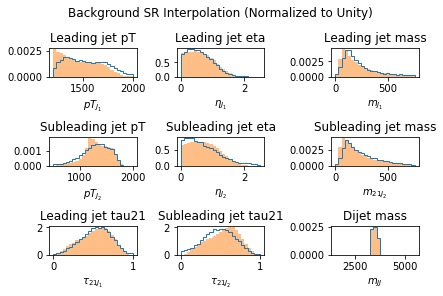

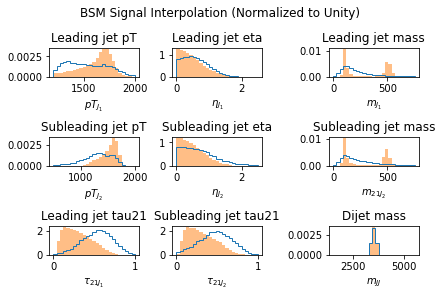

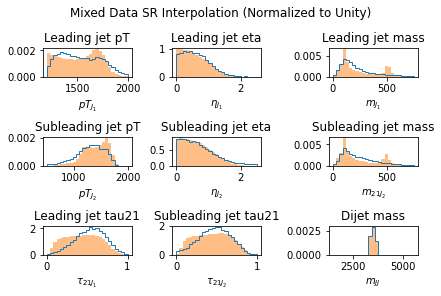

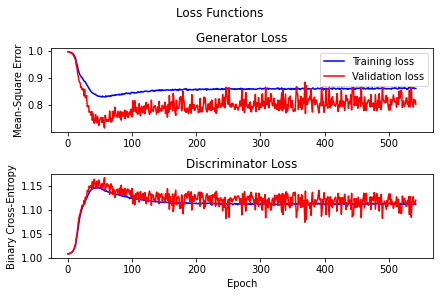

 54%|████████████████████████████████████████▍                                  | 539/1000 [1:18:26<1:00:41,  7.90s/it]


Epoch 540:


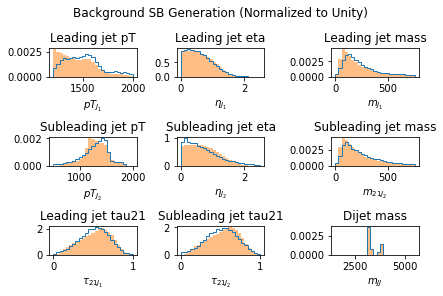

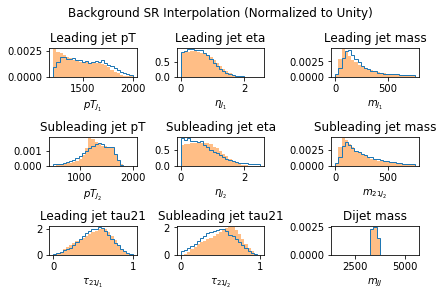

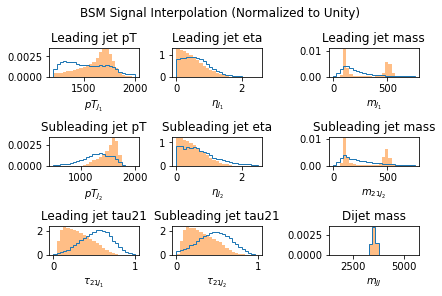

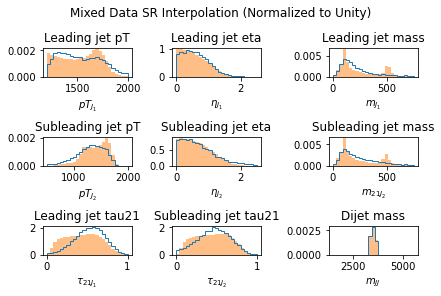

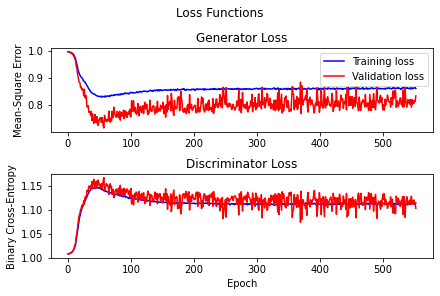

 55%|██████████████████████████████████████████▎                                  | 549/1000 [1:19:49<59:18,  7.89s/it]


Epoch 550:


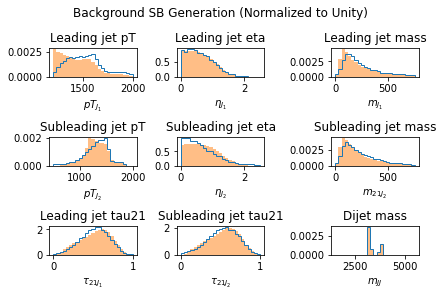

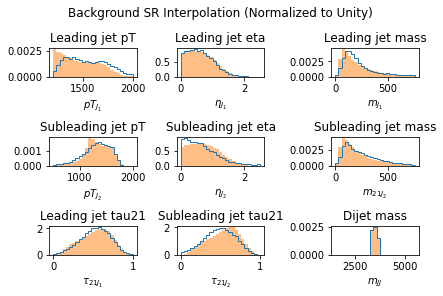

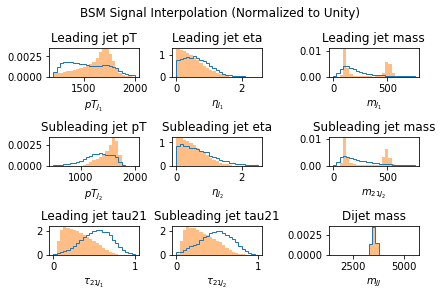

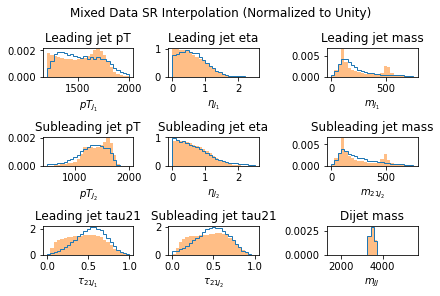

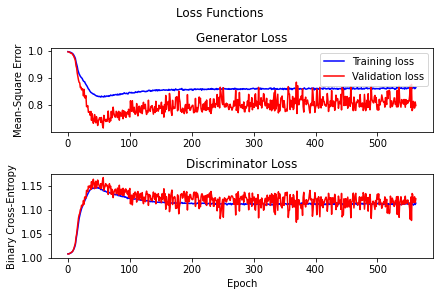

 56%|███████████████████████████████████████████                                  | 559/1000 [1:21:13<59:05,  8.04s/it]


Epoch 560:


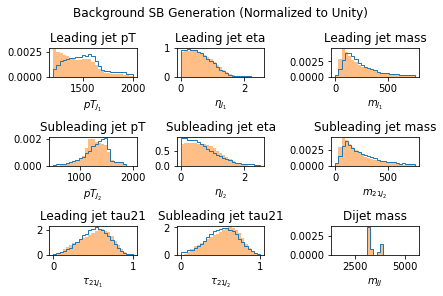

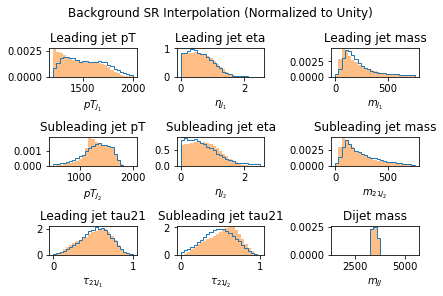

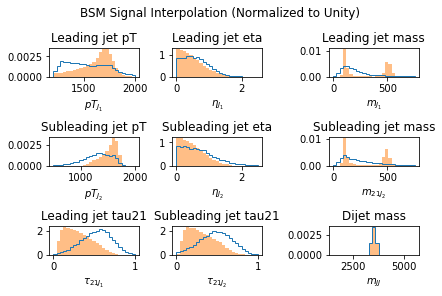

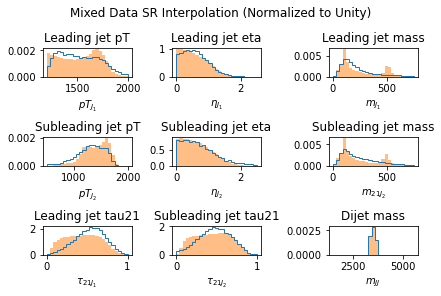

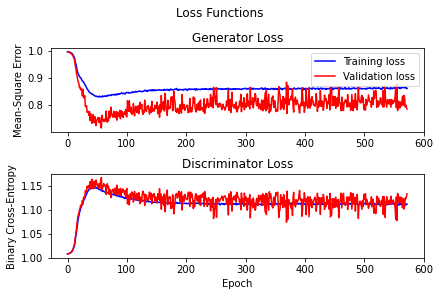

 57%|███████████████████████████████████████████▊                                 | 569/1000 [1:22:39<58:11,  8.10s/it]


Epoch 570:


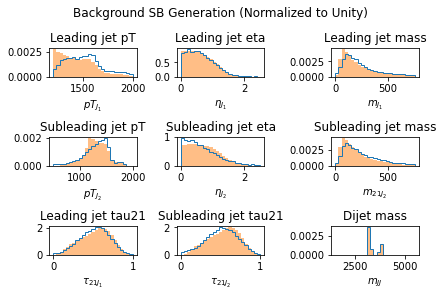

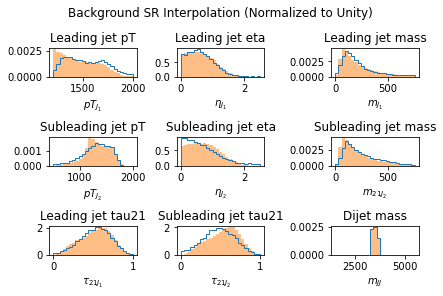

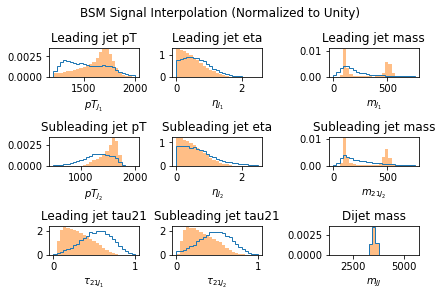

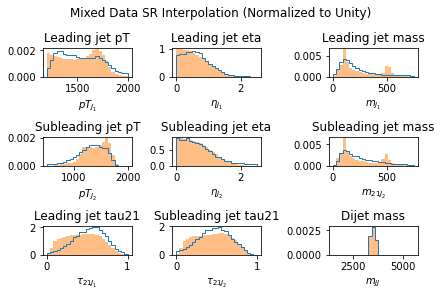

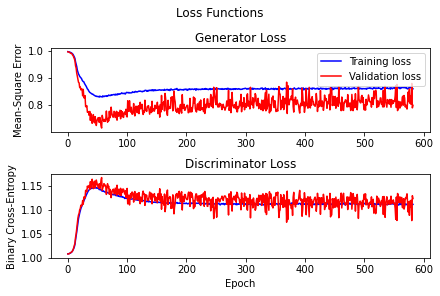

 58%|████████████████████████████████████████████▌                                | 579/1000 [1:24:04<56:43,  8.09s/it]


Epoch 580:


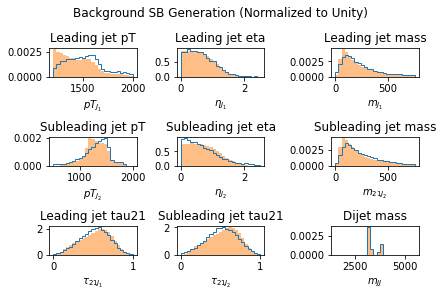

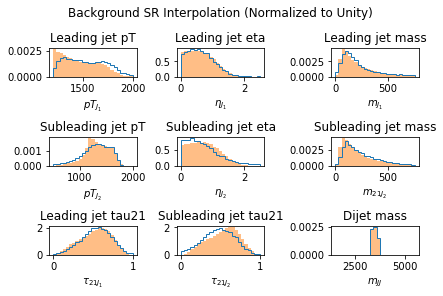

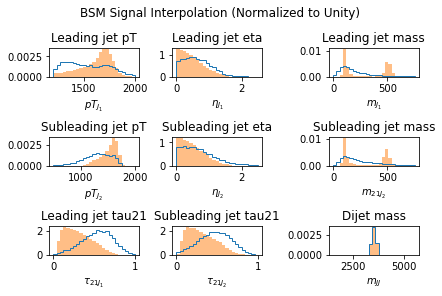

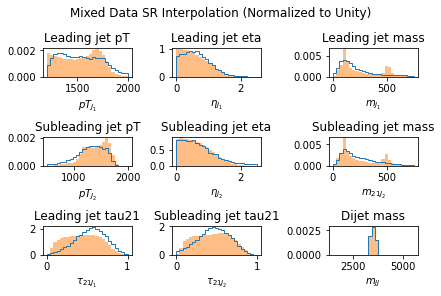

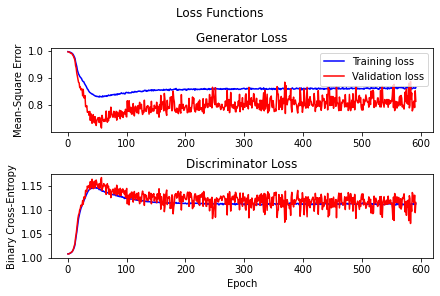

 59%|█████████████████████████████████████████████▎                               | 589/1000 [1:25:30<55:24,  8.09s/it]


Epoch 590:


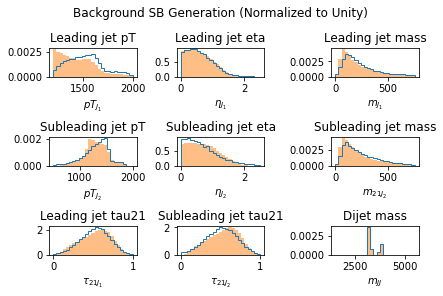

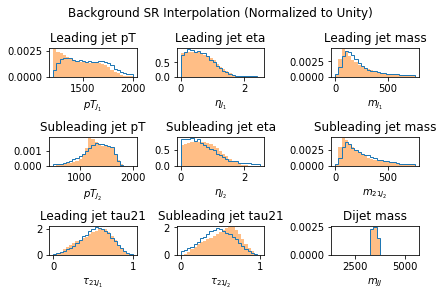

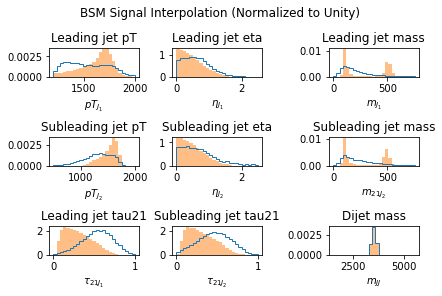

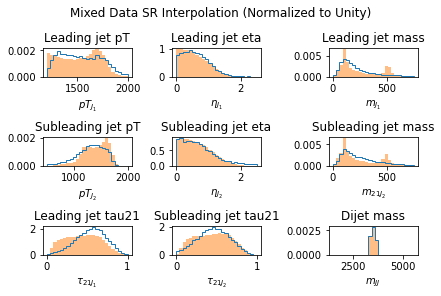

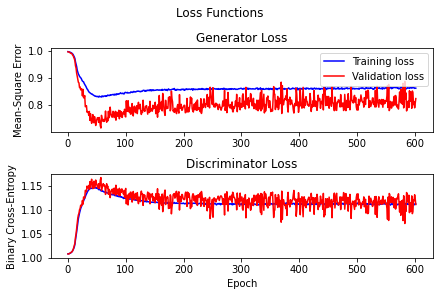

 60%|██████████████████████████████████████████████                               | 599/1000 [1:26:56<54:11,  8.11s/it]


Epoch 600:


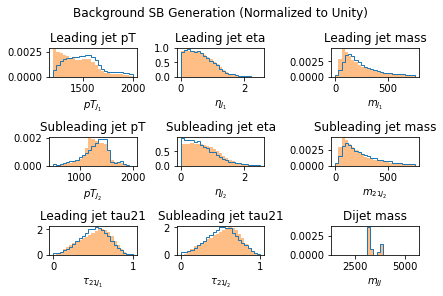

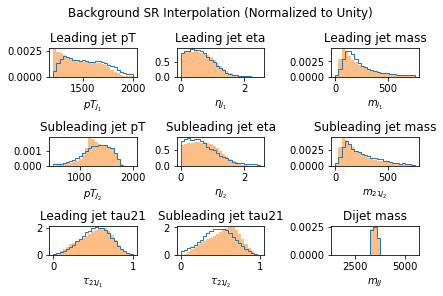

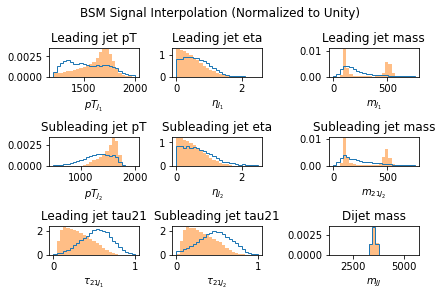

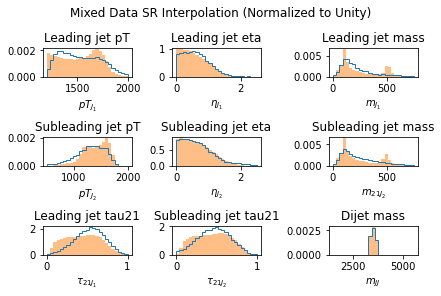

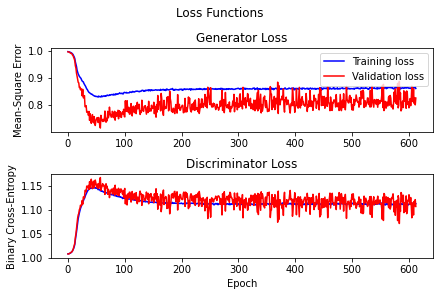

 61%|██████████████████████████████████████████████▉                              | 609/1000 [1:28:22<52:43,  8.09s/it]


Epoch 610:


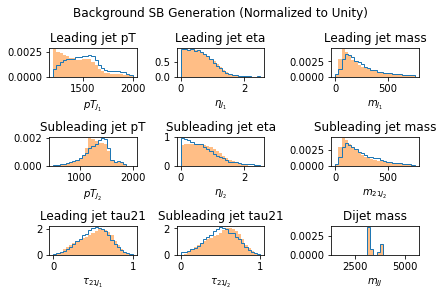

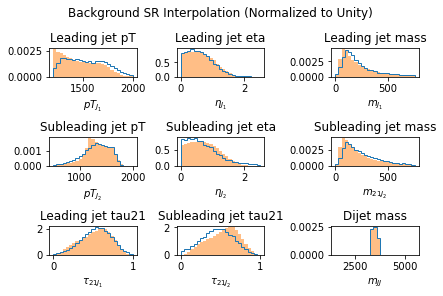

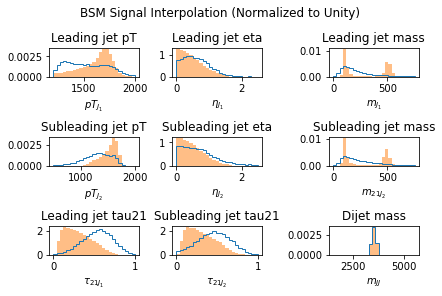

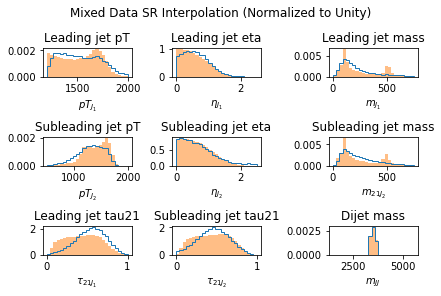

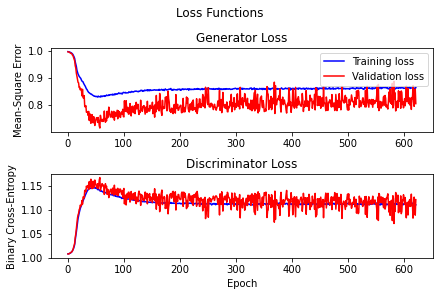

 62%|███████████████████████████████████████████████▋                             | 619/1000 [1:29:47<51:27,  8.10s/it]


Epoch 620:


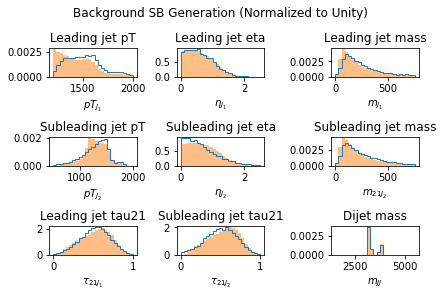

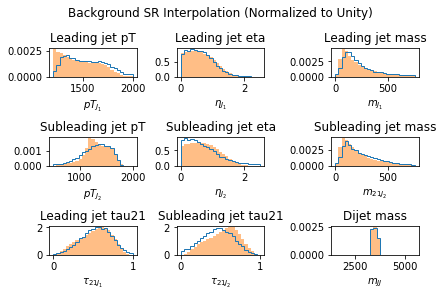

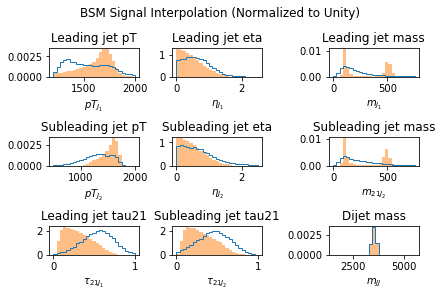

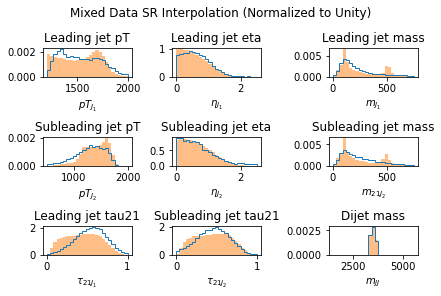

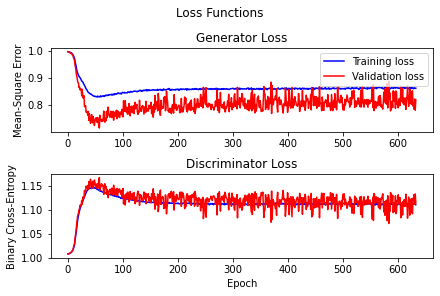

 63%|████████████████████████████████████████████████▍                            | 629/1000 [1:31:12<49:43,  8.04s/it]


Epoch 630:


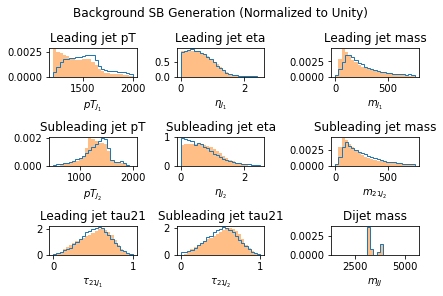

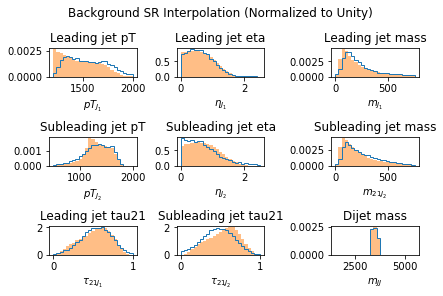

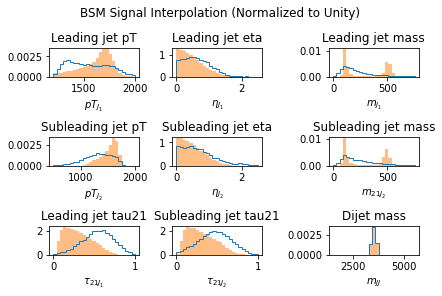

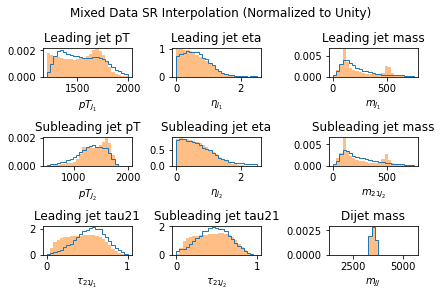

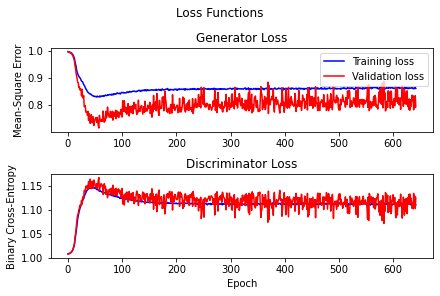

 64%|█████████████████████████████████████████████████▏                           | 639/1000 [1:32:37<48:15,  8.02s/it]


Epoch 640:


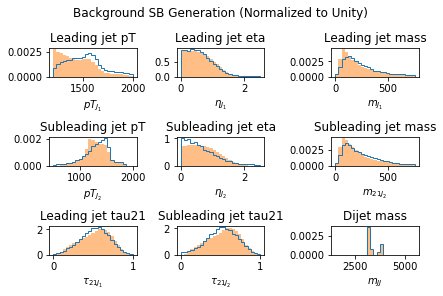

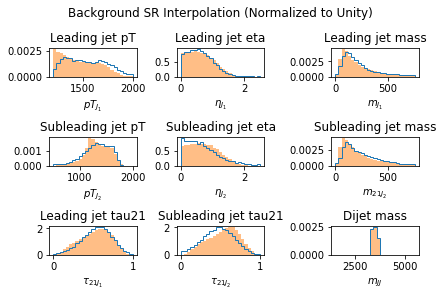

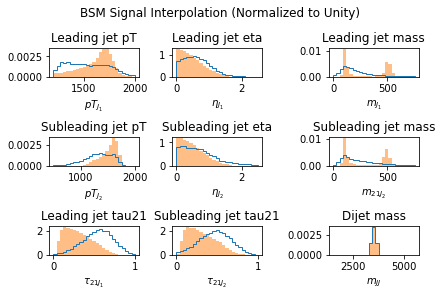

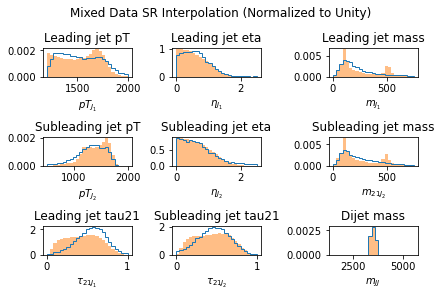

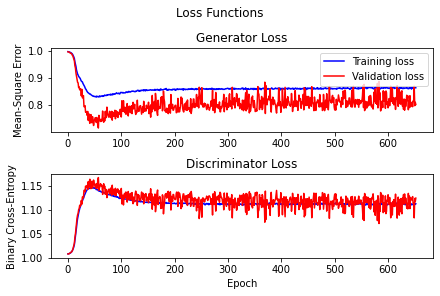

 65%|█████████████████████████████████████████████████▉                           | 649/1000 [1:34:02<47:00,  8.04s/it]


Epoch 650:


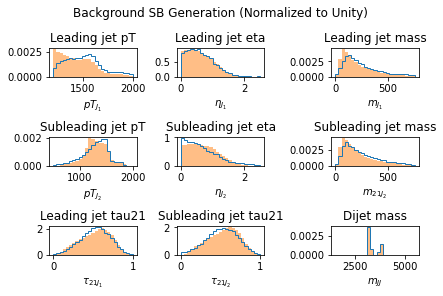

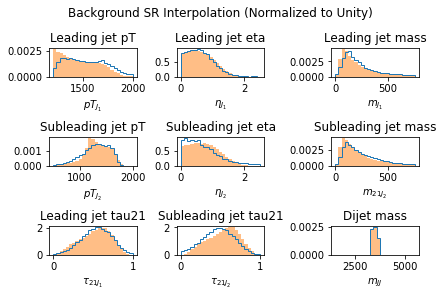

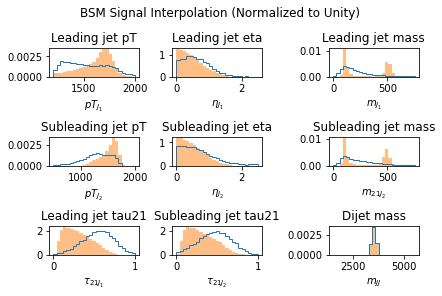

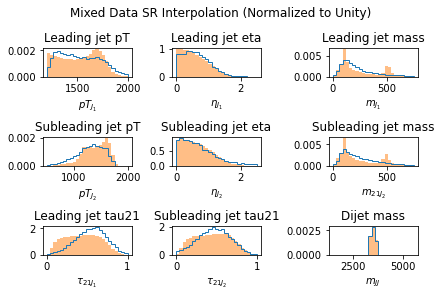

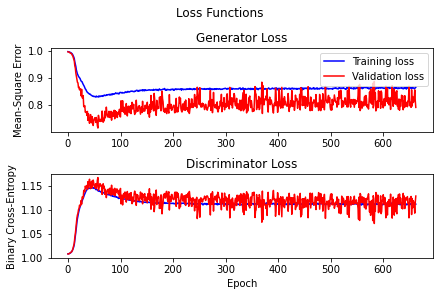

 66%|██████████████████████████████████████████████████▋                          | 659/1000 [1:35:28<45:46,  8.05s/it]


Epoch 660:


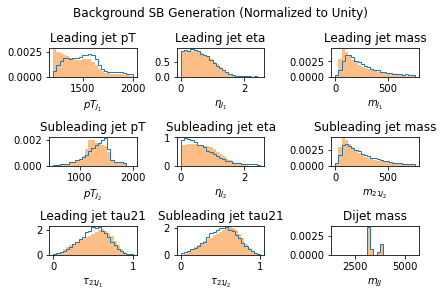

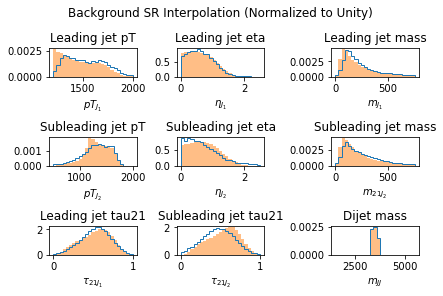

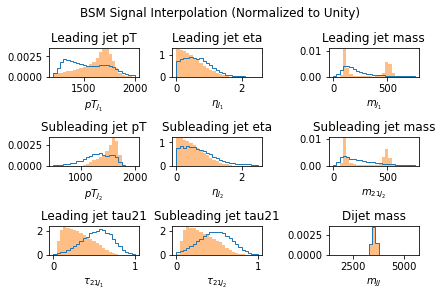

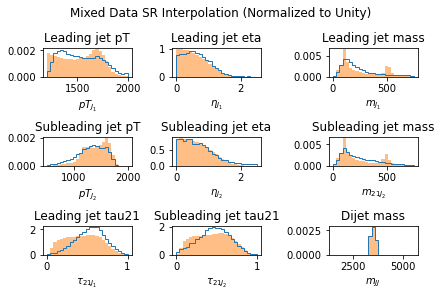

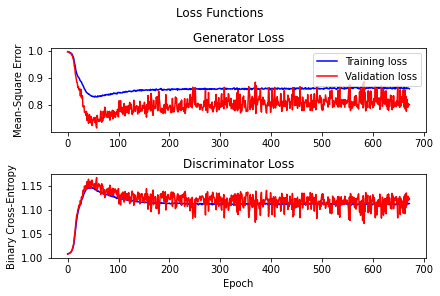

 67%|███████████████████████████████████████████████████▌                         | 669/1000 [1:36:54<44:44,  8.11s/it]


Epoch 670:


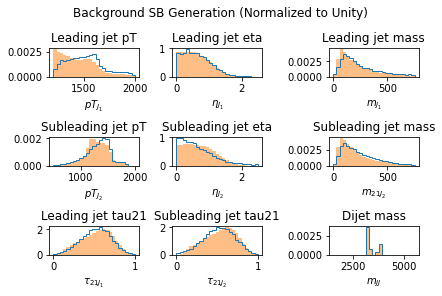

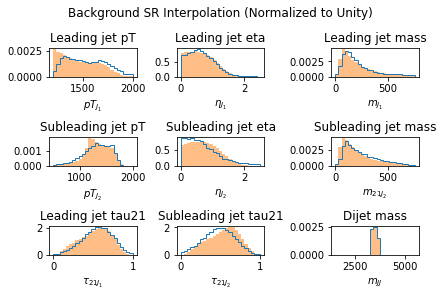

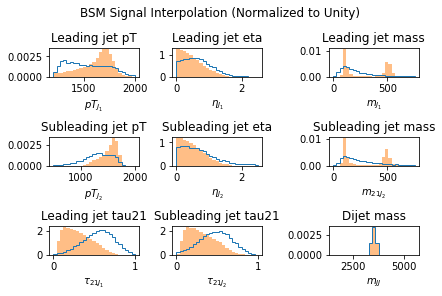

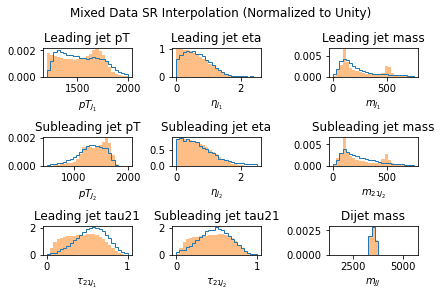

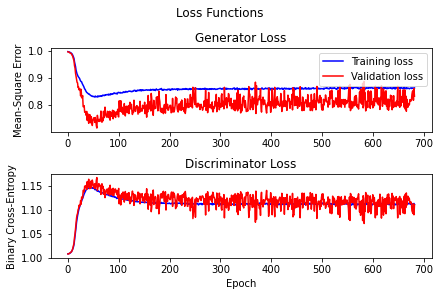

 68%|████████████████████████████████████████████████████▎                        | 679/1000 [1:38:19<43:04,  8.05s/it]


Epoch 680:


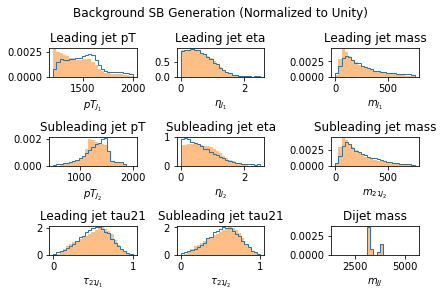

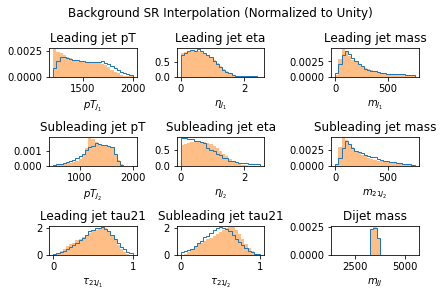

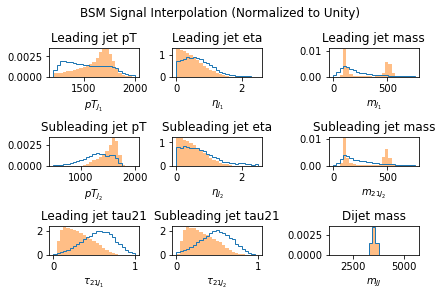

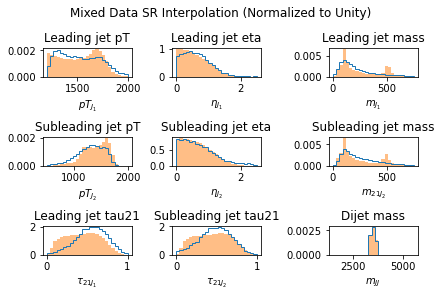

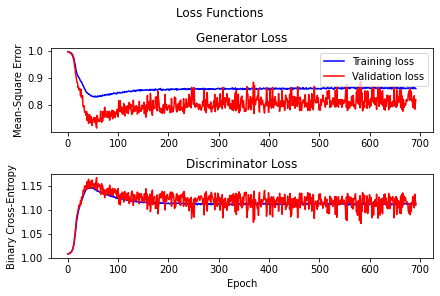

 69%|█████████████████████████████████████████████████████                        | 689/1000 [1:39:45<42:04,  8.12s/it]


Epoch 690:


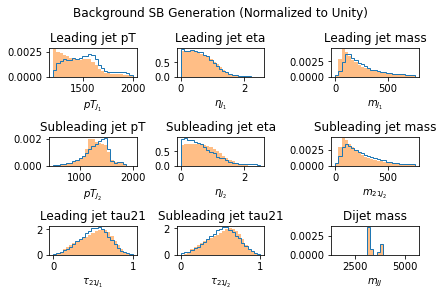

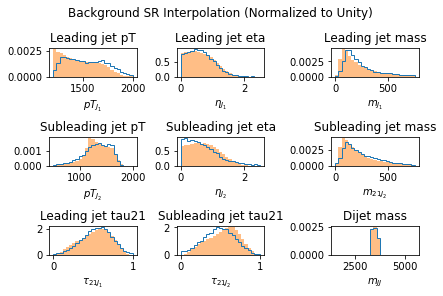

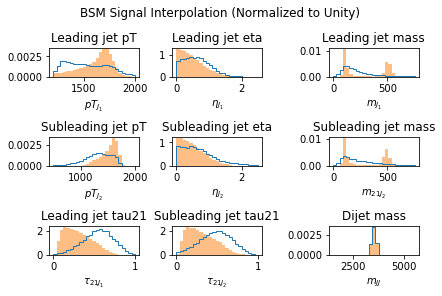

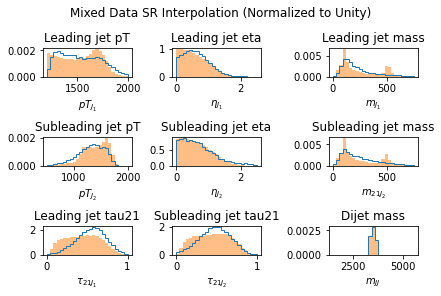

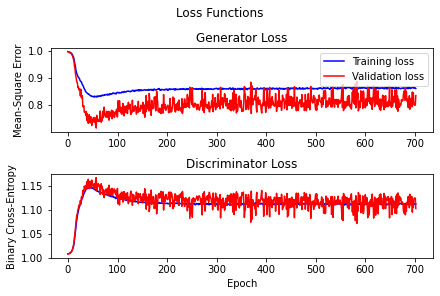

 70%|█████████████████████████████████████████████████████▊                       | 699/1000 [1:41:11<40:41,  8.11s/it]


Epoch 700:


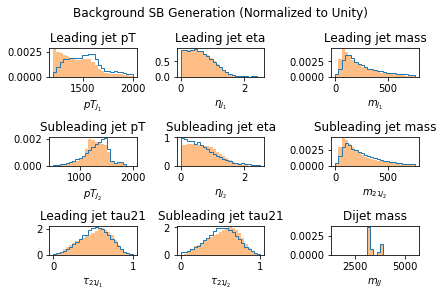

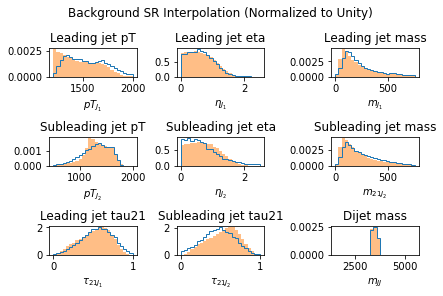

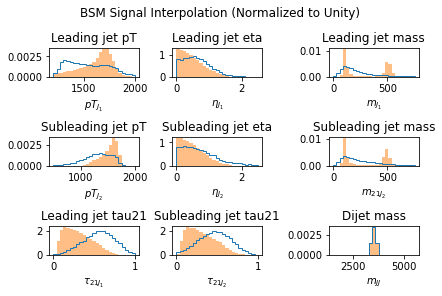

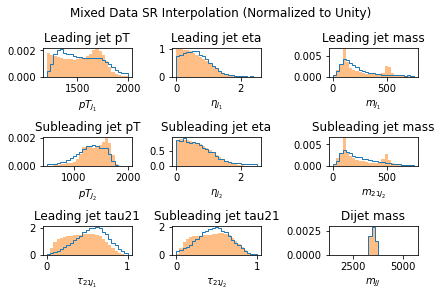

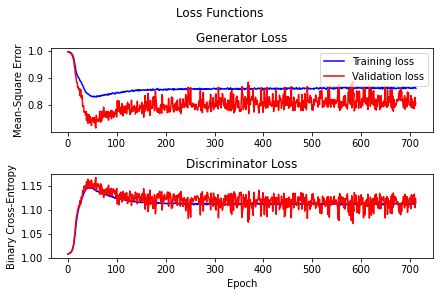

 71%|██████████████████████████████████████████████████████▌                      | 709/1000 [1:42:36<39:15,  8.09s/it]


Epoch 710:


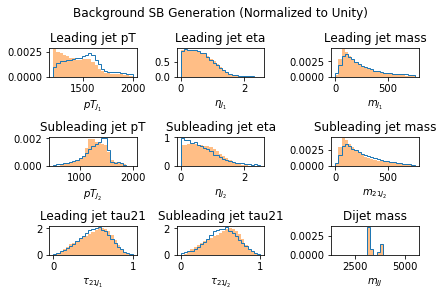

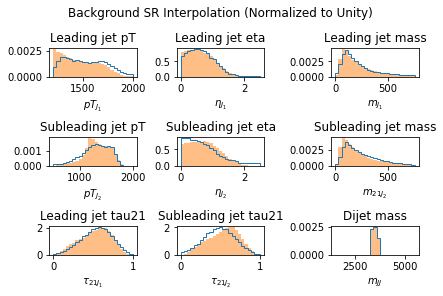

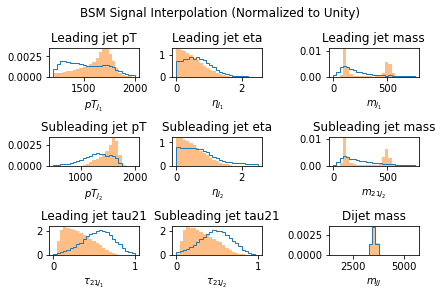

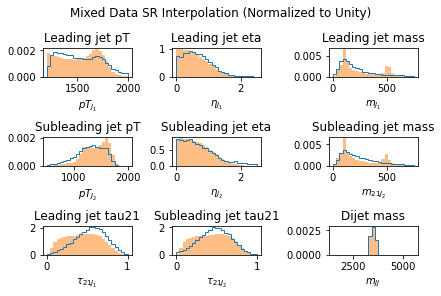

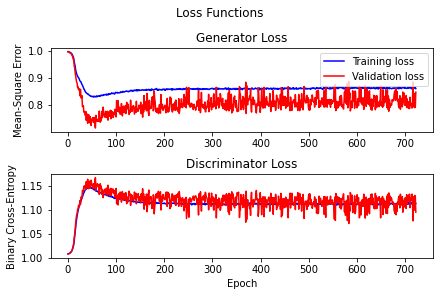

 72%|███████████████████████████████████████████████████████▎                     | 719/1000 [1:44:02<37:56,  8.10s/it]


Epoch 720:


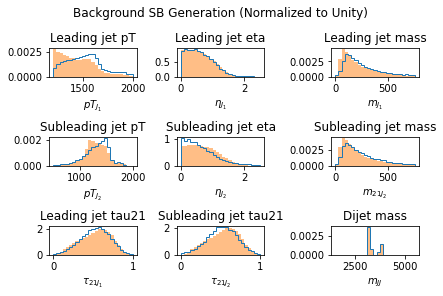

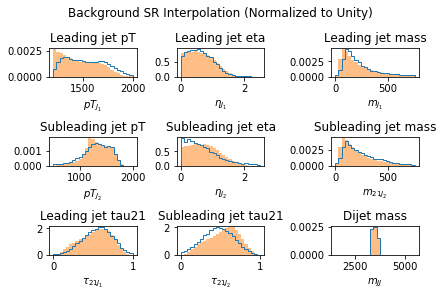

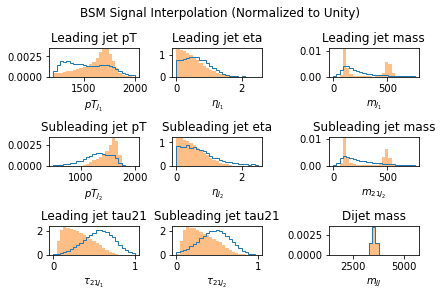

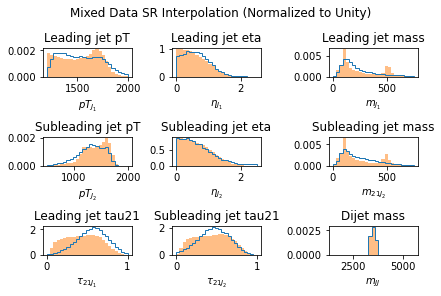

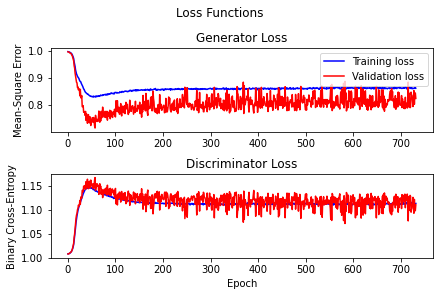

 73%|████████████████████████████████████████████████████████▏                    | 729/1000 [1:45:27<36:28,  8.08s/it]


Epoch 730:


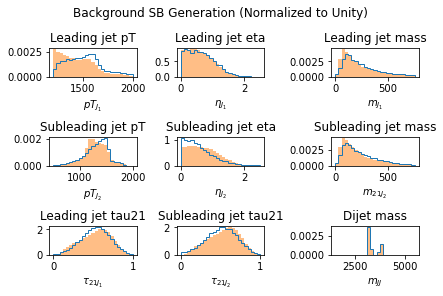

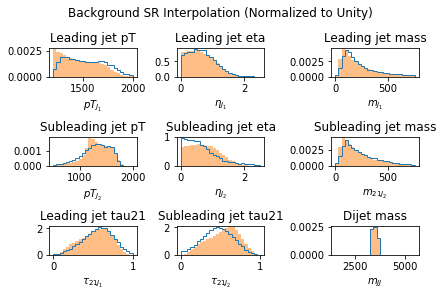

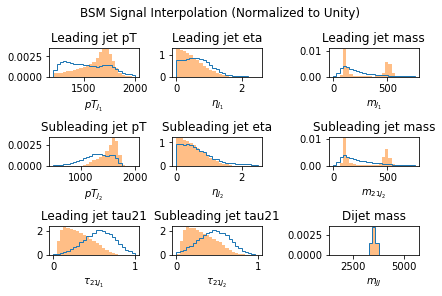

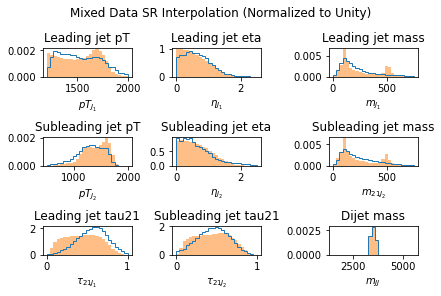

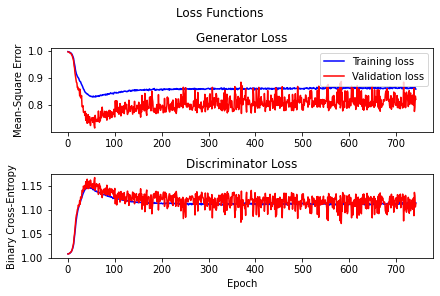

 74%|████████████████████████████████████████████████████████▉                    | 739/1000 [1:46:53<34:56,  8.03s/it]


Epoch 740:


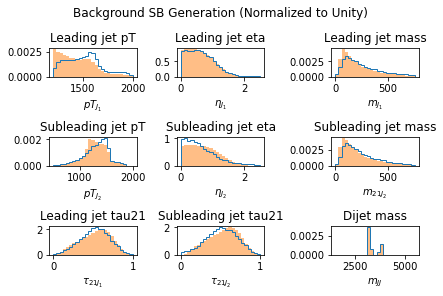

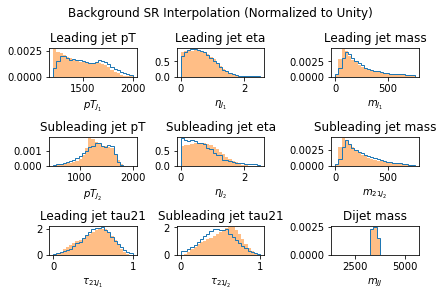

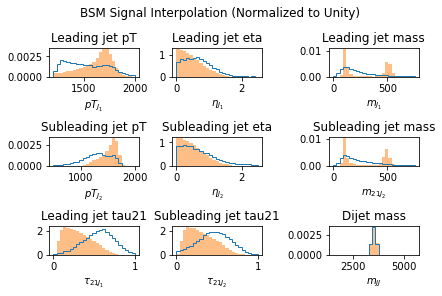

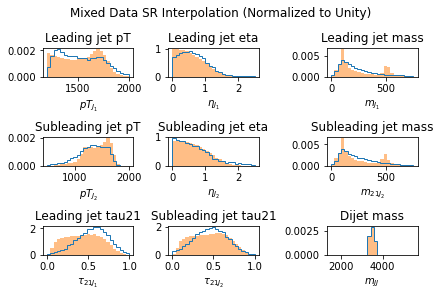

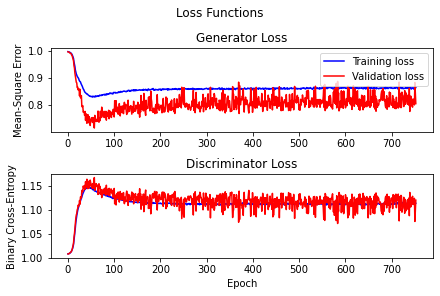

 75%|█████████████████████████████████████████████████████████▋                   | 749/1000 [1:48:17<33:07,  7.92s/it]


Epoch 750:


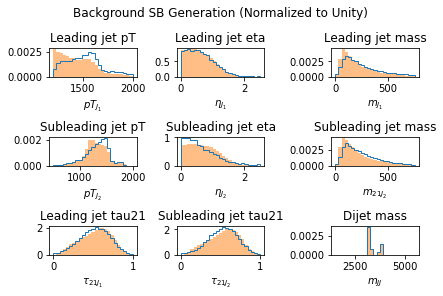

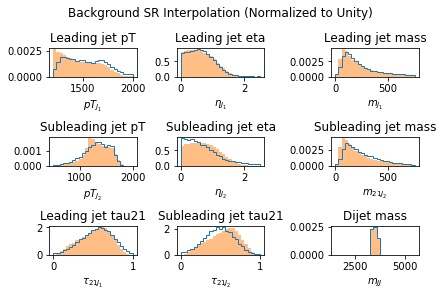

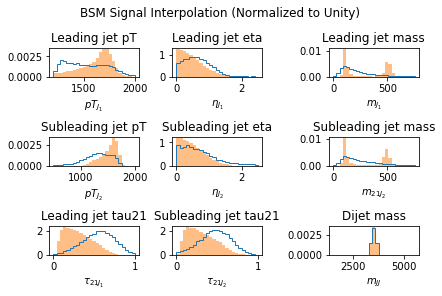

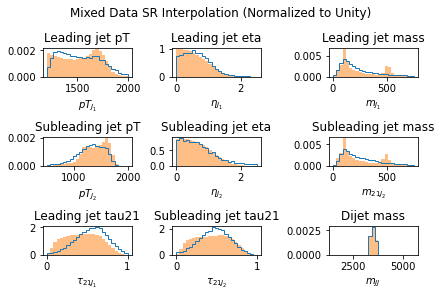

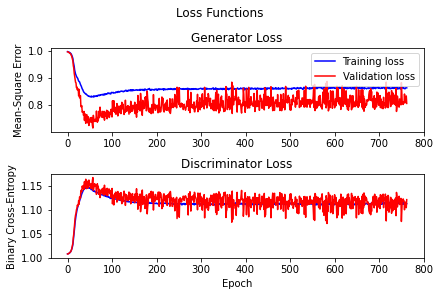

 76%|██████████████████████████████████████████████████████████▍                  | 759/1000 [1:49:40<31:33,  7.86s/it]


Epoch 760:


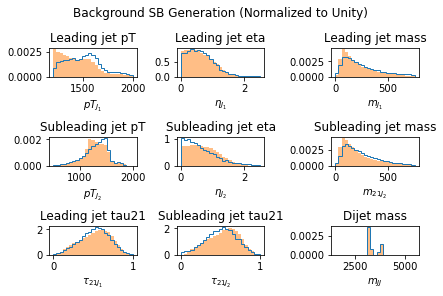

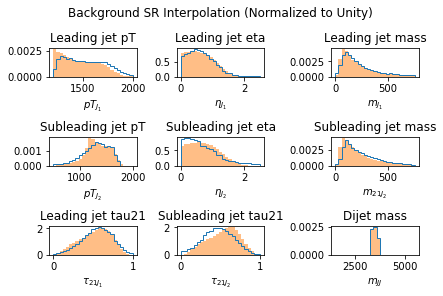

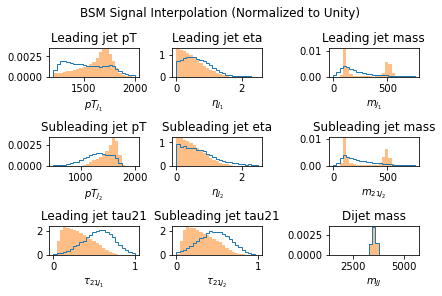

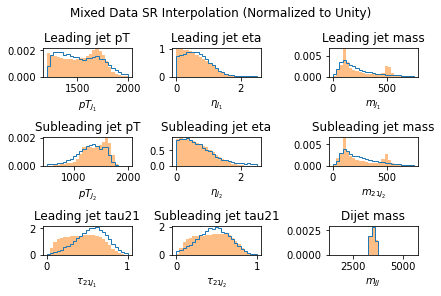

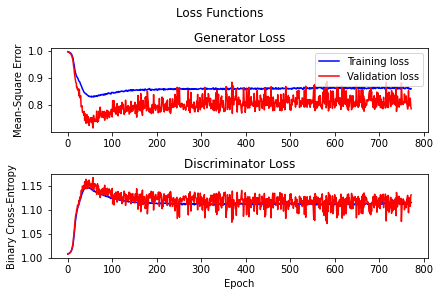

 77%|███████████████████████████████████████████████████████████▏                 | 769/1000 [1:51:03<30:09,  7.83s/it]


Epoch 770:


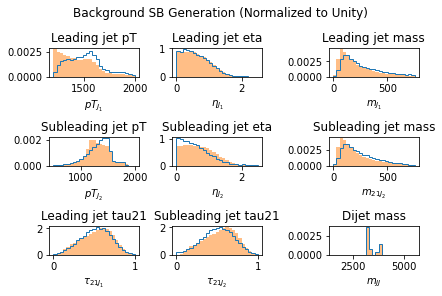

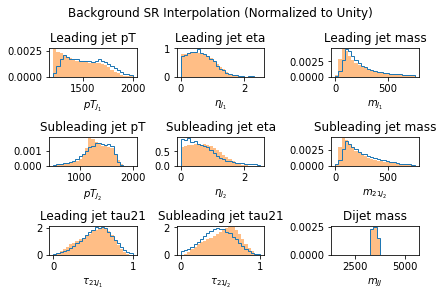

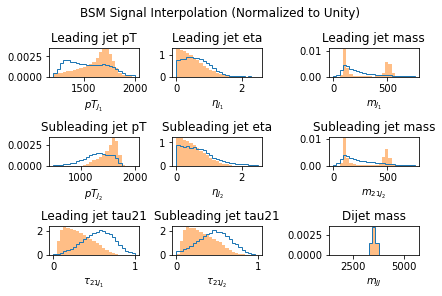

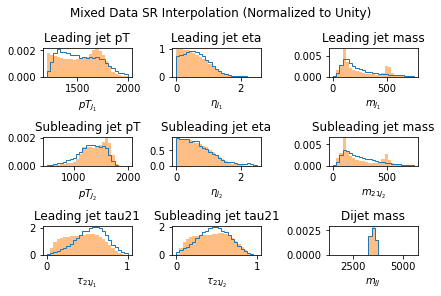

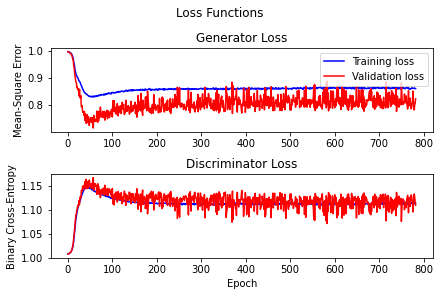

 78%|███████████████████████████████████████████████████████████▉                 | 779/1000 [1:52:26<29:18,  7.96s/it]


Epoch 780:


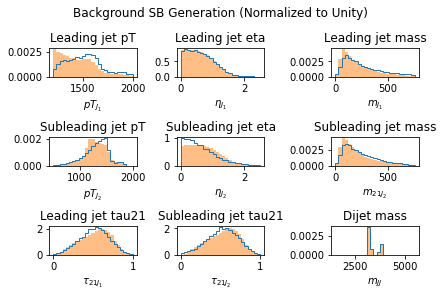

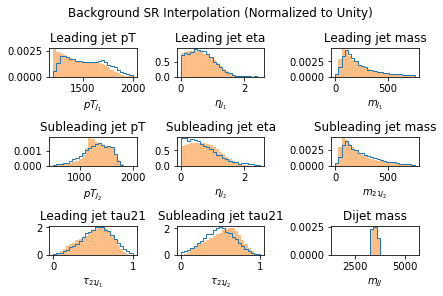

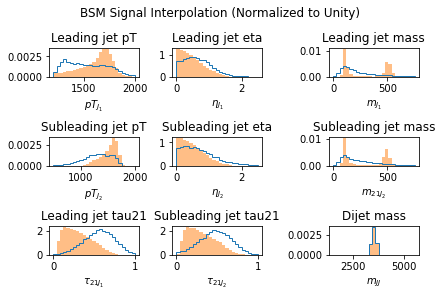

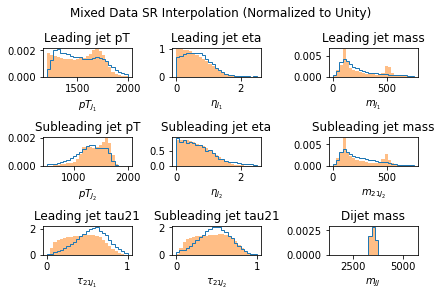

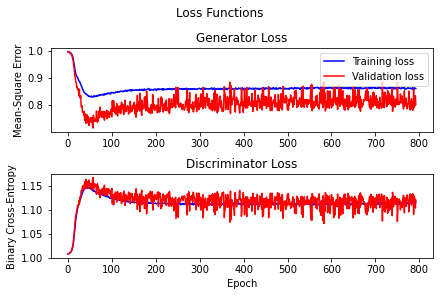

 79%|████████████████████████████████████████████████████████████▊                | 789/1000 [1:53:52<28:15,  8.04s/it]


Epoch 790:


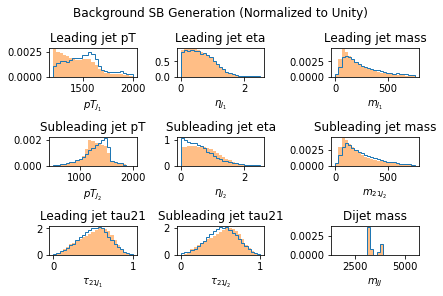

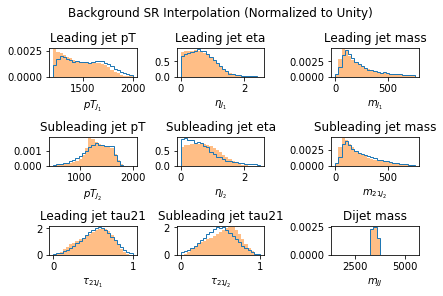

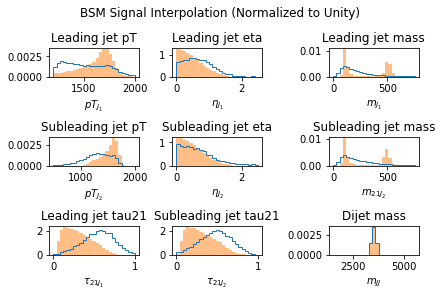

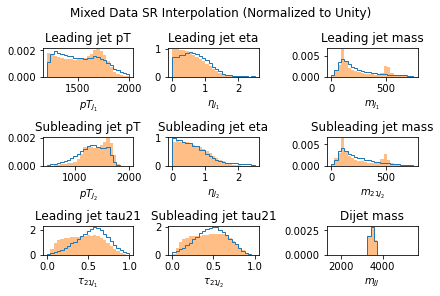

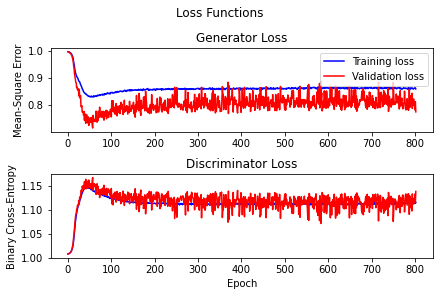

 80%|█████████████████████████████████████████████████████████████▌               | 799/1000 [1:55:16<26:53,  8.03s/it]


Epoch 800:


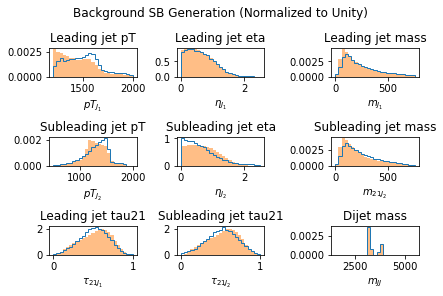

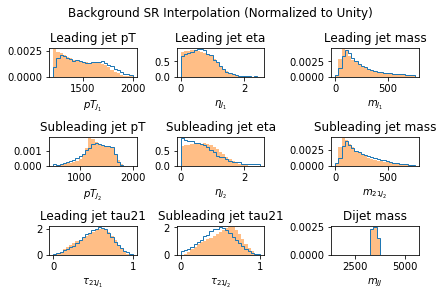

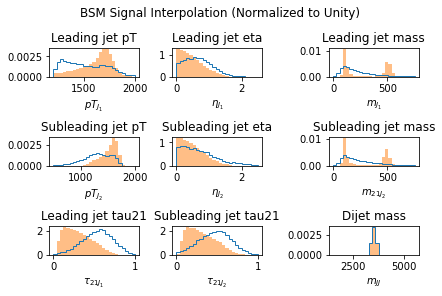

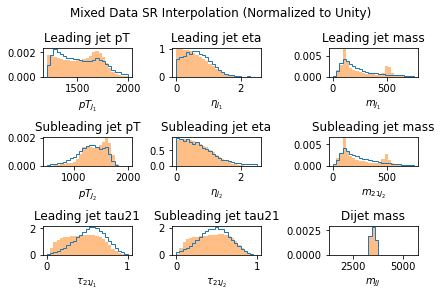

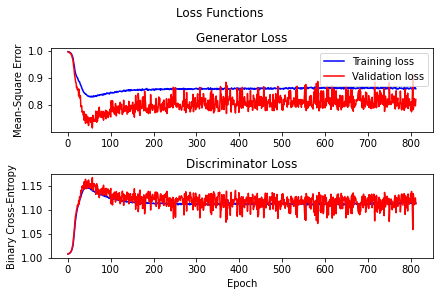

 81%|██████████████████████████████████████████████████████████████▎              | 809/1000 [1:56:41<25:34,  8.03s/it]


Epoch 810:


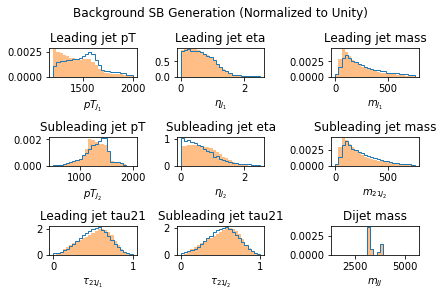

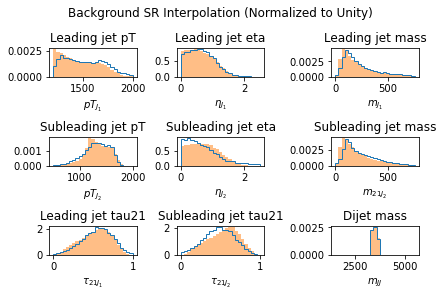

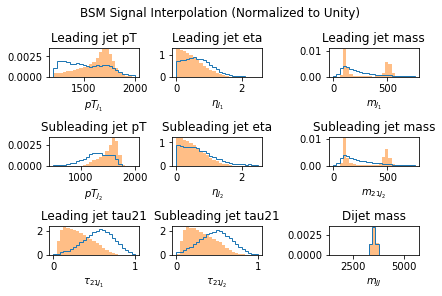

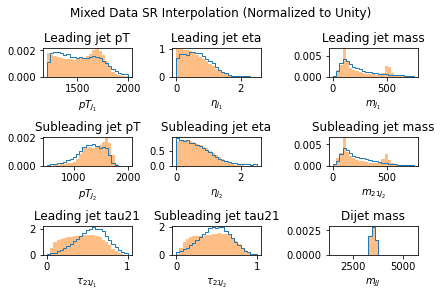

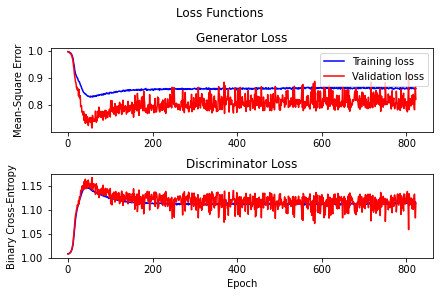

 82%|███████████████████████████████████████████████████████████████              | 819/1000 [1:58:07<24:14,  8.04s/it]


Epoch 820:


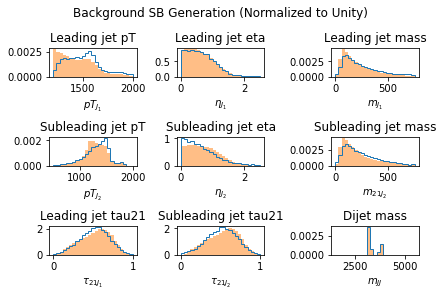

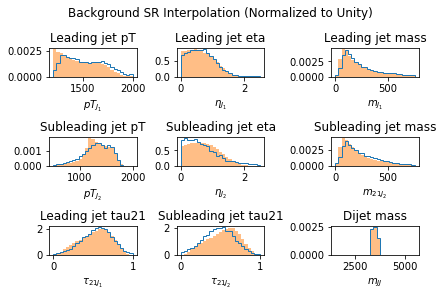

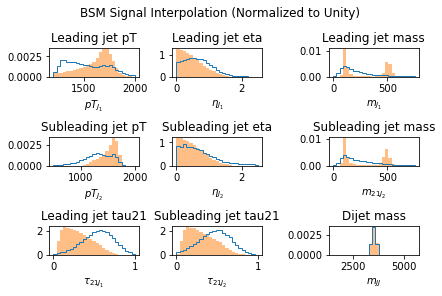

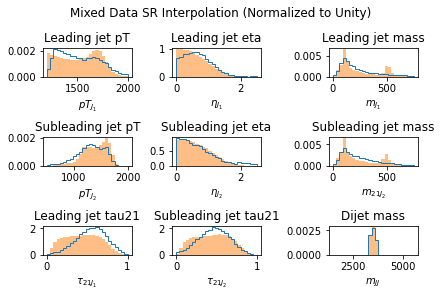

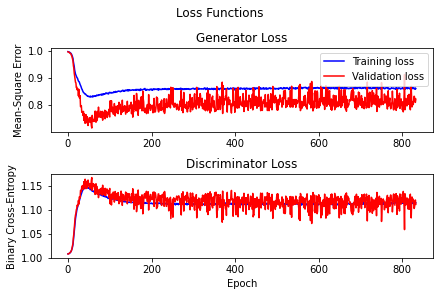

 83%|███████████████████████████████████████████████████████████████▊             | 829/1000 [1:59:35<23:24,  8.21s/it]


Epoch 830:


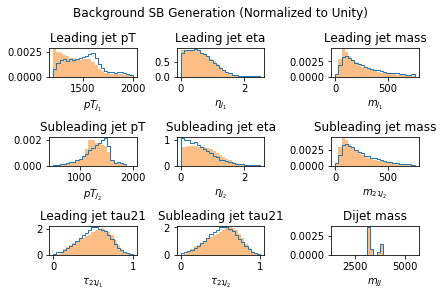

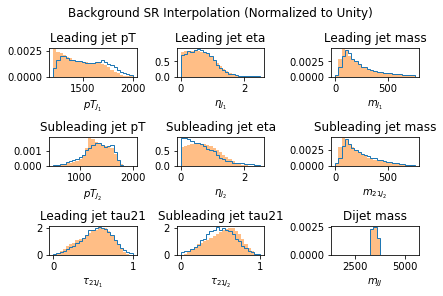

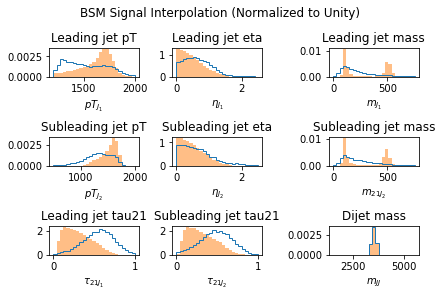

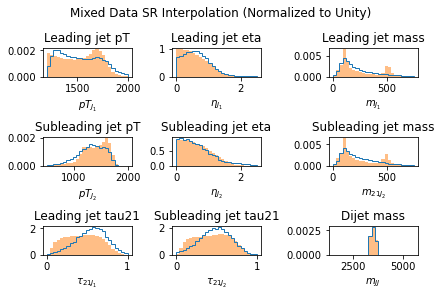

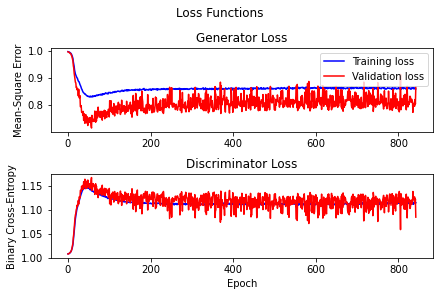

 84%|████████████████████████████████████████████████████████████████▌            | 839/1000 [2:01:01<21:36,  8.05s/it]


Epoch 840:


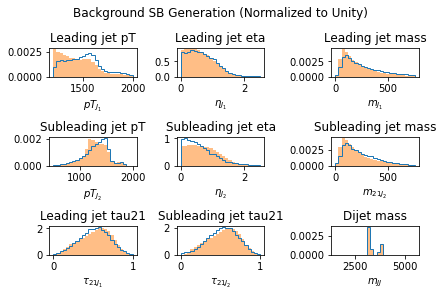

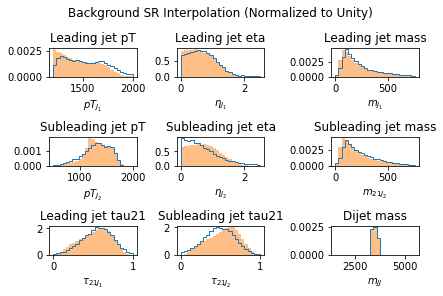

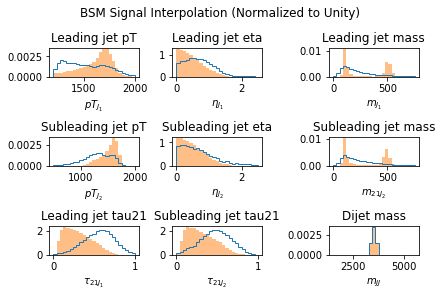

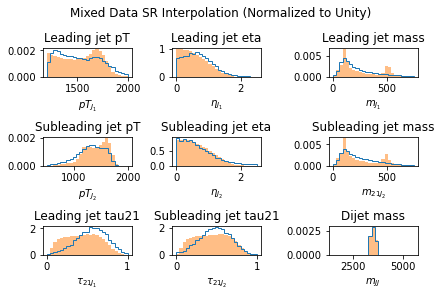

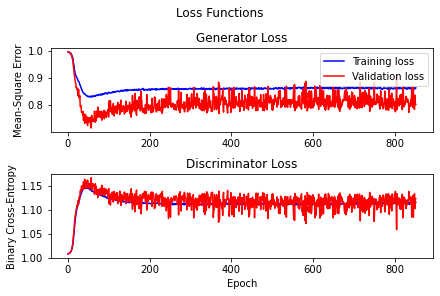

 85%|█████████████████████████████████████████████████████████████████▎           | 849/1000 [2:02:26<20:22,  8.09s/it]


Epoch 850:


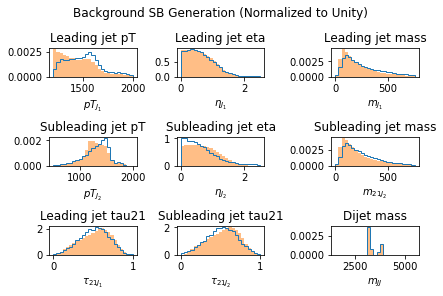

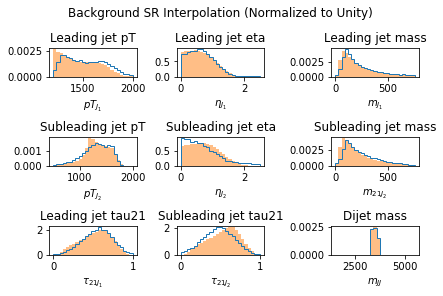

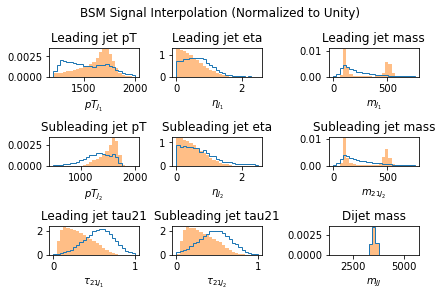

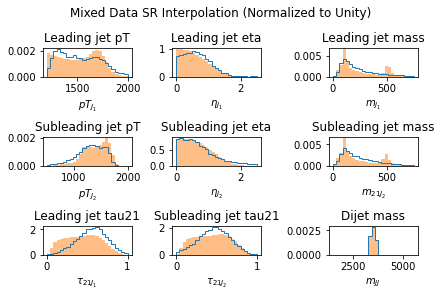

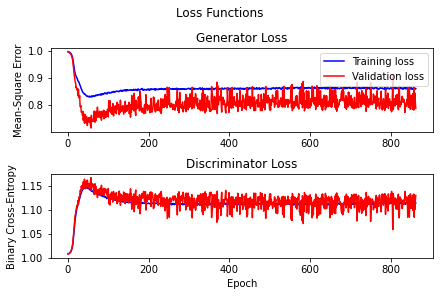

 86%|██████████████████████████████████████████████████████████████████▏          | 859/1000 [2:03:52<19:02,  8.10s/it]


Epoch 860:


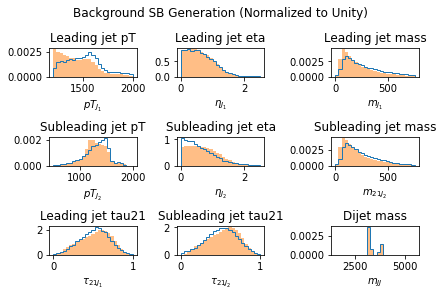

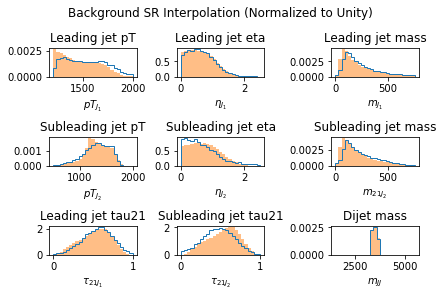

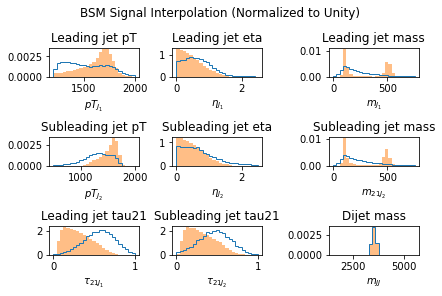

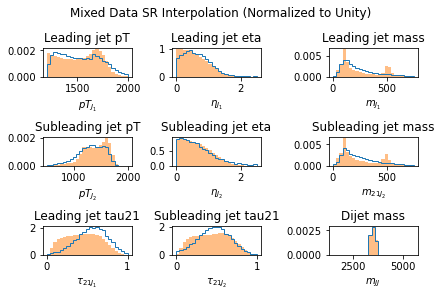

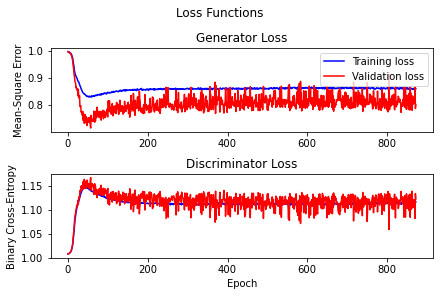

 87%|██████████████████████████████████████████████████████████████████▉          | 869/1000 [2:05:17<17:38,  8.08s/it]


Epoch 870:


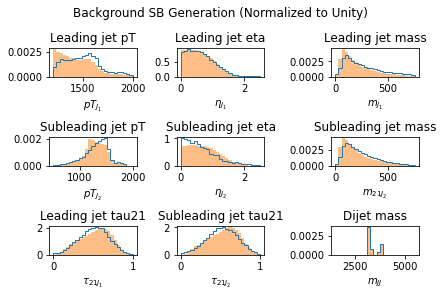

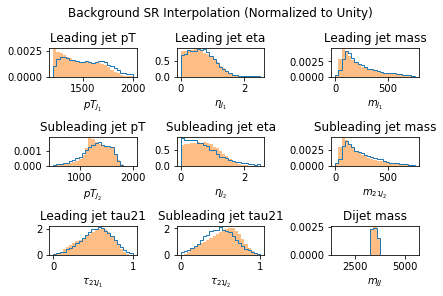

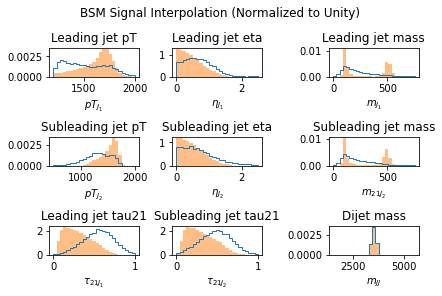

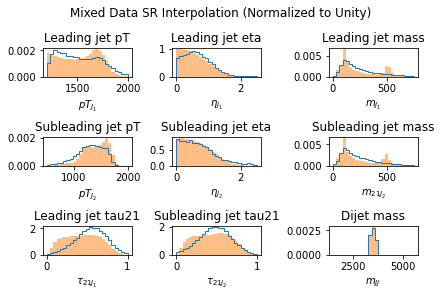

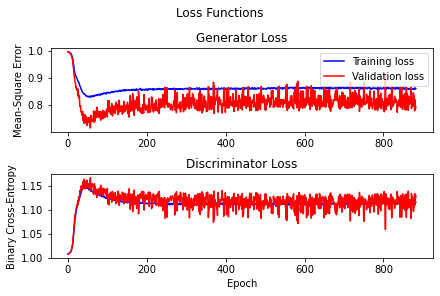

 88%|███████████████████████████████████████████████████████████████████▋         | 879/1000 [2:06:43<16:25,  8.15s/it]


Epoch 880:


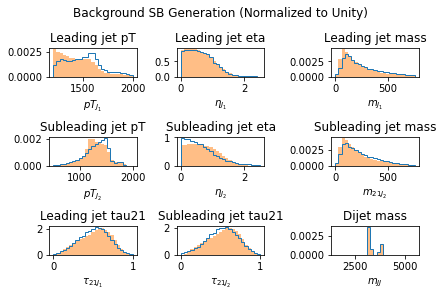

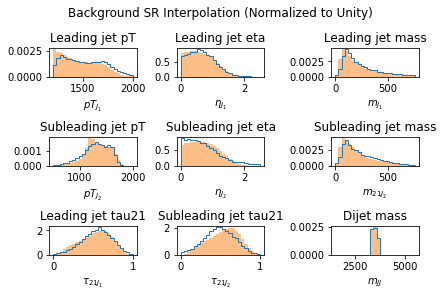

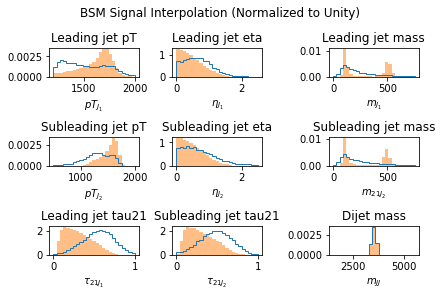

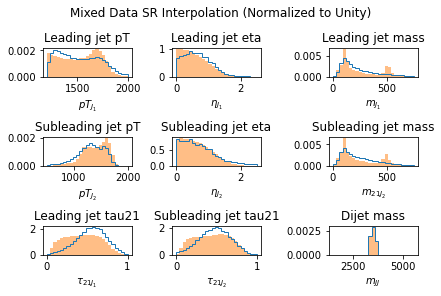

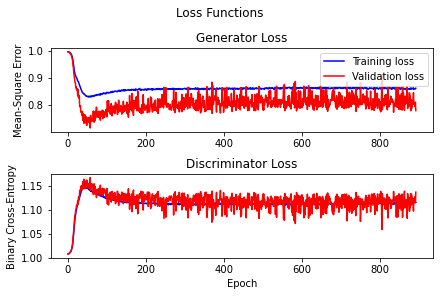

 89%|████████████████████████████████████████████████████████████████████▍        | 889/1000 [2:08:09<15:00,  8.12s/it]


Epoch 890:


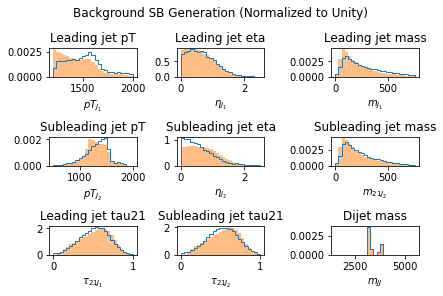

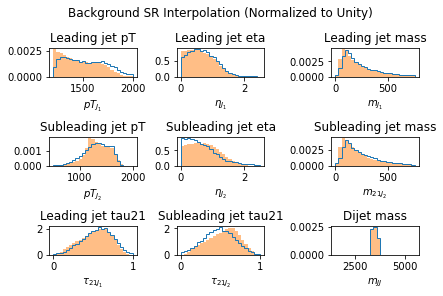

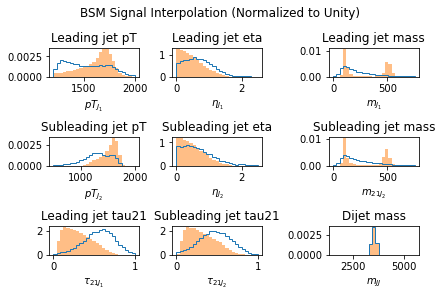

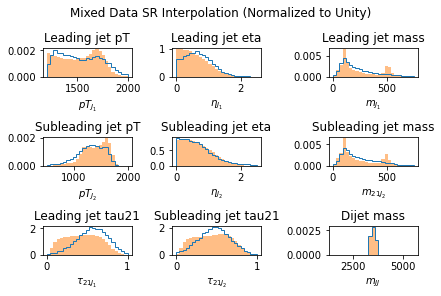

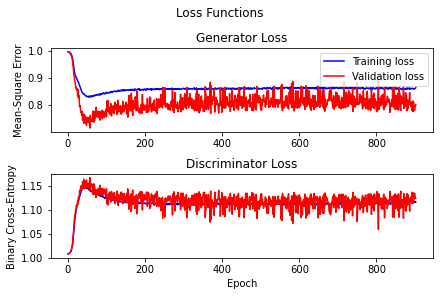

 90%|█████████████████████████████████████████████████████████████████████▏       | 899/1000 [2:09:35<13:33,  8.06s/it]


Epoch 900:


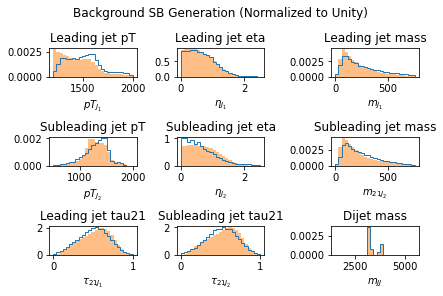

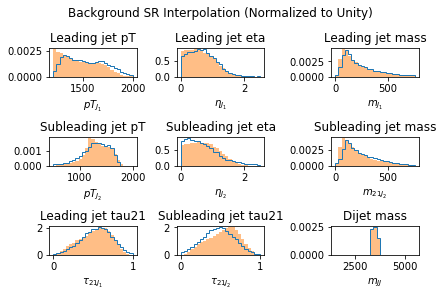

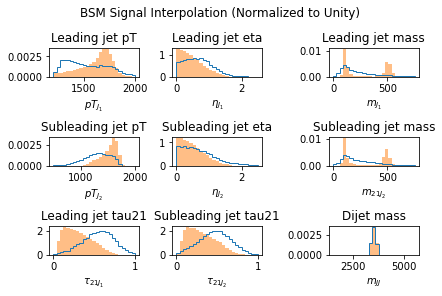

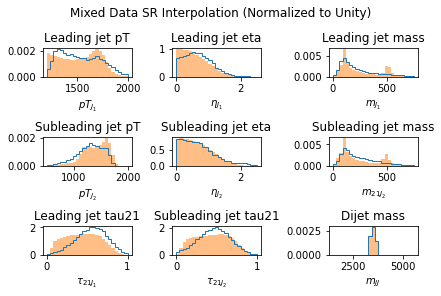

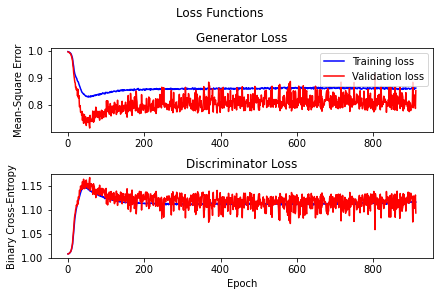

 91%|█████████████████████████████████████████████████████████████████████▉       | 909/1000 [2:11:00<12:13,  8.06s/it]


Epoch 910:


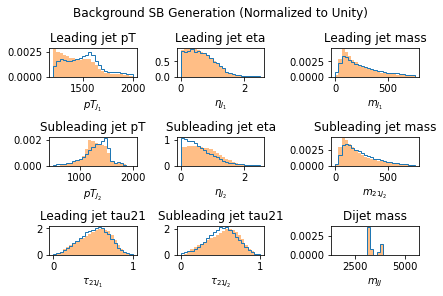

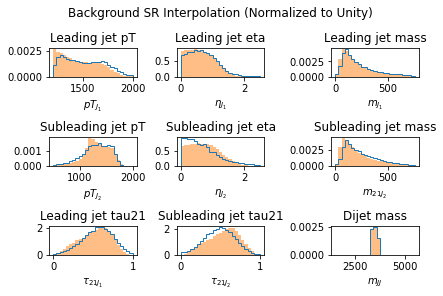

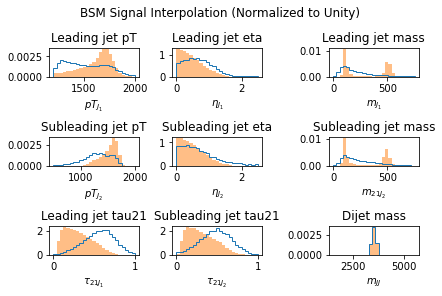

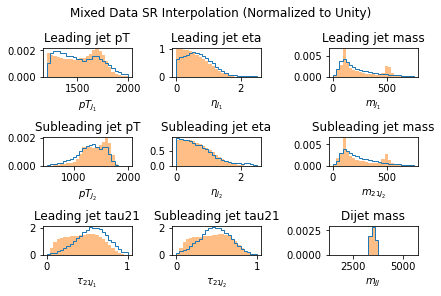

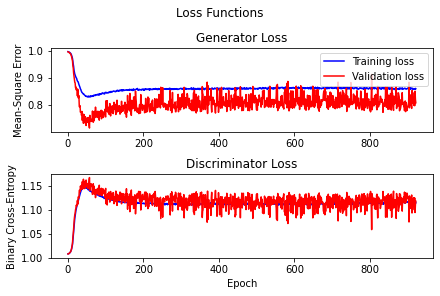

 92%|██████████████████████████████████████████████████████████████████████▊      | 919/1000 [2:12:25<10:57,  8.11s/it]


Epoch 920:


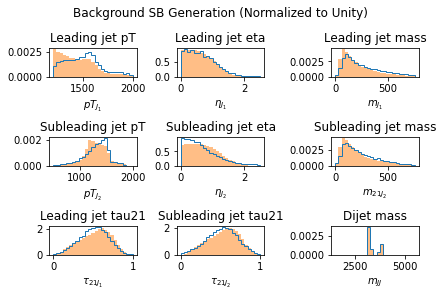

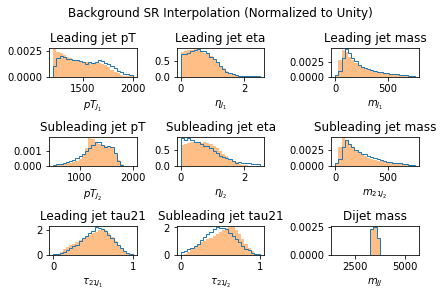

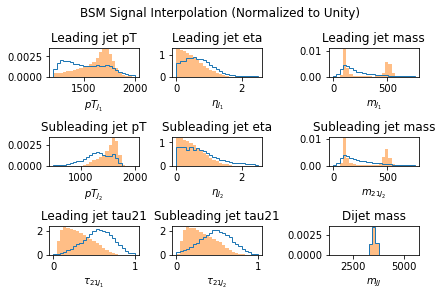

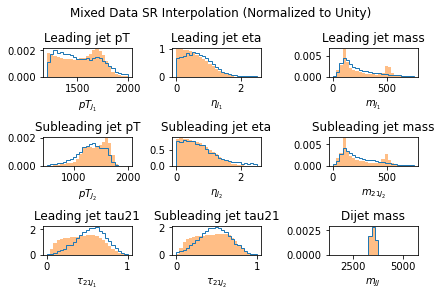

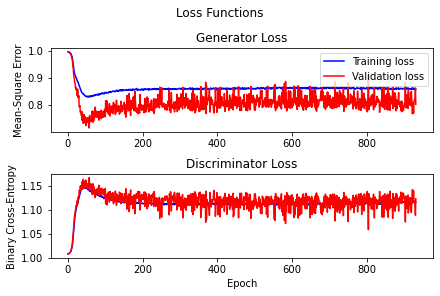

 93%|███████████████████████████████████████████████████████████████████████▌     | 929/1000 [2:13:51<09:36,  8.13s/it]


Epoch 930:


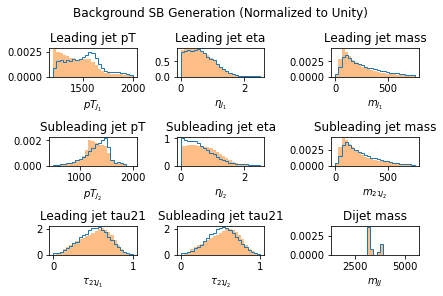

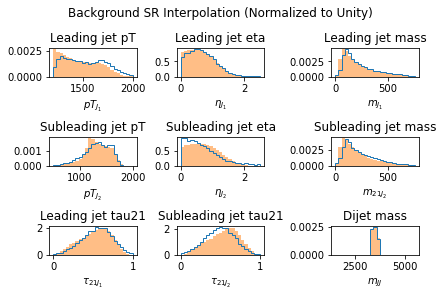

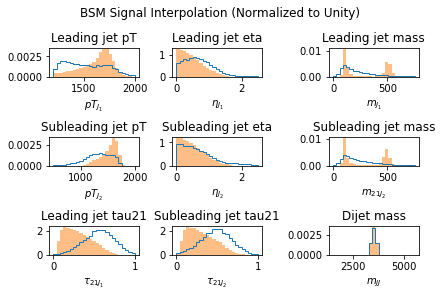

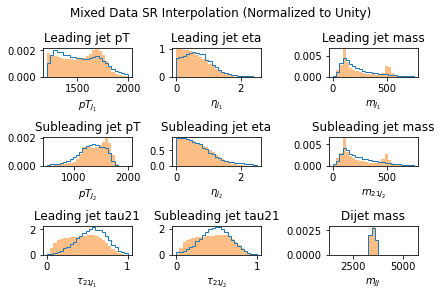

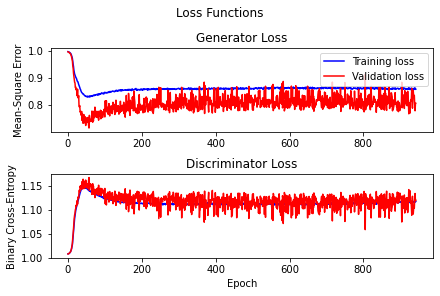

 94%|████████████████████████████████████████████████████████████████████████▎    | 939/1000 [2:15:17<08:16,  8.13s/it]


Epoch 940:


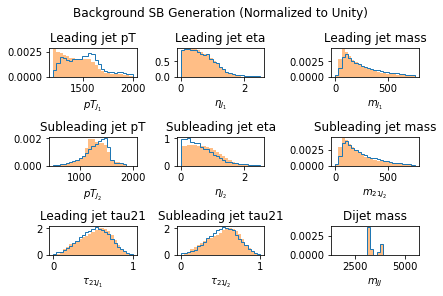

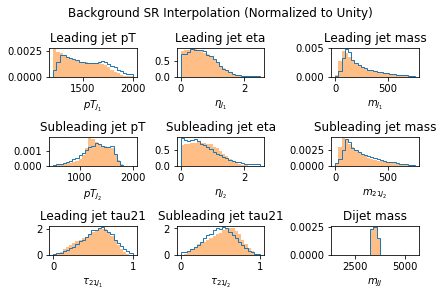

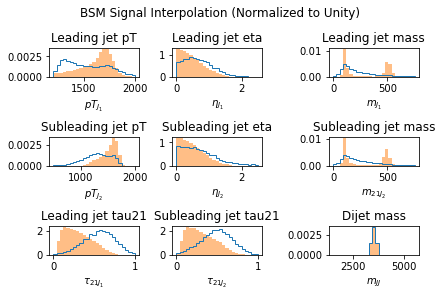

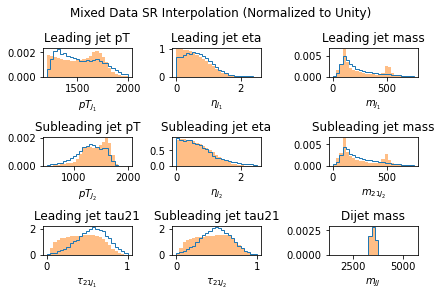

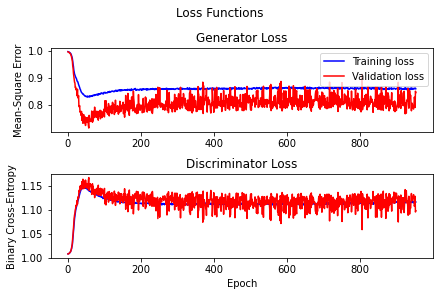

 95%|█████████████████████████████████████████████████████████████████████████    | 949/1000 [2:16:43<06:53,  8.11s/it]


Epoch 950:


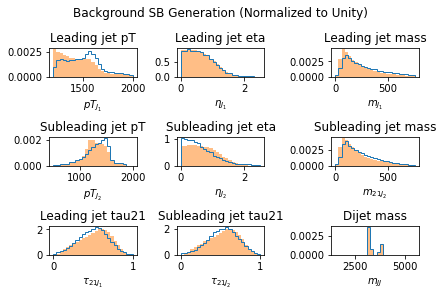

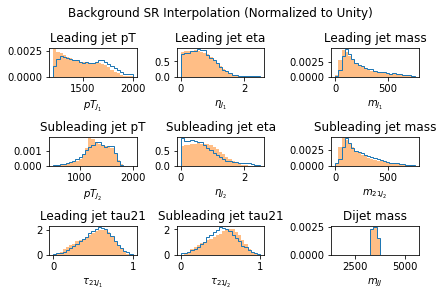

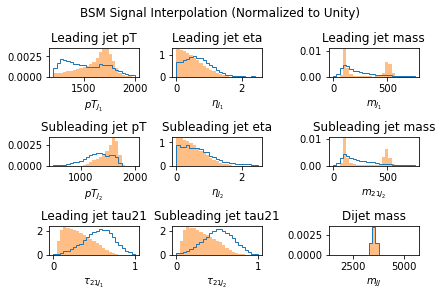

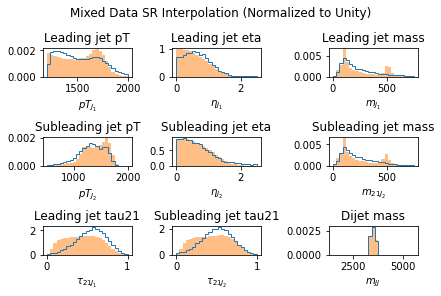

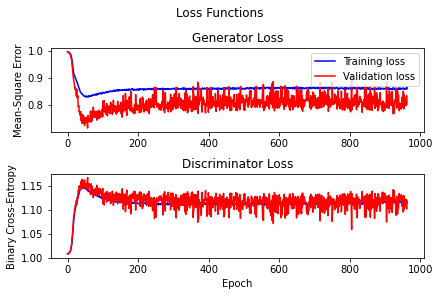

 96%|█████████████████████████████████████████████████████████████████████████▊   | 959/1000 [2:18:09<05:33,  8.13s/it]


Epoch 960:


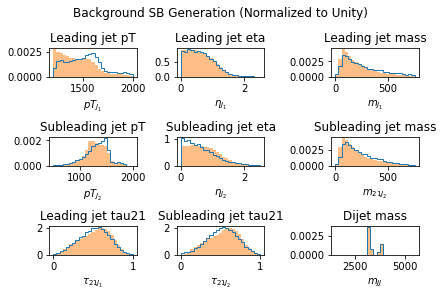

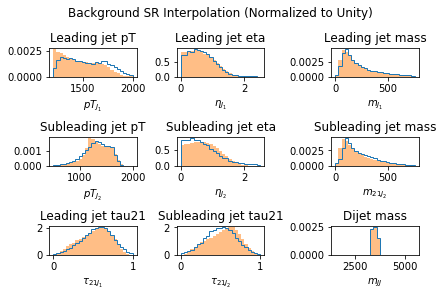

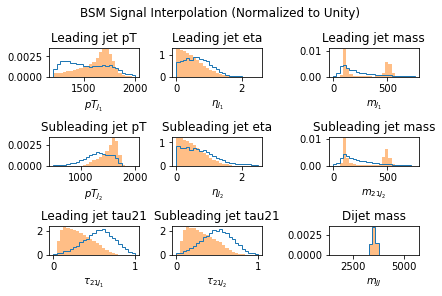

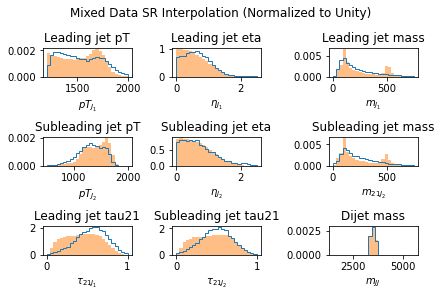

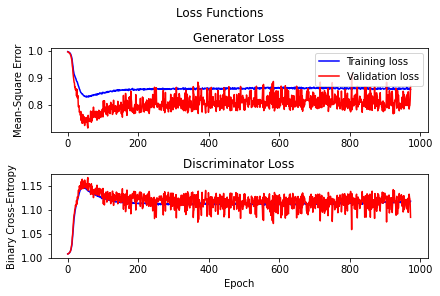

 97%|██████████████████████████████████████████████████████████████████████████▌  | 969/1000 [2:19:34<04:09,  8.05s/it]


Epoch 970:


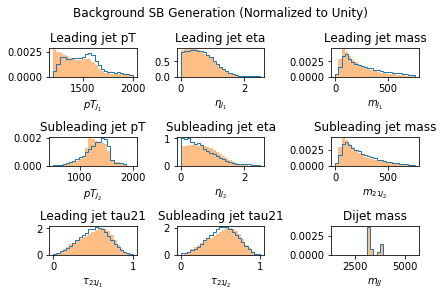

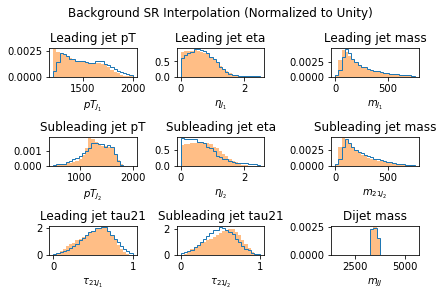

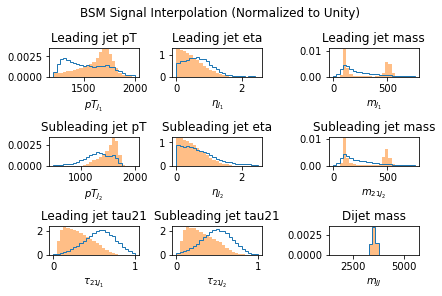

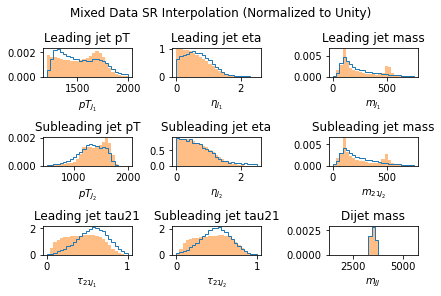

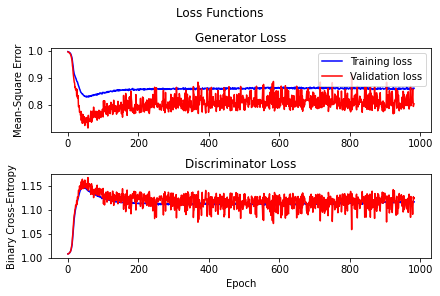

 98%|███████████████████████████████████████████████████████████████████████████▍ | 979/1000 [2:20:59<02:48,  8.03s/it]


Epoch 980:


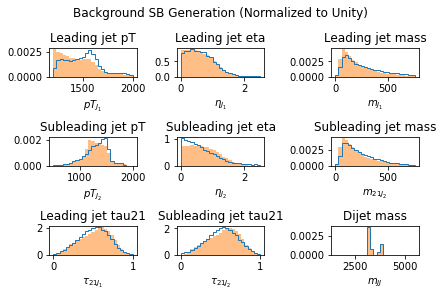

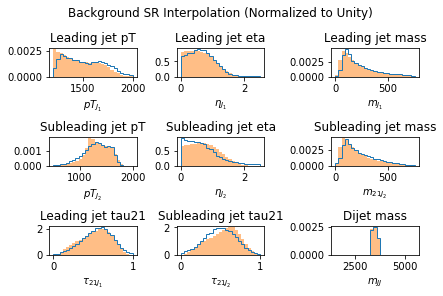

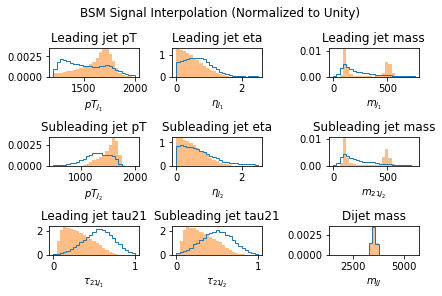

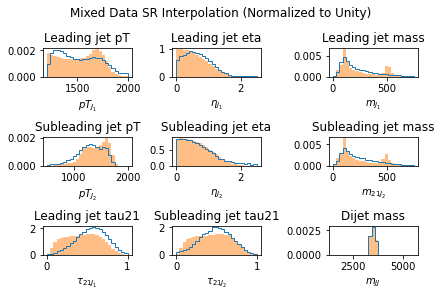

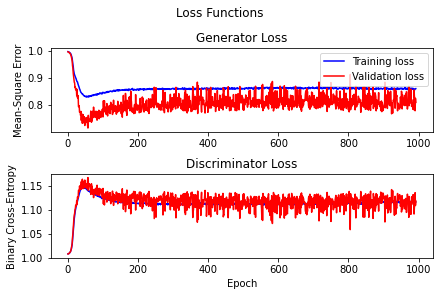

 99%|████████████████████████████████████████████████████████████████████████████▏| 989/1000 [2:22:24<01:28,  8.04s/it]


Epoch 990:


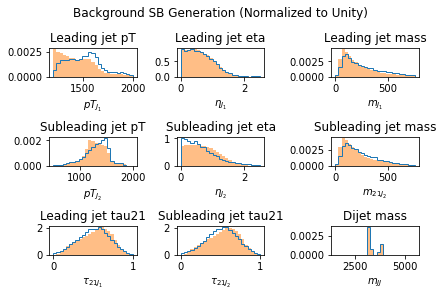

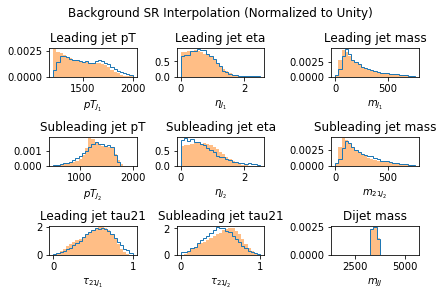

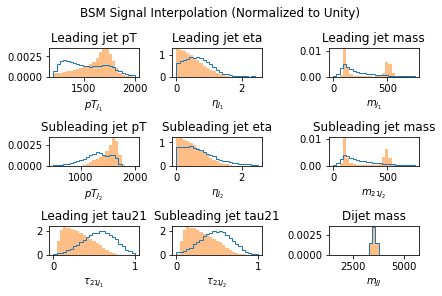

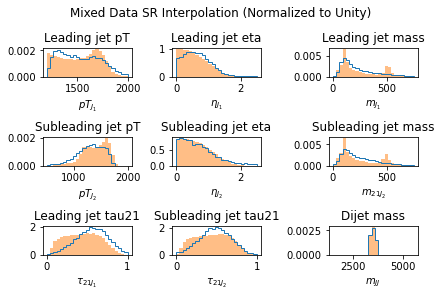

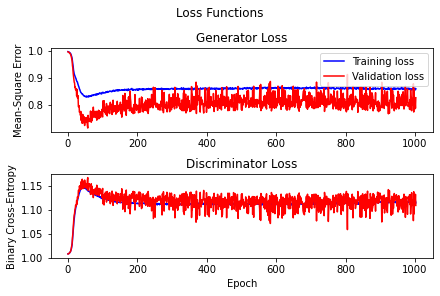

100%|████████████████████████████████████████████████████████████████████████████▉| 999/1000 [2:23:49<00:08,  8.09s/it]


Epoch 1000:


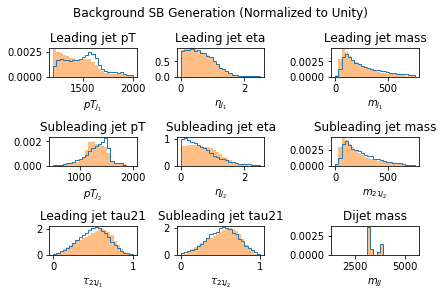

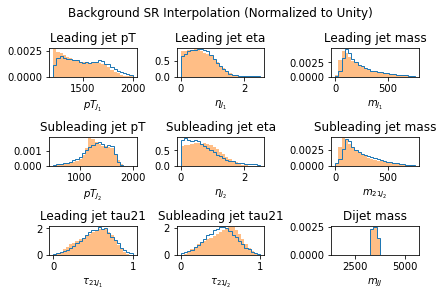

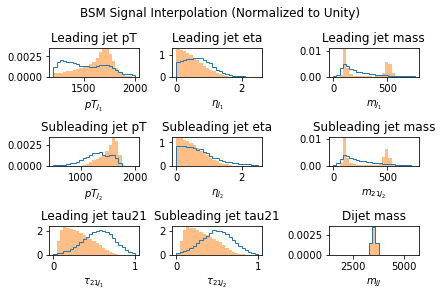

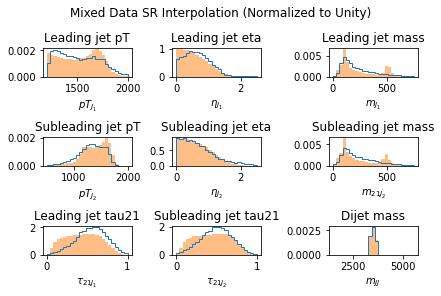

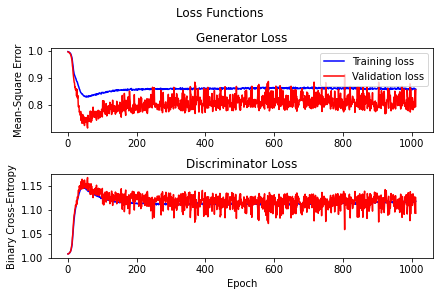

100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [2:24:03<00:00,  8.64s/it]


In [69]:
print("Now training model for {} epochs".format(EPOCHS))
train(train_dataset, test_dataset, 1000, pretrain = False)

# Above is the trainning for CDJETGAN, Next part will be to convert the fake data to pandasdataframe in order to do classifier

In [49]:
def graph_gan(generator, mode = "bg_SB"):
    plt.close()

    if mode == "bg_SB":
        realdata = np_bg_SB
        label = "Background Sideband"
        ganlabel = "GAN"
        title = "Background SB Generation (Normalized to Unity)"
    elif mode == "bg_SR":
        realdata = np_bg_SR
        label = "Background Signal Region"
        ganlabel = "GAN Interpolation"
        title = "Background SR Interpolation (Normalized to Unity)"
    elif mode == "sig_SR":
        realdata = np_sig_SR
        label = "BSM Signal"
        ganlabel = "GAN Interpolation"
        title = "BSM Signal Interpolation (Normalized to Unity)"
    elif mode == "combined_SR":
        realdata = np_combined_SR
        label = "Mixed Signal Region"
        ganlabel = "GAN Interpolation"
        title = "Mixed Data SR Interpolation (Normalized to Unity)"
    else:
        raise ValueError("Unexpected mode {} in graph_gan()".format(mode))

    labels = sample_labels(refdata = realdata, size = SAMPLE_SIZE) # Sample mjj from the existing distribution of mjj for comparison
    labels_scaled = scaler_mjj.transform(labels.reshape(-1,1))
    
    fakedata_uncut_unscaled = generator(tf.concat([tf.random.uniform((SAMPLE_SIZE, NOISE_DIM)), labels_scaled], 1), training=False)
    fakedata_uncut = np.concatenate((scaler.inverse_transform(fakedata_uncut_unscaled), labels.reshape(-1,1)), axis = 1)

    # At least one jet has pT > 1200 and |eta| < 2.5
    fakedata = cut_data(fakedata_uncut)
    
    f, a = plt.subplots(3, 3, constrained_layout=True)

    f.suptitle(title)

    a[0, 0].set_title("Leading jet pT")
    a[0, 0].set_xlabel("$pT_{J_1}$")
    a[0, 0].hist(realdata[:,0], bins = BINS, range = (1200, 2000), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[0, 0].hist(fakedata[:,0], bins = BINS, range = (1200, 2000), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[0, 1].set_title("Leading jet eta")
    a[0, 1].set_xlabel("$\\eta_{J_1}$")
    a[0, 1].hist(realdata[:,1], bins = BINS, range = (0, 2.5), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[0, 1].hist(fakedata[:,1], bins = BINS, range = (0, 2.5), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[0, 2].set_title("Leading jet mass")
    a[0, 2].set_xlabel("$m_{J_1}$")
    a[0, 2].hist(realdata[:,2], bins = BINS, range = (0, 750), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[0, 2].hist(fakedata[:,2], bins = BINS, range = (0, 750), color = "tab:blue", histtype = "step", label = ganlabel, density = True)
    
    a[1, 0].set_title("Subleading jet pT")
    a[1, 0].set_xlabel("$pT_{J_2}$")
    a[1, 0].hist(realdata[:,3], bins = BINS, range = (500, 2000), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[1, 0].hist(fakedata[:,3], bins = BINS, range = (500, 2000), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[1, 1].set_title("Subleading jet eta")
    a[1, 1].set_xlabel("$\\eta_{J_2}$")
    a[1, 1].hist(realdata[:,4], bins = BINS, range = (0, 2.5), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[1, 1].hist(fakedata[:,4], bins = BINS, range = (0, 2.5), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[1, 2].set_title("Subleading jet mass")
    a[1, 2].set_xlabel("$m_{21J_2}$")
    a[1, 2].hist(realdata[:,6], bins = BINS, range = (0, 750), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[1, 2].hist(fakedata[:,6], bins = BINS, range = (0, 750), color = "tab:blue", histtype = "step", label = ganlabel, density = True)
    
    a[2, 0].set_title("Leading jet tau21")
    a[2, 0].set_xlabel("$\\tau_{21J_1}$")
    a[2, 0].hist(realdata[:,7], bins = BINS, range = (0, 1), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[2, 0].hist(fakedata[:,7], bins = BINS, range = (0, 1), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[2, 1].set_title("Subleading jet tau21")
    a[2, 1].set_xlabel("$\\tau_{21J_2}$")
    a[2, 1].hist(realdata[:,8], bins = BINS, range = (0, 1), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[2, 1].hist(fakedata[:,8], bins = BINS, range = (0, 1), color = "tab:blue", histtype = "step", label = ganlabel, density = True)

    a[2, 2].set_title("Dijet mass")
    a[2, 2].set_xlabel("$m_{JJ}$")
    a[2, 2].hist(realdata[:,9], bins = BINS, range = (1500, 5500), color = "tab:orange", alpha = 0.5, label = label, density = True)
    a[2, 2].hist(fakedata[:,9], bins = BINS, range = (1500, 5500), color = "tab:blue", histtype = "step", label = ganlabel, density = True)
    # a[2, 2].legend(loc="right") # Too cramped
    
    if TESTING:
        plt.show()
    else:
        plt.show()
    return fakedata

SB generation

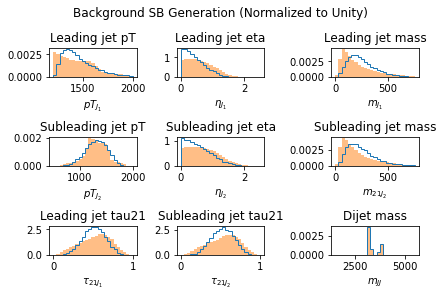

In [50]:
fakedata=graph_gan(generator, mode = "bg_SB")

In [51]:
CdjetGAN_FakeDATA=pd.DataFrame(pd.np.empty((0, 5)))  
CdjetGAN_FakeDATA.columns=['mjj','mj1','mj2','tau21j1','tau21j2'] 
CdjetGAN_FakeDATA['mjj']=fakedata[:,9]
CdjetGAN_FakeDATA['mj1']=fakedata[:,2]
CdjetGAN_FakeDATA['mj2']=fakedata[:,6]
CdjetGAN_FakeDATA['tau21j1']=fakedata[:,7]
CdjetGAN_FakeDATA['tau21j2']=fakedata[:,8]

D:\Users\Azure\anaconda3\envs\GPU\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  """Entry point for launching an IPython kernel.


In [52]:
CdjetGAN_FakeDATA

,mjj,mj1,mj2,tau21j1,tau21j2
0,3252.399658,267.576306,252.899117,0.554632,0.442473
1,3817.323730,64.566879,102.175559,0.529642,0.704786
2,3892.324219,203.628515,340.393140,0.586032,0.583640
3,3801.354492,177.555842,87.267258,0.620885,0.690140
4,3160.573975,89.829342,524.517902,0.466776,0.495602
...,...,...,...,...,...
19995,3257.107178,234.404749,130.767091,0.308990,0.443856
19996,3275.111328,223.312683,175.933375,0.611359,0.581272
19997,3245.212402,253.525240,306.411858,0.479434,0.571871
19998,3870.070557,316.662837,495.303981,0.471511,0.300156


In [53]:
CdjetGAN_SB_FakeDATA.to_hdf('CdjetGAN_SB_FakeDATA.h5', key='CdjetGAN_SB_FakeDATA', mode='w')

SR interpolation

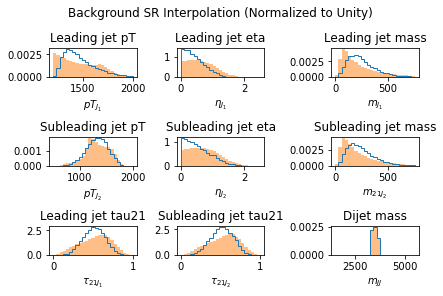

In [54]:
fakedata=graph_gan(generator, mode = "bg_SR")

In [55]:
CdjetGAN_FakeDATA=pd.DataFrame(pd.np.empty((0, 5)))  
CdjetGAN_FakeDATA.columns=['mjj','mj1','mj2','tau21j1','tau21j2'] 
CdjetGAN_FakeDATA['mjj']=fakedata[:,9]
CdjetGAN_FakeDATA['mj1']=fakedata[:,2]
CdjetGAN_FakeDATA['mj2']=fakedata[:,6]
CdjetGAN_FakeDATA['tau21j1']=fakedata[:,7]
CdjetGAN_FakeDATA['tau21j2']=fakedata[:,8]

D:\Users\Azure\anaconda3\envs\GPU\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  """Entry point for launching an IPython kernel.


In [56]:
CdjetGAN_FakeDATA

,mjj,mj1,mj2,tau21j1,tau21j2
0,3613.851074,214.965999,369.821175,0.343256,0.309915
1,3331.971924,165.469583,82.291108,0.673539,0.775833
2,3367.407471,164.244980,115.533901,0.505914,0.695269
3,3626.596191,471.613721,513.328331,0.375371,0.451376
4,3301.085449,56.009509,88.559202,0.719692,0.586598
...,...,...,...,...,...
19995,3407.148682,212.590846,324.593304,0.645693,0.531543
19996,3699.651367,205.545238,115.253326,0.499744,0.545631
19997,3320.862793,312.906947,96.796880,0.326649,0.519266
19998,3395.453613,403.115775,95.144794,0.584802,0.470531


In [58]:
CdjetGAN_FakeDATA.to_hdf('CdjetGAN_SR_int_FakeDATA.h5', key='CdjetGAN_FakeDATA', mode='w')